In [1]:
# Renormalización

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

def get_csv_files(folder_path):
    # Ensure folder_path is a Path object
    folder_path = Path(folder_path)

    # Check if the folder exists
    if not folder_path.exists() or not folder_path.is_dir():
        print(f"The directory {folder_path} does not exist or is not a directory.")
        return []

    # List all .csv files in the folder
    csv_files = [file for file in folder_path.iterdir() if file.is_file() and file.suffix == '.csv']

    return csv_files

def extract_number_before_letter(filename):
    # Use a regular expression to match the number before the first letter
    match = re.match(r"(\d+)([A-Za-z])", filename)
    
    if match:
        # Return the first matched group (the number before the letter)
        return match.group(1)
    else:
        # If the format does not match, return None or an appropriate value
        return None
        

def get_csv_data(csv_file, x_column, y_column, decimal = ".", delimiter = ","):
    """
    Reads a CSV file and returns the specified columns as a Pandas DataFrame.
    
    Args:
    csv_file (str): Path to the CSV file.
    x_column (str or int): The name or index of the column for the x-axis.
    y_column (str or int): The name or index of the column for the y-axis.
    
    Returns:
    pd.DataFrame: A DataFrame containing the specified x and y columns.
    """
    try:
        # Load the CSV file into a DataFrame (with header starting at row 9)
        data = pd.read_csv(csv_file, header=9, names =[x_column, y_column], decimal = decimal, delimiter = delimiter)

        # Extract the specified columns (either by name or index)
        x = data[x_column]  # x_column can be a name or index
        y = data[y_column]  # y_column can be a name or index
        
        # Return the data as a DataFrame
        return pd.DataFrame({x_column: x, y_column: y})

    except Exception as e:
        print(f"Error reading the CSV file or extracting columns: {e}")
        return None


def plot_csv_data(data, title=None, xlabel=None, ylabel=None):
    """
    Plots data from a Pandas DataFrame with the first column as the x-axis and the second column as the y-axis.
    
    Args:
    data (pd.DataFrame): A DataFrame containing x and y columns.
    title (str, optional): The title of the plot.
    xlabel (str, optional): The label for the x-axis.
    ylabel (str, optional): The label for the y-axis.
    """
    try:
        # Check if the data is valid
        if data is None or len(data) == 0:
            print("No data available to plot.")
            return

        # Plot the data
        plt.figure(figsize=(10, 6))
        plt.plot(data.iloc[:, 0], data.iloc[:, 1], label='Data', color='b', marker='.')

        # Add grid, labels, title, and legend
        plt.grid(True)
        plt.xlabel(xlabel if xlabel else data.columns[0])
        plt.ylabel(ylabel if ylabel else data.columns[1])
        plt.title(title if title else 'Plot from CSV')
        plt.legend()

        # Show the plot
        plt.show()

    except Exception as e:
        print(f"Error plotting the CSV data: {e}")



import pandas as pd
import matplotlib.pyplot as plt

def plot_csv_data_dict(data_dicts, title=None, xlabel=None, ylabel=None):
    """
    Plots multiple datasets from a list of dictionaries with data and optional settings.
    
    Args:
    data_dicts (list of dict): Each dictionary should contain 'data' (x, y values) and optional settings like 'label', 'color', 'linestyle'.
    title (str, optional): The plot title.
    xlabel (str, optional): The label for the x-axis.
    ylabel (str, optional): The label for the y-axis.
    """
    plt.figure(figsize=(10, 6))
    
    for data_dict in data_dicts:
        data = data_dict['data']
        x, y = data if isinstance(data, tuple) else (data.iloc[:, 0], data.iloc[:, 1])
        
        label = data_dict.get('label', 'Data')
        color = data_dict.get('color', 'b')
        linestyle = data_dict.get('linestyle', '-')
        
        plt.plot(x, y, label=label, color=color, linestyle=linestyle, marker='o')

    plt.grid(True)
    plt.xlabel(xlabel if xlabel else 'X-axis')
    plt.ylabel(ylabel if ylabel else 'Y-axis')
    plt.title(title if title else 'Plot from CSV')
    plt.legend()
    plt.show()


In [3]:
# El espejo de aluminio no es perfecto, 

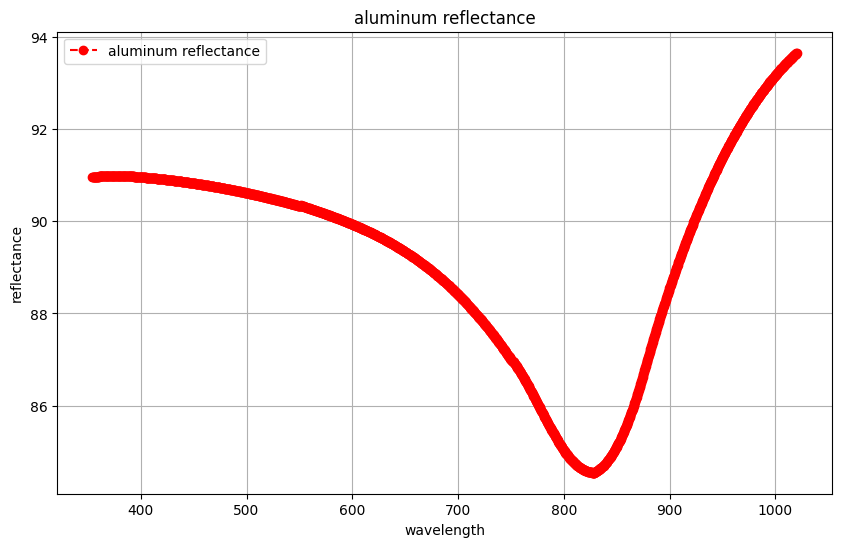

In [4]:
# Get the current directory
current_directory = Path.cwd()

wavelength_str = "wavelength [nm]"
counts_str = "counts"
reflectance_str = "reflectance [%R]"

aluminum_reflectance_file =  current_directory / "data" / "aluminum_mirror" / "aluminum_mirror_reflectance.csv"
aluminum_reflectance = get_csv_data(aluminum_reflectance_file, x_column= "wavelength", y_column = "reflectance", delimiter = ";", decimal = ",")

# Example usage:
data_dicts = [
    {'data': aluminum_reflectance , 'label': 'aluminum reflectance', 'color': 'r', 'linestyle': '--'},
]

plot_csv_data_dict(data_dicts, title="aluminum reflectance", xlabel="wavelength", ylabel= "reflectance")


In [5]:
#codigo de corrección

In [6]:
import pandas as pd

def correct_reflectance(bad_reflectance, aluminum_reflectance):
    """
    Corrects the bad reflectance data using aluminum reflectance data for each corresponding wavelength.
    If any wavelength is missing in aluminum_reflectance, linear interpolation is performed.

    Args:
    bad_reflectance (pd.DataFrame): The non-corrected reflectance data with wavelength and reflectance columns.
    aluminum_reflectance (pd.DataFrame): The aluminum reflectance data with wavelength and reflectance columns.

    Returns:
    pd.DataFrame: The corrected reflectance data.
    """
    # Merge the two datasets on the wavelength column
    merged_data = pd.merge(bad_reflectance, aluminum_reflectance, on="wavelength", how="left", suffixes=('_bad', '_aluminum'))

    # Check for missing wavelengths in the merged data
    if merged_data['reflectance_aluminum'].isnull().any():
        print("Warning: Some wavelengths from bad_reflectance are missing in aluminum_reflectance. Interpolating missing values.")
        
        # Perform interpolation to fill missing values in aluminum_reflectance
        merged_data['reflectance_aluminum'] = merged_data['reflectance_aluminum'].interpolate(method='linear', axis=0)

        # Check if any NaN values remain after interpolation
        if merged_data['reflectance_aluminum'].isnull().any():
            print("Warning: Some wavelengths could not be interpolated.")
    
    # Correct the reflectance: bad reflectance * aluminum reflectance for each wavelength
    merged_data['corrected_reflectance'] = merged_data['reflectance_bad'] * merged_data['reflectance_aluminum']/100

    # Return only the necessary columns
    return merged_data[['wavelength', 'corrected_reflectance']]



In [7]:
# Mediciones tomadas en 2024 

In [8]:
import os

# Get the current working directory
current_directory = os.getcwd()
print(current_directory)

C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment


In [9]:
from pathlib import Path

# Get the current directory
current_directory = Path.cwd()

# Define the path to the folder
craic_references_folder = current_directory / "data" / "20241101" / "Explicacion con Marcela"

# Print the folder path
print(craic_references_folder)

#
craic_darkscan_file = craic_references_folder / "darkscan.csv"
craic_refscan_file = craic_references_folder / "refscan.csv"

C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\data\20241101\Explicacion con Marcela


In [10]:
# Darkscan y Refscan del CRAIC sin filtro polarizador, usando espejo de aluminio

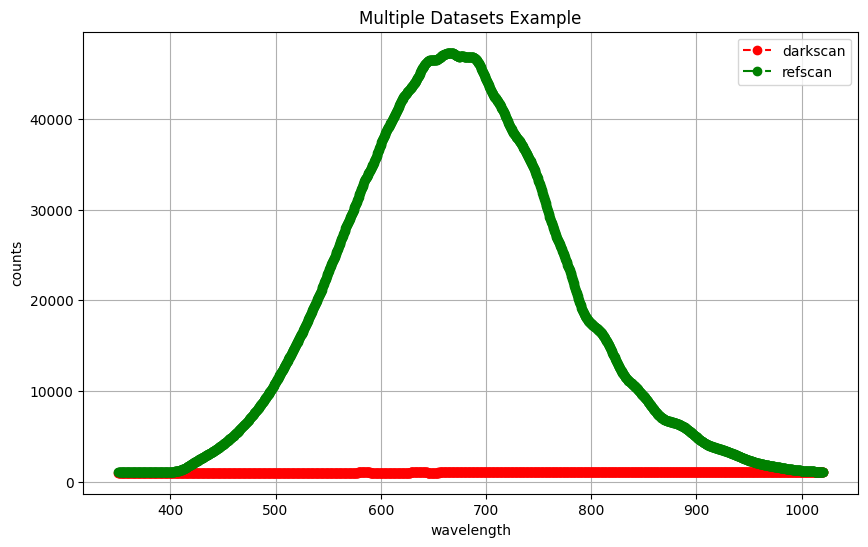

In [11]:
wavelength_str = "wavelength [nm]"
counts_str = "counts"
reflectance_str = "reflectance [%R]"

craic_darkscan = get_csv_data(craic_darkscan_file, x_column= "wavelength", y_column = "counts")
craic_refscan = get_csv_data(craic_refscan_file, x_column= "wavelength", y_column = "counts")

# Example usage:
data_dicts = [
    {'data': craic_darkscan , 'label': 'darkscan', 'color': 'r', 'linestyle': '--'},
    {'data': craic_refscan , 'label': 'refscan', 'color': 'g', 'linestyle': '-.'}
]

plot_csv_data_dict(data_dicts, title="Multiple Datasets Example", xlabel="wavelength", ylabel= "counts")


#plot_csv_data( data = craic_darkscan, title = "darkscan",  xlabel = wavelength_str, ylabel = counts_str)
#plot_csv_data( data = craic_refscan, title = "refscan",  xlabel = wavelength_str, ylabel = counts_str)

In [12]:
### Reflectancia total del espejo de aluminio:


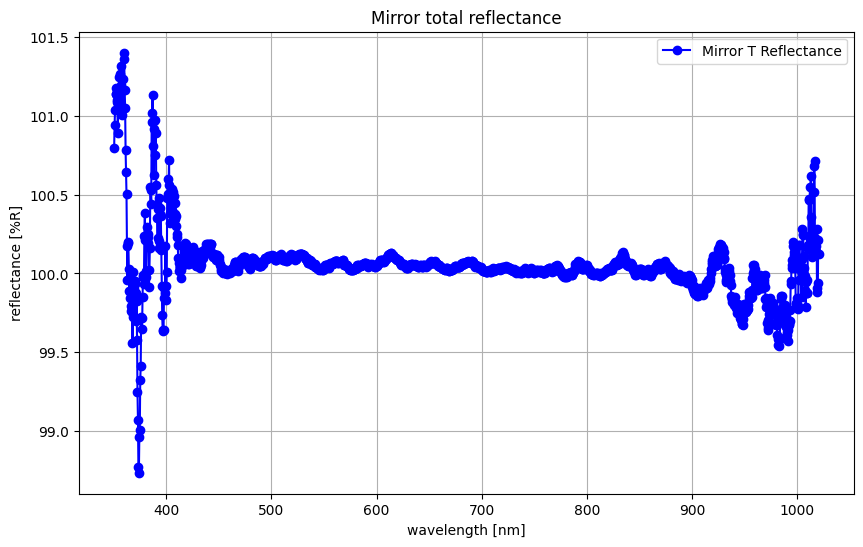

In [13]:
# Paths to CSV files
mirror_total_reflectance = craic_references_folder / "MIRROR_REFERENCE_T.csv"

# Get the data for both files
mirror_total_reflectance = get_csv_data(mirror_total_reflectance, x_column="wavelength", y_column="reflectance")

# Prepare the data for plotting (using the dictionary format for each plot)
data_dicts = [
    {'data': mirror_total_reflectance, 'label': 'Mirror T Reflectance', 'color': 'b', 'linestyle': '-'},
    #{'data': filtro_R_reflectancia, 'label': 'Filtro R Reflectance', 'color': 'm', 'linestyle': '--'}
]

# Plot the data
plot_csv_data_dict(data_dicts, title="Mirror total reflectance", xlabel=wavelength_str, ylabel=reflectance_str)

In [14]:
#### Nótese que el espejo refleja un 100% entre 410 y 900 nanómetros. TODO: Calcular SNR

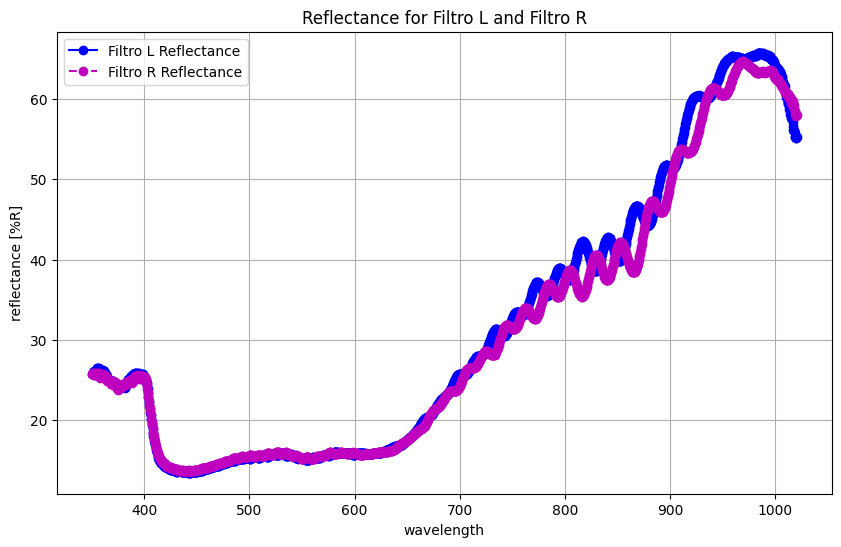

In [15]:
# Define the strings for axis labels
wavelength_str = "wavelength"
counts_str = "counts"
reflectance_str = "reflectance [%R]"

# Paths to CSV files
filtro_L_file = craic_references_folder / "FILTRO-L.csv"
filtro_R_file = craic_references_folder / "FILTRO-R.csv"

# Get the data for both files
filtro_L_reflectancia = get_csv_data(filtro_L_file, x_column="wavelength", y_column="reflectance")
filtro_R_reflectancia = get_csv_data(filtro_R_file, x_column="wavelength", y_column="reflectance")

# Prepare the data for plotting (using the dictionary format for each plot)
data_dicts = [
    {'data': filtro_L_reflectancia, 'label': 'Filtro L Reflectance', 'color': 'b', 'linestyle': '-'},
    {'data': filtro_R_reflectancia, 'label': 'Filtro R Reflectance', 'color': 'm', 'linestyle': '--'}
]

# Plot the data
plot_csv_data_dict(data_dicts, title="Reflectance for Filtro L and Filtro R", xlabel=wavelength_str, ylabel=reflectance_str)


In [16]:
# Nótese que la región donde los filtros se comportan de manera casi constante es entre 450 y 650 nm 

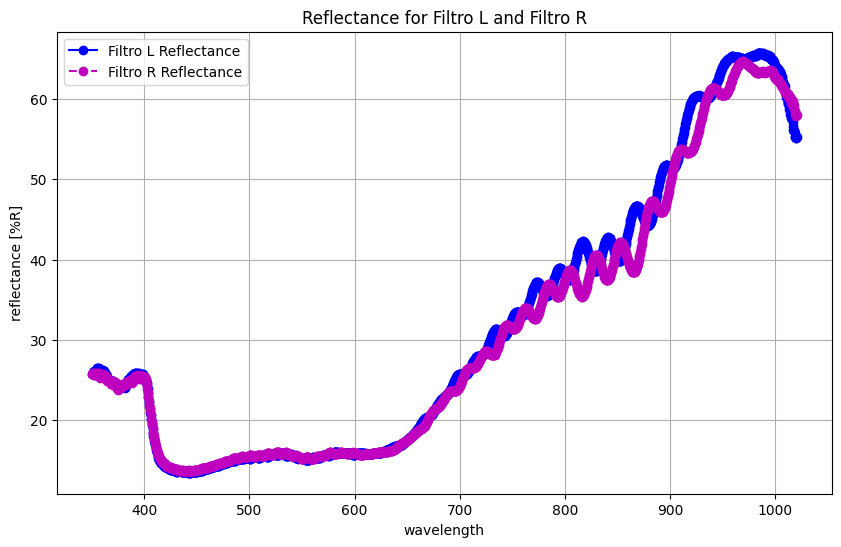

In [17]:
# Paths to CSV files
filtro_L_file = craic_references_folder / "FILTRO-L.csv"
filtro_R_file = craic_references_folder / "FILTRO-R.csv"

# Get the data for both files
filtro_L_reflectancia = get_csv_data(filtro_L_file, x_column="wavelength", y_column="reflectance")
filtro_R_reflectancia = get_csv_data(filtro_R_file, x_column="wavelength", y_column="reflectance")

# Prepare the data for plotting (using the dictionary format for each plot)
data_dicts = [
    {'data': filtro_L_reflectancia, 'label': 'Filtro L Reflectance', 'color': 'b', 'linestyle': '-'},
    {'data': filtro_R_reflectancia, 'label': 'Filtro R Reflectance', 'color': 'm', 'linestyle': '--'}
]

# Plot the data
plot_csv_data_dict(data_dicts, title="Reflectance for Filtro L and Filtro R", xlabel=wavelength_str, ylabel=reflectance_str)

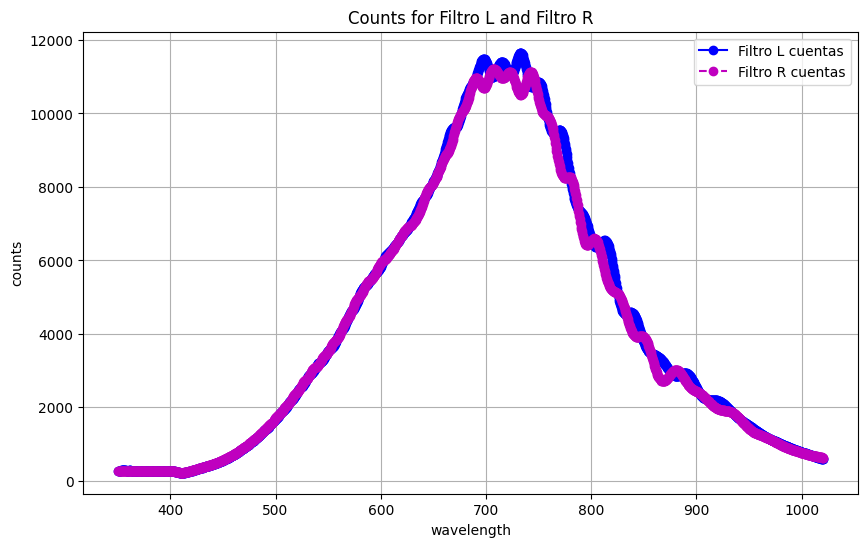

In [18]:
#Ahora calcula las cuentas para el filtro L y R

# Get the data for both files
craic_L_refscan = pd.DataFrame([])
craic_R_refscan = pd.DataFrame([])
craic_L_refscan["wavelength"] = filtro_L_reflectancia["wavelength"]
craic_R_refscan["wavelength"] = filtro_R_reflectancia["wavelength"]
craic_L_refscan["counts"] = filtro_L_reflectancia["reflectance"] * craic_refscan["counts"] / 100
craic_R_refscan["counts"] = filtro_R_reflectancia["reflectance"] * craic_refscan["counts"] / 100

# Prepare the data for plotting (using the dictionary format for each plot)
data_dicts = [
    {'data': craic_L_refscan, 'label': 'Filtro L cuentas', 'color': 'b', 'linestyle': '-'},
    {'data': craic_R_refscan, 'label': 'Filtro R cuentas', 'color': 'm', 'linestyle': '--'}
]

# Plot the data
plot_csv_data_dict(data_dicts, title="Counts for Filtro L and Filtro R", xlabel=wavelength_str, ylabel=counts_str)

In [19]:
# C_aurigans-variacion-color

In [20]:

def check_files_exist(folder_basename, current_directory):
    folder_path = current_directory / "data" / "Estudio-espectral-escarabajos" / folder_basename

    # Paths to CSV files
    darkscan_file = folder_path / "darkscan.csv"
    refscan_file = folder_path / "refscan.csv"

    # Return True if both files exist, otherwise False
    return darkscan_file.exists() and refscan_file.exists()
    
def get_spectral_data(folder_basename, current_directory):
    folder_path = current_directory / "data" / "Estudio-espectral-escarabajos" / folder_basename

    # Paths to CSV files
    darkscan_file = folder_path / "darkscan.csv"
    refscan_file = folder_path / "refscan.csv"

    # Get the data for both files
    darkscan = get_csv_data(darkscan_file, x_column="wavelength", y_column="counts")
    refscan = get_csv_data(refscan_file, x_column="wavelength", y_column="counts")

    # Prepare data for plotting
    data_dicts = [
        {'name': "darkscan",'data': darkscan, 'label': 'darkscan', 'color': 'b', 'linestyle': '-'},
        {'name': "refscan",'data': refscan, 'label': 'refscan', 'color': 'm', 'linestyle': '--'}
    ]

    return data_dicts
    
def plot_spectral_data(folder_basename, current_directory):
    
    data_dicts = get_spectral_data(folder_basename, current_directory)
    # Plot the data
    plot_csv_data_dict(data_dicts, title=f"refscan and darkscan for {folder_basename}", xlabel=wavelength_str, ylabel=reflectance_str)



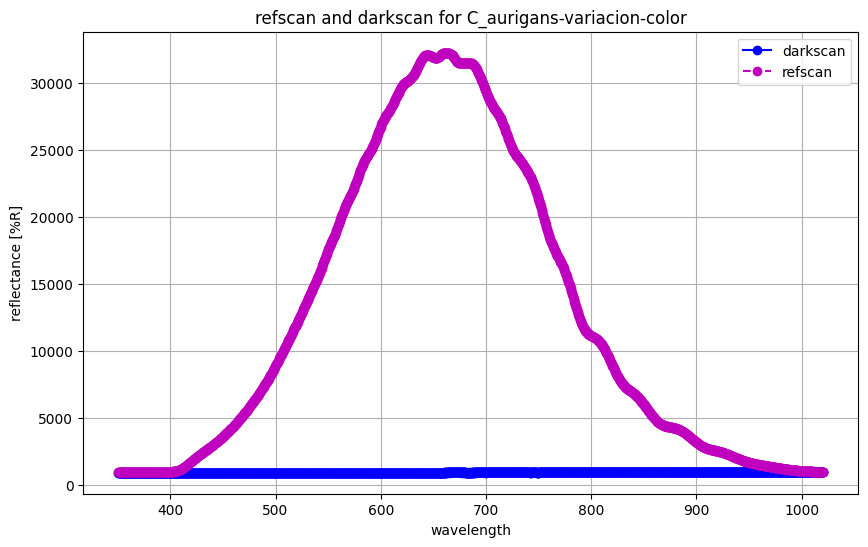

In [21]:
folder_basename = "C_aurigans-variacion-color"

plot_spectral_data(folder_basename, current_directory)

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9961


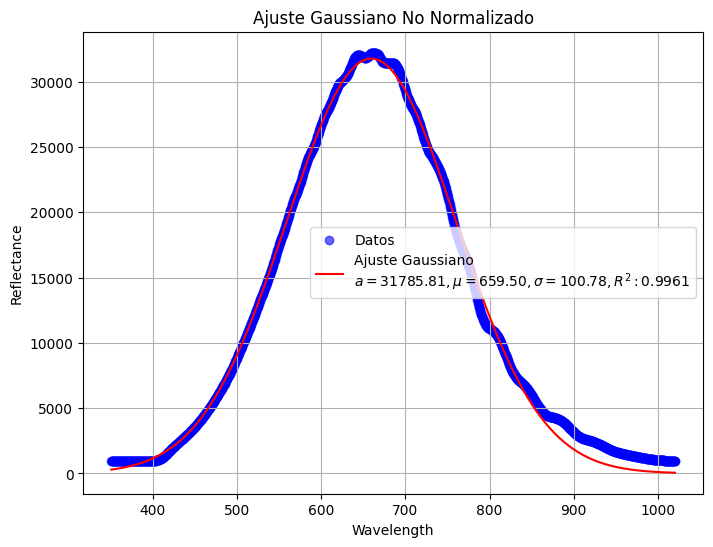

(np.float64(31785.809421909908),
 np.float64(659.5015094156282),
 np.float64(100.77753294322865),
 np.float64(0.9961444798288667))

In [22]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.optimize import curve_fit

def evaluar_gaussianidad(df):
    
    # Función gaussiana no normalizada
    def gaussian(x, a, mu, sigma):
        return a * np.exp(-0.5 * ((x - mu) / sigma) ** 2)
    
    print(df.columns)
    # Extraer columnas del dataframe
    x_data = df['wavelength'].values
    y_data = df['counts'].values
    
    # Ajuste de la curva gaussiana
    popt, pcov = curve_fit(gaussian, x_data, y_data, p0=[max(y_data), np.mean(x_data), np.std(x_data)], maxfev=10000)
    
    # Parámetros óptimos
    a, mu, sigma = popt
    
    # Generar datos para la curva ajustada
    x_fit = np.linspace(min(x_data), max(x_data), 500)
    y_fit = gaussian(x_fit, a, mu, sigma)

    # Calcular los valores ajustados
    y_fit_data = gaussian(x_data, *popt)
    
    # Calcular SS_res y SS_tot
    ss_res = np.sum((y_data - y_fit_data) ** 2)
    ss_tot = np.sum((y_data - np.mean(y_data)) ** 2)
    
    # Calcular R^2
    r2 = 1 - (ss_res / ss_tot)
    
    # Imprimir el valor de R^2
    print(f"Coeficiente de Determinación (R^2): {r2:.4f}")
    
    # Graficar los datos originales y el ajuste
    plt.figure(figsize=(8, 6))
    plt.scatter(x_data, y_data, label="Datos", color="blue", alpha=0.6)
    plt.plot(x_fit, y_fit, label=f"Ajuste Gaussiano \n$a={a:.2f}, \\mu={mu:.2f}, \\sigma={sigma:.2f}, R^2: {r2:.4f}$", color="red")
    plt.xlabel("Wavelength")
    plt.ylabel("Reflectance")
    plt.title("Ajuste Gaussiano No Normalizado")
    plt.legend()
    plt.grid()
    plt.show()

    
    return a, mu, sigma, r2


dict_1 = get_spectral_data(folder_basename, current_directory)[1]
columnas = dict_1["data"].columns
df = dict_1["data"]
print(columnas)
evaluar_gaussianidad(df)

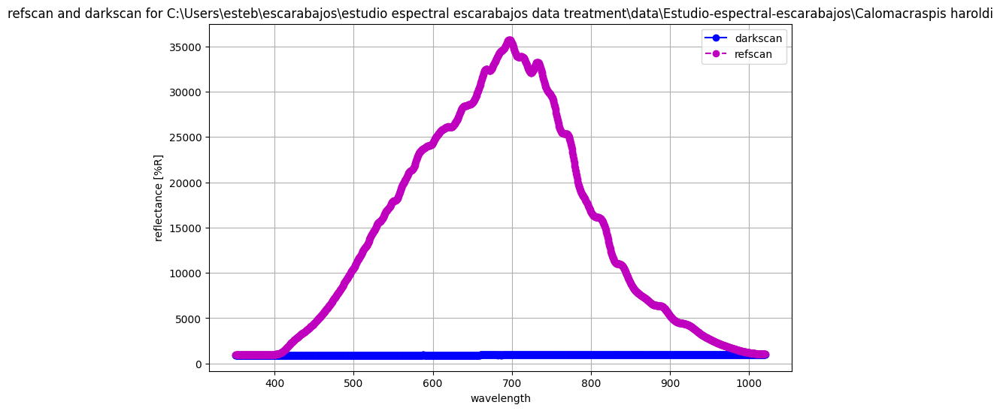

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9852


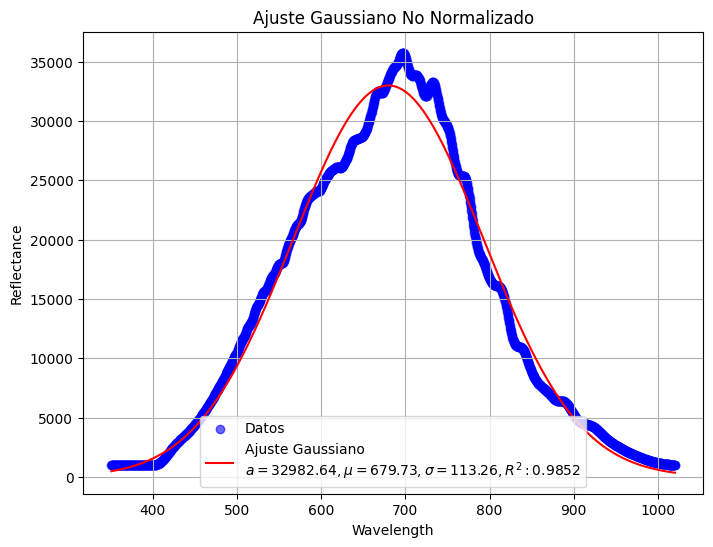

Parece que C_aurigans-variacion-color fue normalizado con polarización. Hay que deshacer el efecto del filtro
[WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Calomacraspis haroldi/592808L1.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Calomacraspis haroldi/darkscan.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Calomacraspis haroldi/refscan.csv')]
{'592808'}
Ocurrió un error al crear o escribir en el archivo: [Errno 2] No such file or directory: 'C:\\Users\\esteb\\escarabajos\\estudio espectral escarabajos data treatment\\normalized_data\\Calomacraspis haroldi\\README.txt'


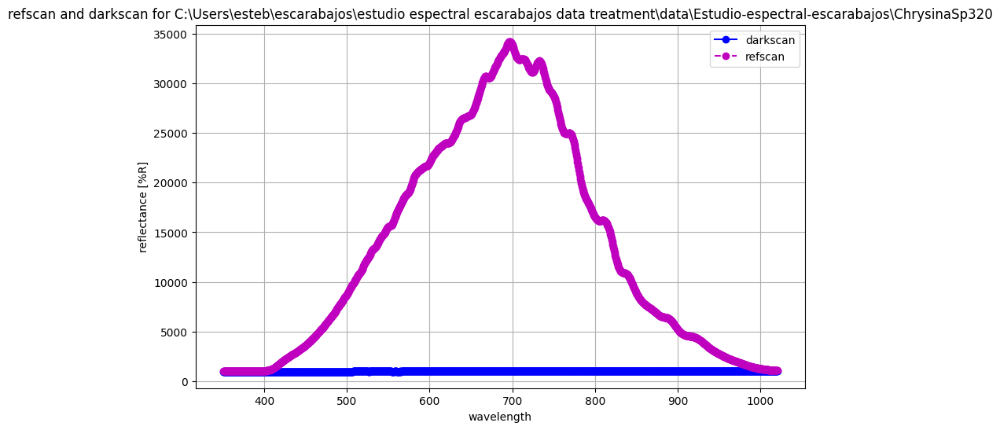

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9854


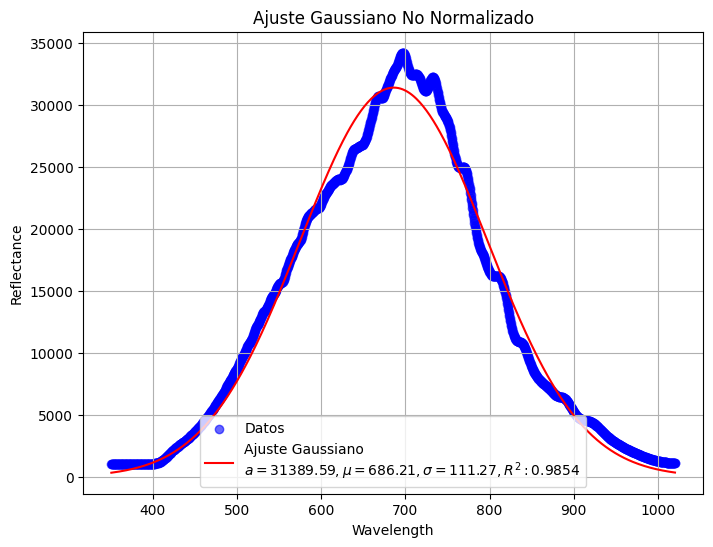

Parece que C_aurigans-variacion-color fue normalizado con polarización. Hay que deshacer el efecto del filtro
[WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/ChrysinaSp320/1717606L1.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/ChrysinaSp320/1717606L2.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/ChrysinaSp320/1717606L3.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/ChrysinaSp320/1717606R1.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/ChrysinaSp320/1717606R2.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/ChrysinaSp320/

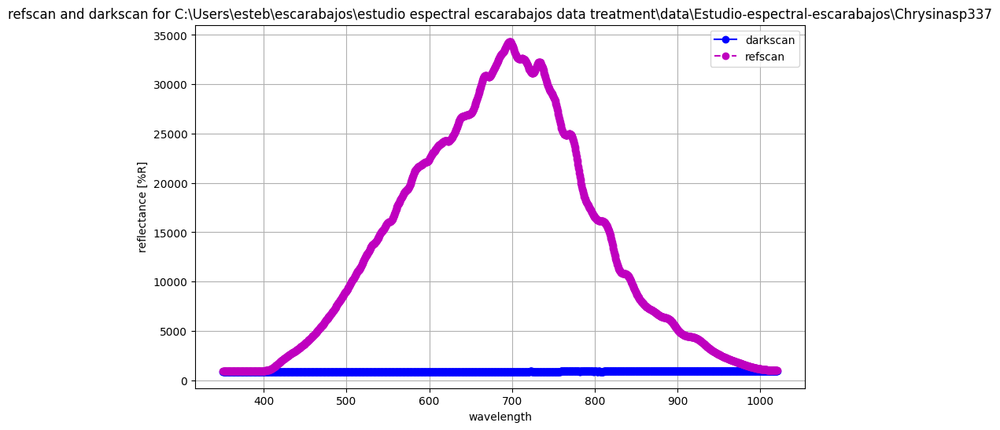

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9852


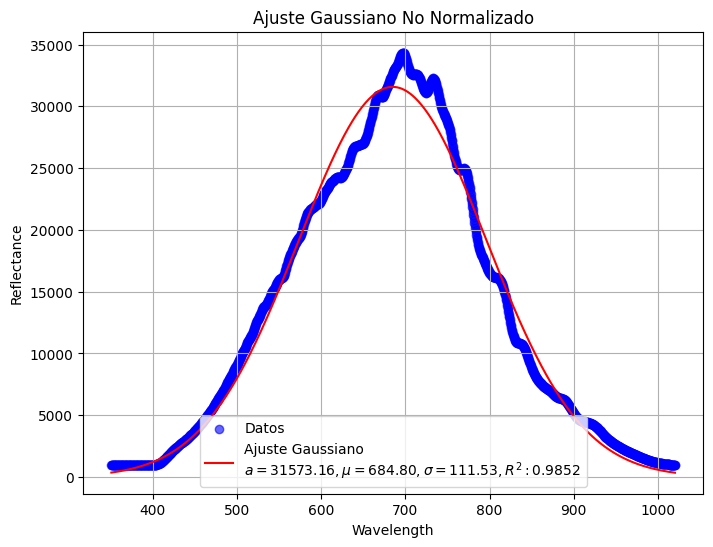

Parece que C_aurigans-variacion-color fue normalizado con polarización. Hay que deshacer el efecto del filtro
[WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Chrysinasp337/3165406L1.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Chrysinasp337/3165406L2.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Chrysinasp337/3165406L3.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Chrysinasp337/3165406R1.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Chrysinasp337/3165406R2.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Chrysinasp337/

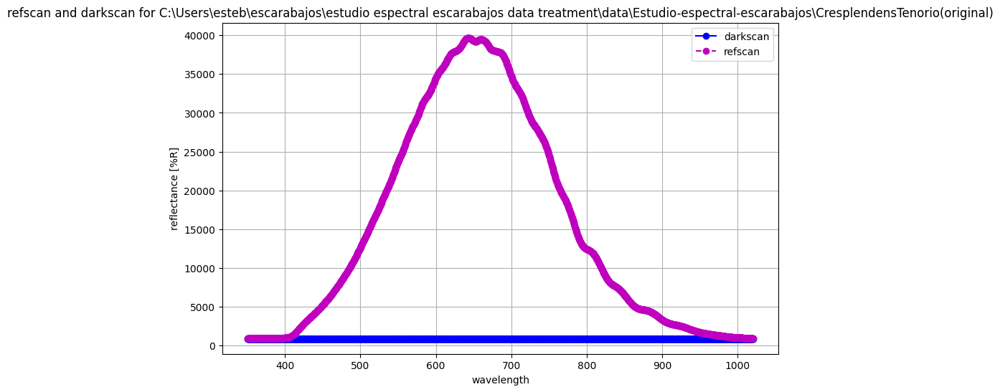

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9972


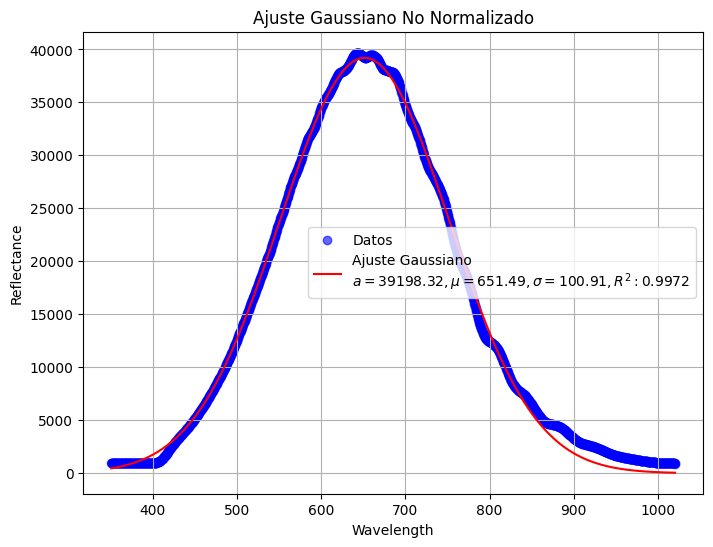

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\CresplendensTenorio(original)\README.txt


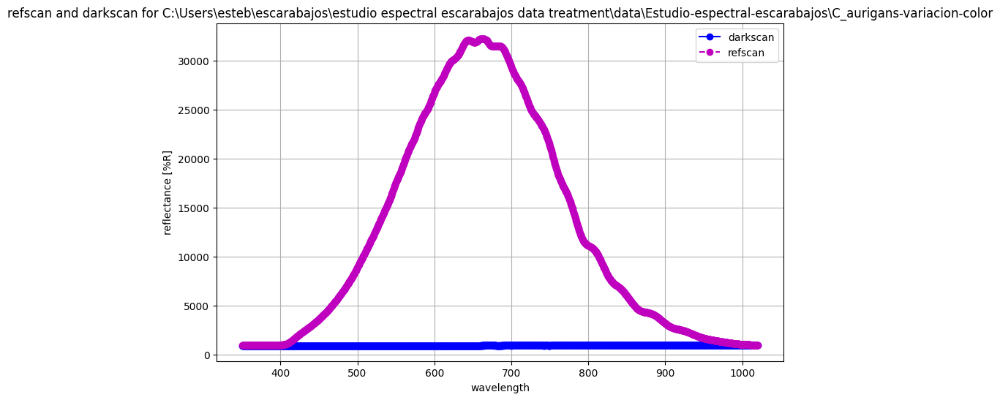

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9961


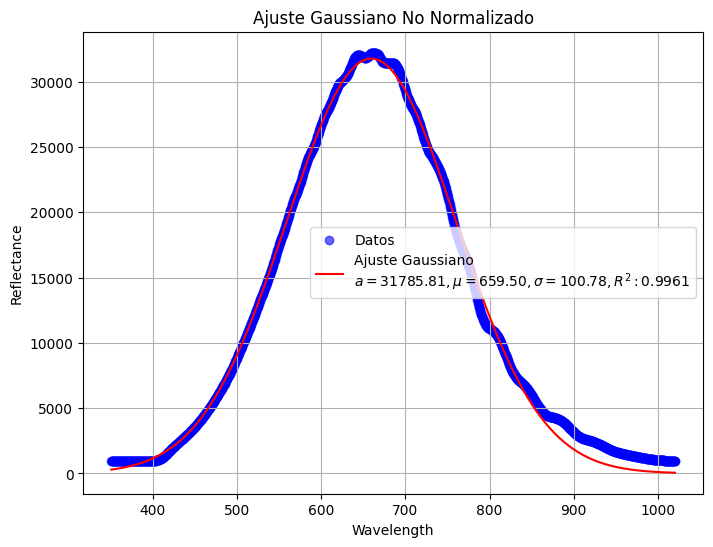

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\C_aurigans-variacion-color\README.txt


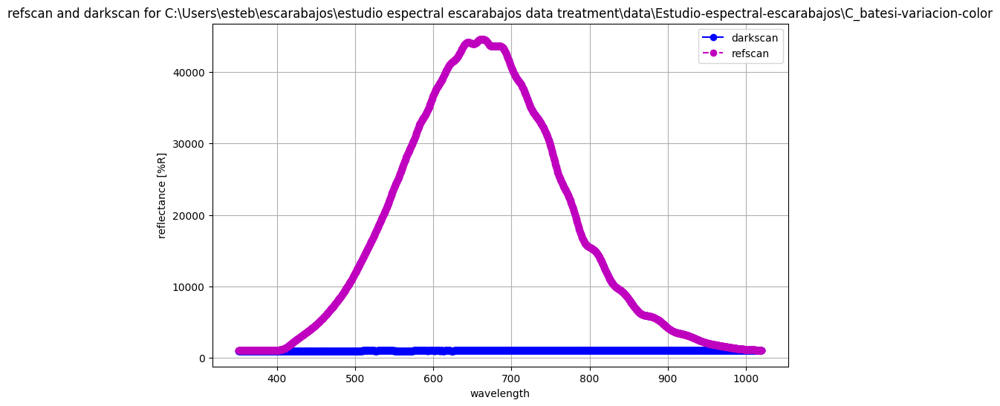

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9967


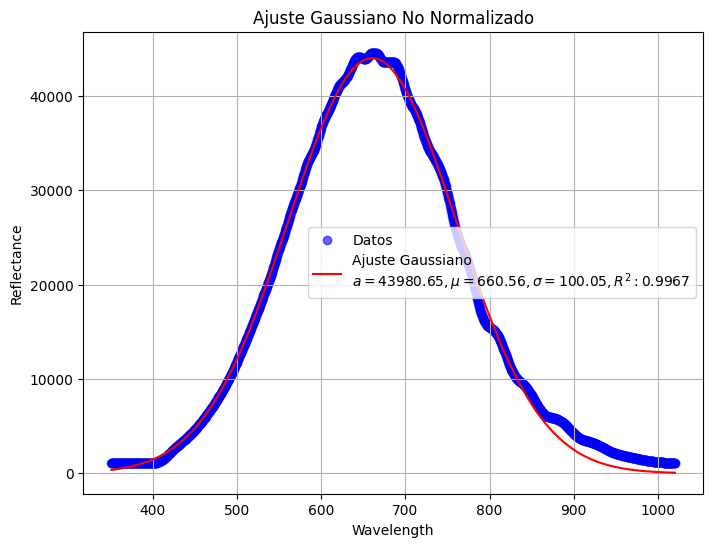

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\C_batesi-variacion-color\README.txt


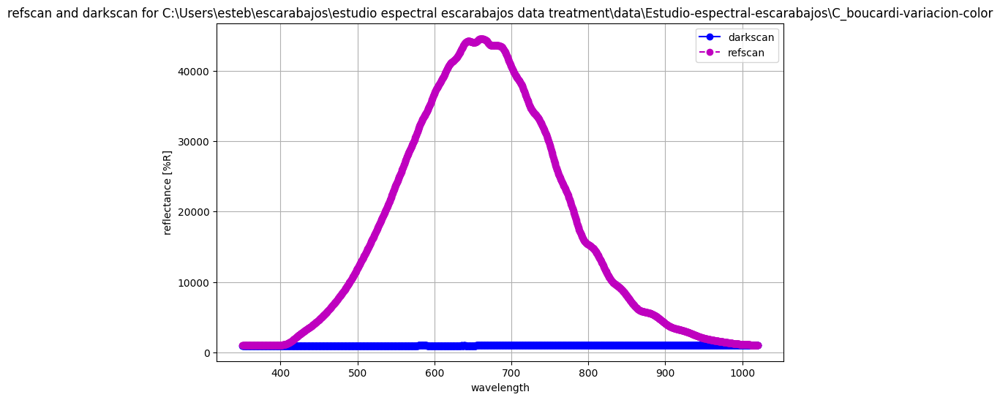

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9970


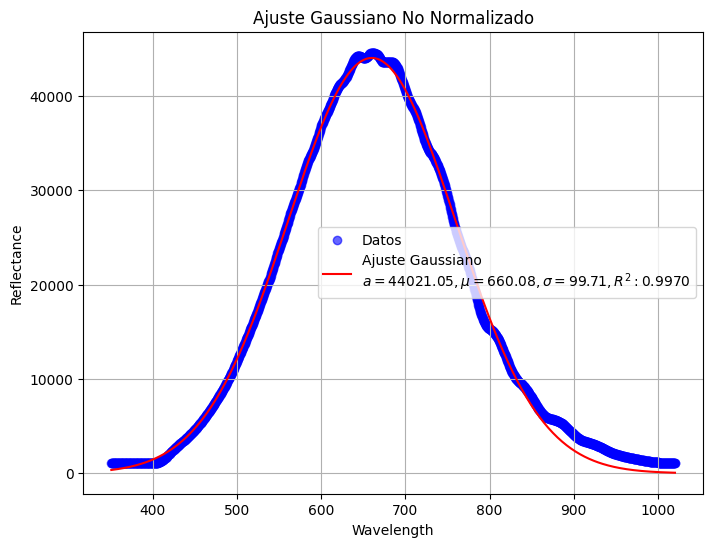

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\C_boucardi-variacion-color\README.txt


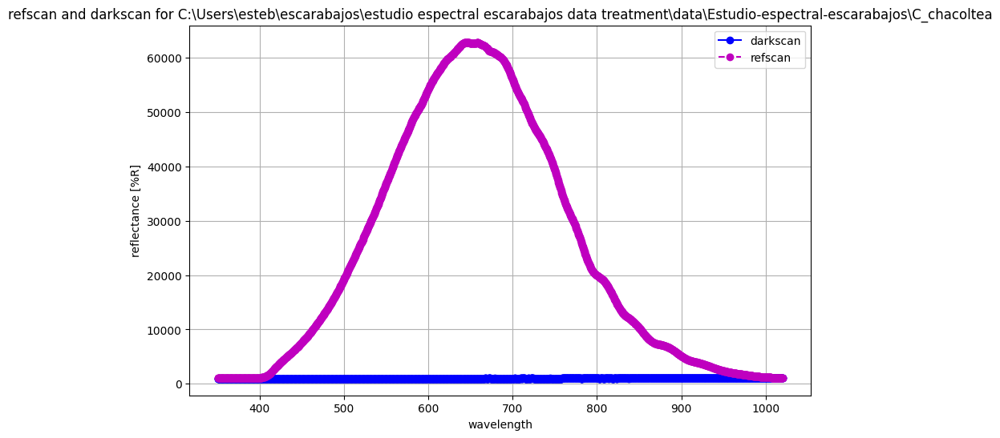

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9977


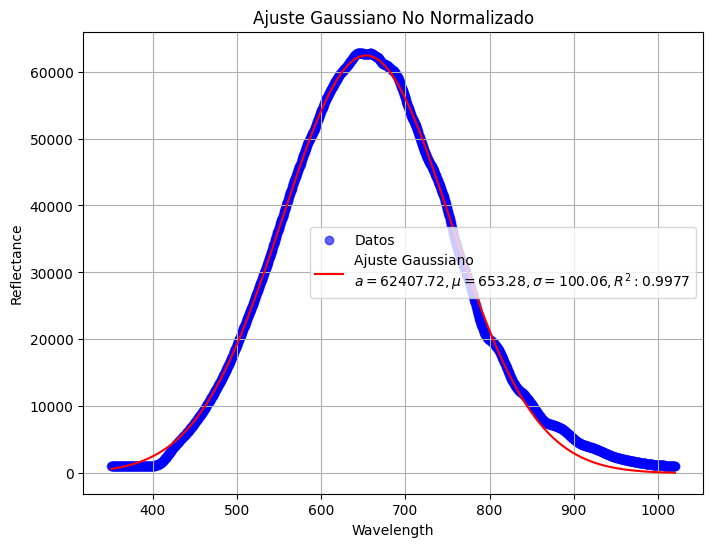

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\C_chacoltea\README.txt


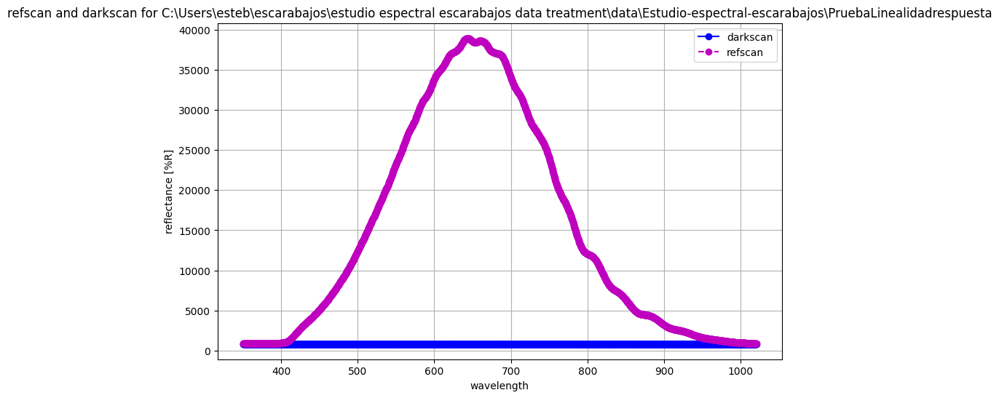

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9972


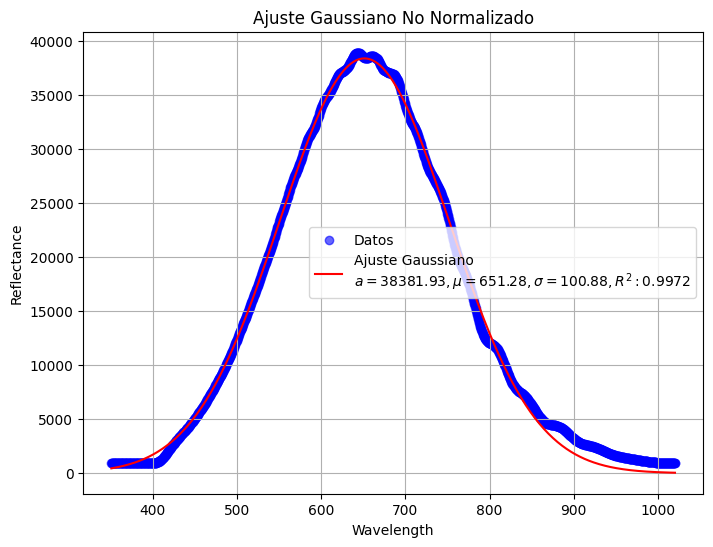

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\PruebaLinealidadrespuesta\README.txt


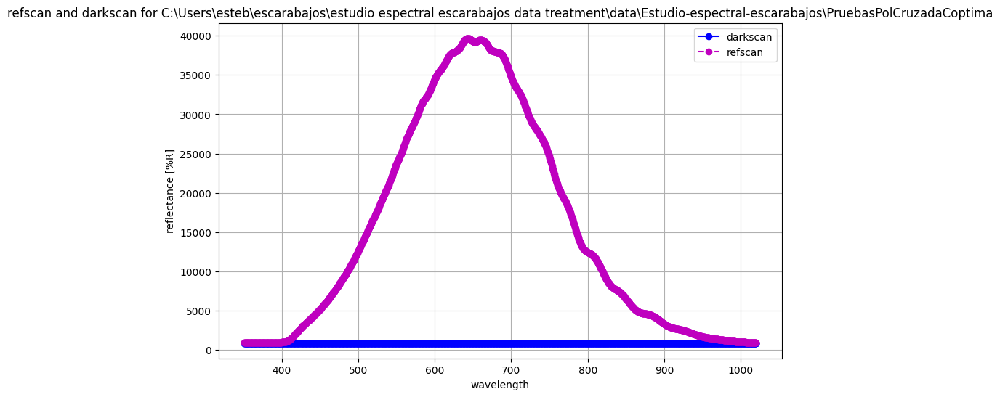

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9972


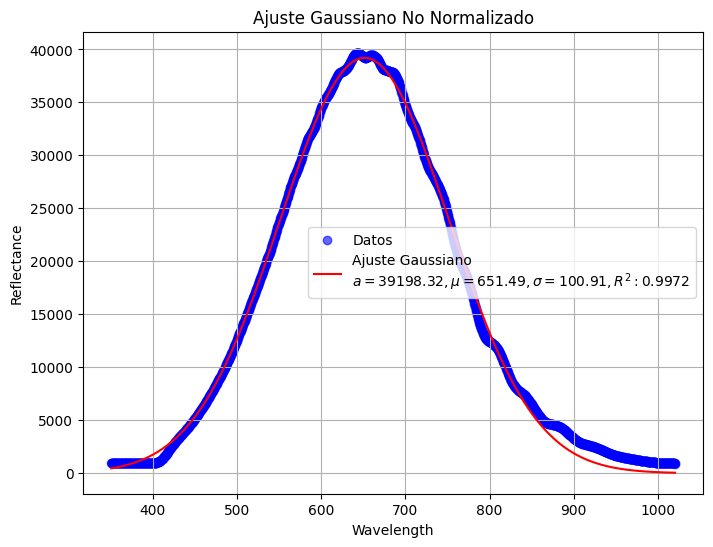

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\PruebasPolCruzadaCoptima\README.txt


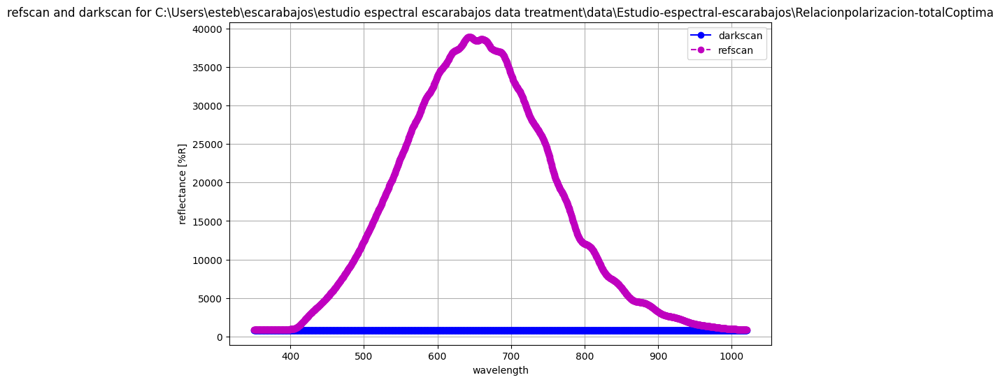

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9972


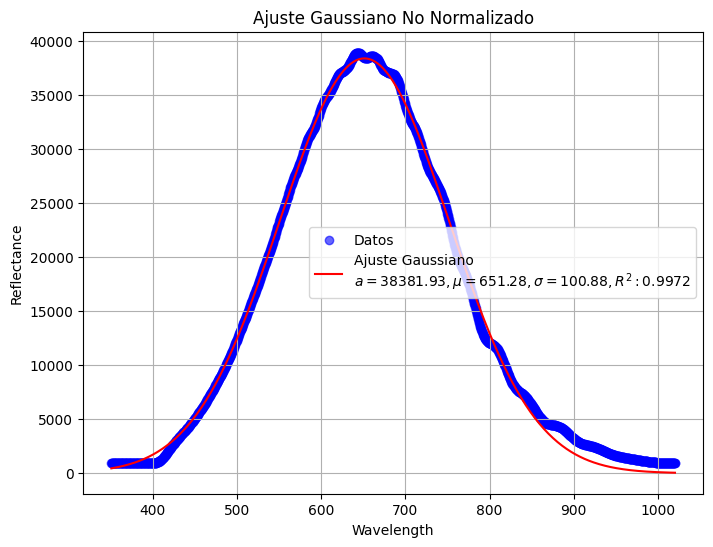

Parece que C_aurigans-variacion-color fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
Texto agregado correctamente a C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\normalized_data\Relacionpolarizacion-totalCoptima\README.txt


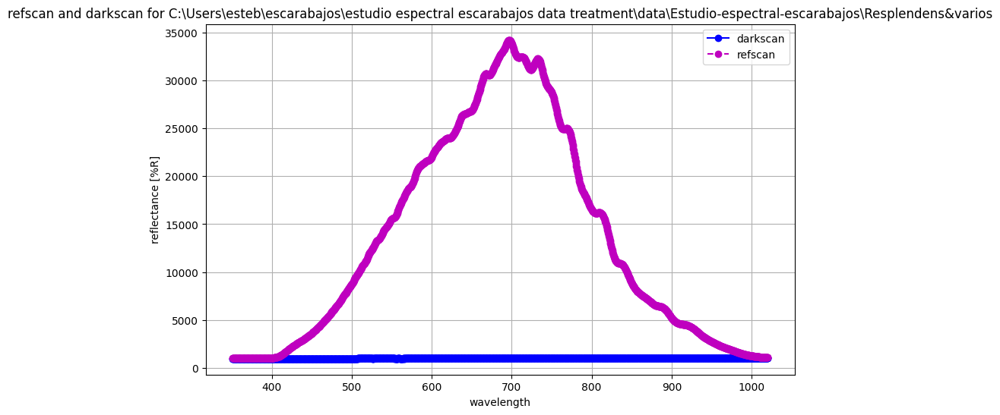

Index(['wavelength', 'counts'], dtype='object')
Index(['wavelength', 'counts'], dtype='object')
Coeficiente de Determinación (R^2): 0.9854


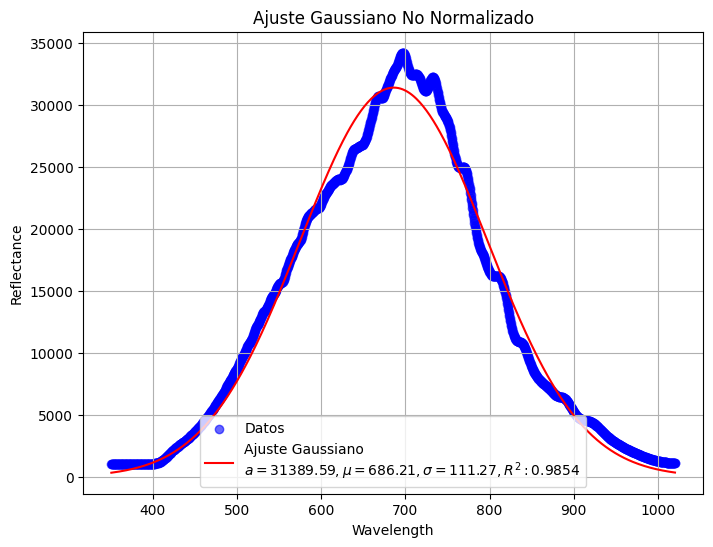

Parece que C_aurigans-variacion-color fue normalizado con polarización. Hay que deshacer el efecto del filtro
[WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Resplendens&varios/1037308L1.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Resplendens&varios/1037308L2.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Resplendens&varios/1037308L3.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Resplendens&varios/1037308R1.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-escarabajos/Resplendens&varios/1037308R2.csv'), WindowsPath('C:/Users/esteb/escarabajos/estudio espectral escarabajos data treatment/data/Estudio-espectral-e

In [23]:
#Vamos a evaluar normalidad para todos los espectros
from pathlib import Path

import shutil
import os

import re
import pandas as pd
import numpy as np

report_string = ""

def calcular_minimos_cuadrados(refscan, refscan_filtro_derecho, refscan_filtro_izquierdo):
    """
    Compara refscan con los filtros (derecho e izquierdo) usando mínimos cuadrados
    y devuelve el valor de los mínimos cuadrados para cada comparación. 
    Antes de hacer el cálculo, normaliza cada dataframe dividiendo por su valor máximo.

    Args:
        refscan (pd.DataFrame): DataFrame con las columnas 'wavelength' y 'counts' para el refscan.
        refscan_filtro_derecho (pd.DataFrame): DataFrame con las columnas 'wavelength' y 'counts' para el filtro derecho.
        refscan_filtro_izquierdo (pd.DataFrame): DataFrame con las columnas 'wavelength' y 'counts' para el filtro izquierdo.

    Returns:
        tuple: (filtro_mas_similar, valor_minimos_cuadrados_derecho, valor_minimos_cuadrados_izquierdo)
    """
    
    # Alinear las longitudes de los DataFrames para asegurar comparaciones correctas
    refscan = refscan.set_index('wavelength')
    refscan_filtro_derecho = refscan_filtro_derecho.set_index('wavelength')
    refscan_filtro_izquierdo = refscan_filtro_izquierdo.set_index('wavelength')
    
    # Asegurarse de que todos los dataframes tengan los mismos índices
    wavelengths_comunes = refscan.index.intersection(refscan_filtro_derecho.index).intersection(refscan_filtro_izquierdo.index)
    
    refscan = refscan.loc[wavelengths_comunes]
    refscan_filtro_derecho = refscan_filtro_derecho.loc[wavelengths_comunes]
    refscan_filtro_izquierdo = refscan_filtro_izquierdo.loc[wavelengths_comunes]
    
    # Normalizar los datos dividiendo por su valor máximo
    refscan['counts'] = refscan['counts'] / refscan['counts'].max()
    refscan_filtro_derecho['counts'] = refscan_filtro_derecho['counts'] / refscan_filtro_derecho['counts'].max()
    refscan_filtro_izquierdo['counts'] = refscan_filtro_izquierdo['counts'] / refscan_filtro_izquierdo['counts'].max()
    
    # Calcular los errores cuadráticos para el filtro derecho
    errores_derecho = np.sum((refscan['counts'] - refscan_filtro_derecho['counts'])**2)
    
    # Calcular los errores cuadráticos para el filtro izquierdo
    errores_izquierdo = np.sum((refscan['counts'] - refscan_filtro_izquierdo['counts'])**2)
    
    # Determinar cuál filtro tiene el menor valor de mínimos cuadrados
    if errores_derecho < errores_izquierdo:
        filtro_mas_similar = 'filtro derecho'
        valor_minimos_cuadrados = errores_derecho
    else:
        filtro_mas_similar = 'filtro izquierdo'
        valor_minimos_cuadrados = errores_izquierdo
    
    return filtro_mas_similar, valor_minimos_cuadrados, errores_derecho, errores_izquierdo


# Ejemplo de uso
# Aquí deberías tener tus dataframes cargados como refscan, refscan_filtro_derecho, refscan_filtro_izquierdo
# Ejemplo:
# valor_minimos, filtro_similar = calcular_minimos_cuadrados(refscan, refscan_filtro_derecho, refscan_filtro_izquierdo)


def comparar_min_cuadrados(refscan, refscan_derecha, refscan_izquierda):
    dif_derecha = np.sum((refscan["counts"] - refscan_derecha["counts"])**2)
    dif_izquierda = np.sum((refscan["counts"] - refscan_izquierda["counts"])**2)

    if dif_derecha> dif_izquierda:
        return "L", dif_derecha, dif_izquierda
    else:
        return "R", dif_derecha, dif_izquierda

def crear_y_escribir_readme(ruta_archivo, texto):
    """
    Crea un archivo README.md y agrega texto. Si el archivo no existe, lo crea. Si ya existe,
    agrega el texto al final.

    Args:
        ruta_archivo (str): Ruta completa al archivo README.md.
        texto (str): Texto que se escribirá o agregará al archivo.

    Returns:
        None
    """
    try:
        # Abrir el archivo en modo 'w' para crearlo si no existe, o en modo 'a' para agregar texto si ya existe
        with open(ruta_archivo, "a", encoding="utf-8") as archivo:
            archivo.write(texto + "\n")
        print(f"Texto agregado correctamente a {ruta_archivo}")
    except Exception as e:
        print(f"Ocurrió un error al crear o escribir en el archivo: {e}")
        

def copy_file(source_path, destination_folder):
    """
    Copies a file from the source path to the destination folder.

    Args:
        source_path (str): The full path to the file to be copied.
        destination_folder (str): The folder where the file will be copied.

    Returns:
        str: The full path to the copied file.
    """
    try:
        # Ensure the destination folder exists
        os.makedirs(destination_folder, exist_ok=True)

        # Copy the file to the destination folder
        destination_path = shutil.copy(source_path, destination_folder)

        #print(f"File copied successfully to {destination_path}")
        return destination_path
    except Exception as e:
        print(f"An error occurred: {e}")
        return None


def list_subfolders(parent_folder):
    parent_path = Path(parent_folder)
    
    # List all immediate subfolders
    subfolders = [f for f in parent_path.iterdir() if f.is_dir()]
    
    return subfolders

def list_files(parent_folder):
    parent_path = Path(parent_folder)
    
    # List all immediate subfolders
    files = [f for f in parent_path.iterdir() if f.is_file()]
    
    return files

def get_codes(file_list):
    codes = [
    extract_number_before_letter(Path(file).name)
    for file in file_list
    ]
    codes = [code for code in codes if code != None]
    codes = set(codes)
     
    return codes
    
import pandas as pd
import os

def corregir_efecto_filtro(file_R, file_L, tipo_de_filtro, carpeta_destino="corrected_data"):
    """
    Corrige el efecto del filtro en los datos de los archivos de entrada (R y L),
    dependiendo del tipo de filtro ('L' o 'R').

    Args:
        file_R (str): Ruta al archivo con datos de reflectancia para el filtro R.
        file_L (str): Ruta al archivo con datos de reflectancia para el filtro L.
        tipo_de_filtro (str): Tipo de filtro ('L' o 'R').
        carpeta_destino (str): Carpeta donde se guardarán los archivos corregidos. Default es 'corrected_data'.

    Returns:
        pd.DataFrame: DataFrame con las reflectancias corregidas.
    """
    
    # Crear la carpeta destino si no existe
    if not os.path.exists(carpeta_destino):
        os.makedirs(carpeta_destino)

    # Leer los archivos R y L
    df_R = get_csv_data(file_R, x_column= "wavelength", y_column = "reflectance")
    df_L = get_csv_data(file_L, x_column= "wavelength", y_column = "reflectance")

    print("Data R:", df_R)
    print("Data L:", df_L)
    
    # Determinar si es de tipo L o R según el tipo de filtro
    basename_R = (file_R.name)
    basename_L = (file_L.name)

    # Crear DataFrame para los resultados
    resultado_df = pd.DataFrame()
    resultado_df["wavelength"] = df_R['wavelength']  # Suponemos que los dos archivos tienen la misma columna 'wavelength'
    
    if tipo_de_filtro == "R":
        # Si el tipo de filtro es R, usamos los datos de R directamente
        resultado_df["R"] = df_R['reflectance']
        # Corregir los datos en file_L
        reflectancia_L = df_L['reflectance'] * craic_R_refscan["counts"] / craic_L_refscan["counts"]
        resultado_df["L"] = reflectancia_L
    elif tipo_de_filtro == "L":
        # Si el tipo de filtro es L, usamos los datos de L directamente
        resultado_df["L"] = df_L['reflectance']
        # Corregir los datos en file_R
        reflectancia_R = df_R['reflectance'] * craic_L_refscan["counts"] / craic_R_refscan["counts"]
        resultado_df["R"] = reflectancia_R

    # Calcular la reflectancia total T como la suma de reflectancia L y R
    if 'L' in resultado_df.columns and 'R' in resultado_df.columns:
        reflectancia_T = resultado_df['R'] + resultado_df['L']
        resultado_df['reflectance'] = reflectancia_T

    # Guardar el dataframe resultante en la carpeta destino
    basename = os.path.basename(file_R)  # Usamos basename de file_R para el nombre de salida
    numeros = re.match(r"(\d+)[A-Za-z]", basename)  # Captura los números antes de la letra
    if numeros:
        nombre_salida = numeros.group(1) + "_T.csv"  # Usar solo los números y agregar "_T.csv"
    else:
        # Si no se encuentra el formato esperado, se usa un nombre por defecto
        nombre_salida = basename.replace(".csv", "_T.csv")
    
    ruta_salida = os.path.join(carpeta_destino, nombre_salida)
    resultado_df.to_csv(ruta_salida, index=False)

    print(f"Archivo corregido guardado en: {ruta_salida}")
    
    return resultado_df


subfolders = list_subfolders(current_directory / "data" / "Estudio-espectral-escarabajos")

report_string += f"Lista de subfolders: \n {subfolders}"
#print(subfolders)

for folder in subfolders:
    
    subfolder = folder

    report_string += f"\n \033[32m subfolder: {subfolder} \033[0m"
    
    if check_files_exist(subfolder, current_directory):
        
        plot_spectral_data(subfolder, current_directory)
        
        dict_x = get_spectral_data(subfolder, current_directory)
        
        dict_darkscan = dict_x[0]
        dict_refscan = dict_x[1]
        
        if dict_refscan:
            columnas = dict_refscan["data"].columns
            df = dict_refscan["data"]
            print(columnas)
            a, mu, sigma, r2 = evaluar_gaussianidad(df)

            ### Se copiaran todos los datos a una carpeta nueva
            normalized_data_path = current_directory / "normalized_data" / subfolder.name
            
            if r2 > 0.99: #esto significa que fue normalizado con espejo de aluminio

                ### Parece que fueron normalizados sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio
                print(f"Parece que {folder_basename} fue normalizado sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio")

                files = list_files(subfolder)
                files = [file for file in files if file.name.endswith(".csv")]
                
                for file in files:
                    copy_file(file, normalized_data_path)

                #Agrega un readme con la informacion relevante

                texto = f"Datos: \t \033[31m {subfolder.name} \033[0m. \n Coeficiente de determinación: \t {r2}. \n Calibracion: \t Espejo aluminio, sin filtros"
                
                crear_y_escribir_readme(normalized_data_path / "README.txt", texto)
                
            else: #esto significa que fue normalizado con espejo de aluminio y filtro

                print(f"Parece que {folder_basename} fue normalizado con polarización. Hay que deshacer el efecto del filtro")
                
                #Hay que ver cuál de los dos filtros es (comparando diferencias con los filtros)
                tipo_de_filtro, min_cuadrados_R, min_cuadrados_L = comparar_min_cuadrados(refscan = df, refscan_derecha = craic_R_refscan, refscan_izquierda = craic_L_refscan)
                
                #Hay que deshacer el efecto del filtro 
                #sumar las contribuciones
                #crear la reflectancia total
                #guardar la reflectancia en "normalized data"
                files = list_files(subfolder)
                files = [file for file in files if file.name.endswith(".csv")]

                #obtener codigos 
                print(files)
                codes = get_codes(file_list = files)
                print(codes)
                for code in codes:
                    file_R = [file for file in files if code in file.name and "R" in file.name]
                    file_L = [file for file in files if code in file.name and "L" in file.name]
                    if file_R and file_L:
                        file_R = file_R[0]
                        file_L = file_L[0]
                        corregir_efecto_filtro(tipo_de_filtro = tipo_de_filtro, file_R = file_R, file_L = file_L, carpeta_destino = normalized_data_path)    
                
                #Agrega un readme con la informacion relevante

                texto = f"Datos: \t \033[31m {subfolder.name} \033[0m. \n Coeficiente de determinación: \t {r2}. \n Calibracion: \t Espejo aluminio, con filtro {tipo_de_filtro} \n Min cuadrados derecha \t {min_cuadrados_R}\n Min cuadrados izquierda \t {min_cuadrados_L}"
                crear_y_escribir_readme(normalized_data_path / "README.txt", texto)

            #Agrega la información al reporte
            report_string += f"\n {texto} \n\n"

crear_y_escribir_readme(current_directory / "normalized_data" / "REPORT_README.txt", report_string)

In [24]:
### Parece que fueron normalizados sin polarización. Si eso ocurre, las medidas son válidas sin necesidad de hacer un cambio

Plotting data for Calomacraspis haroldi...


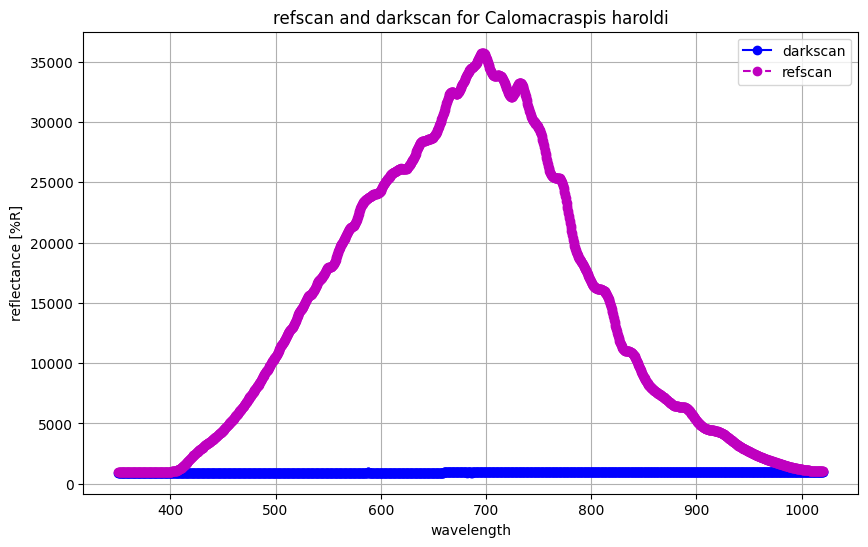

Plotting data for ChrysinaSp320...


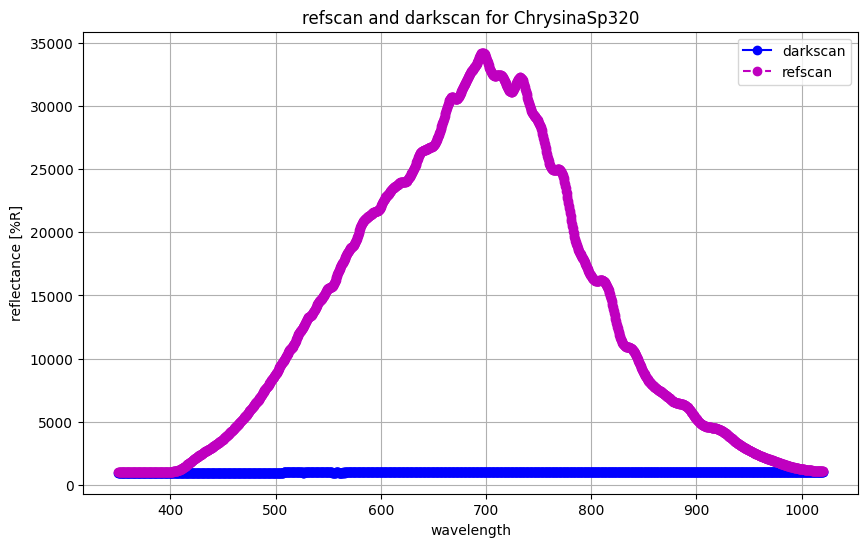

Plotting data for Chrysinasp337...


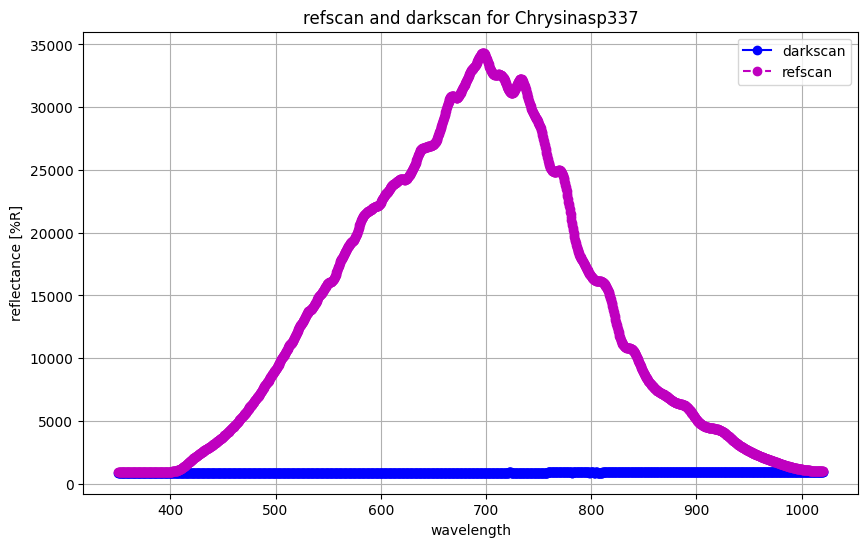

Plotting data for CresplendensTenorio(original)...


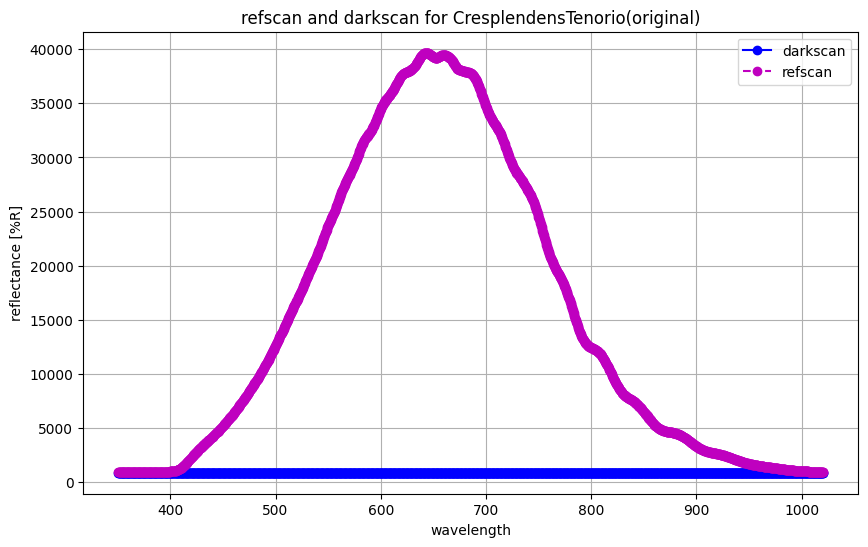

Plotting data for C_aurigans-variacion-color...


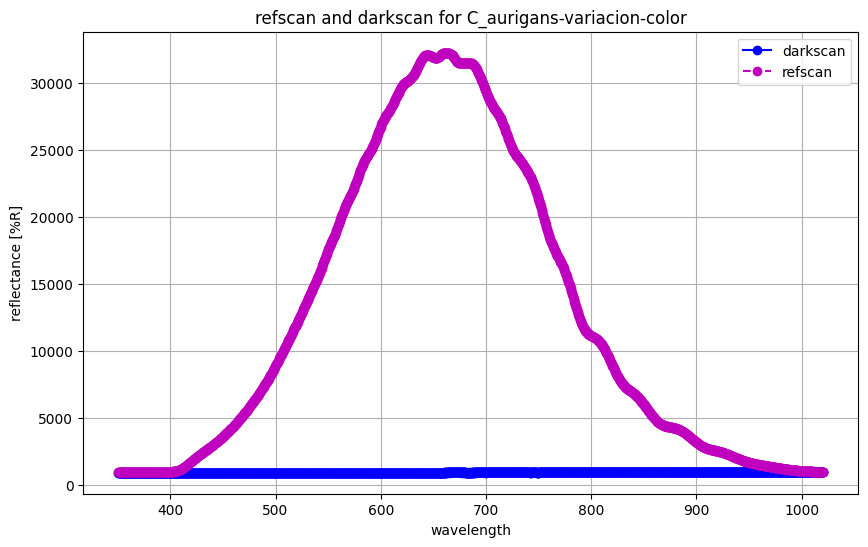

Plotting data for C_batesi-variacion-color...


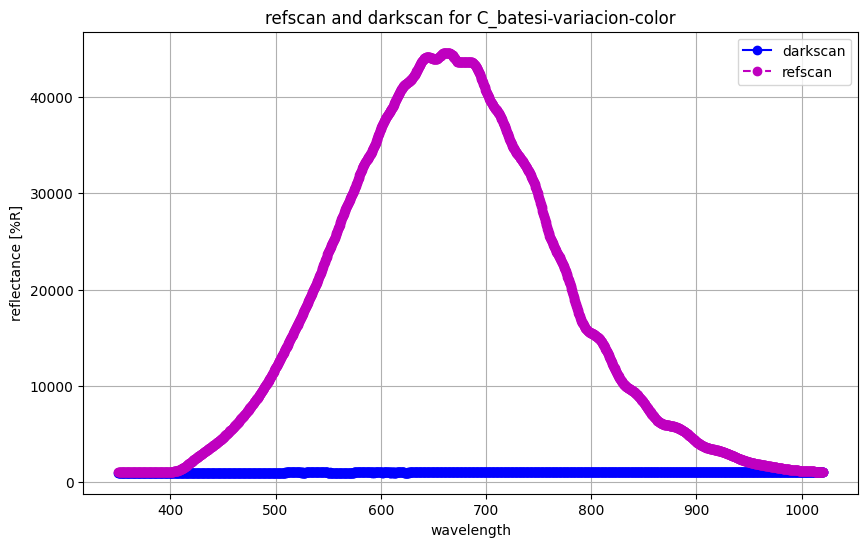

Plotting data for C_boucardi-variacion-color...


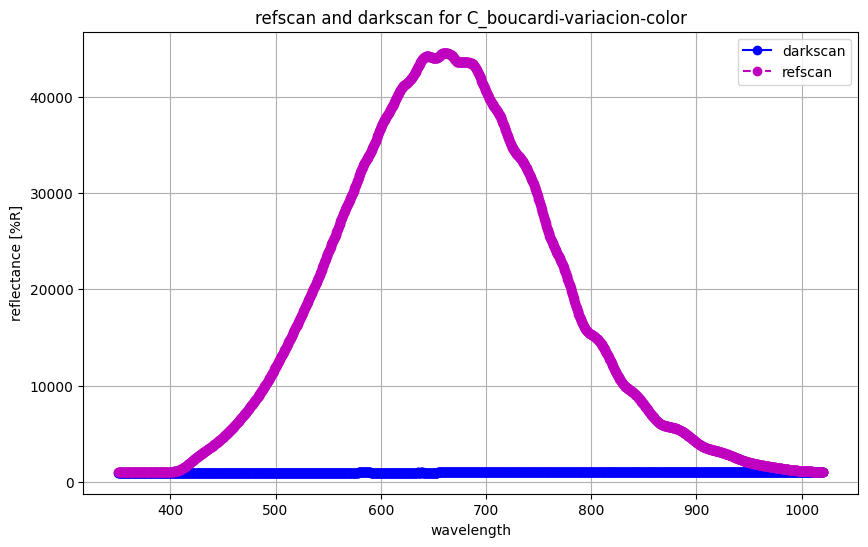

Plotting data for C_chacoltea...


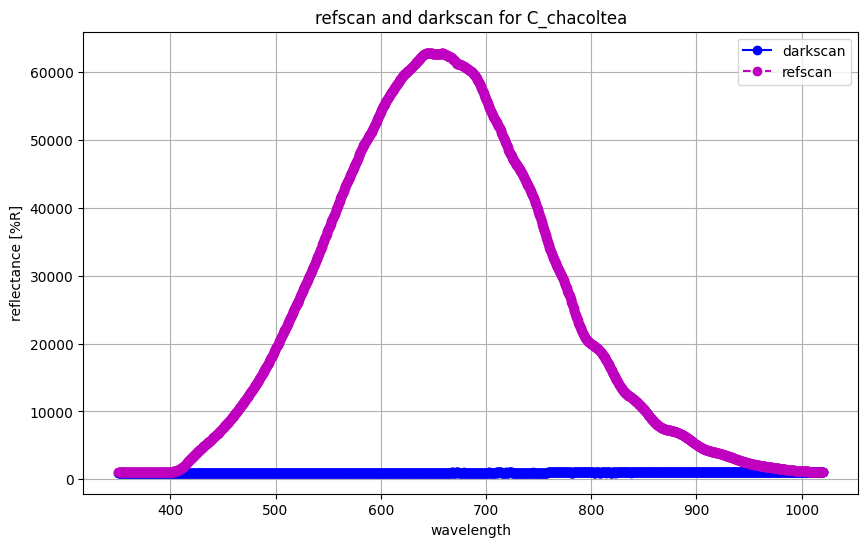

Plotting data for PruebaLinealidadrespuesta...


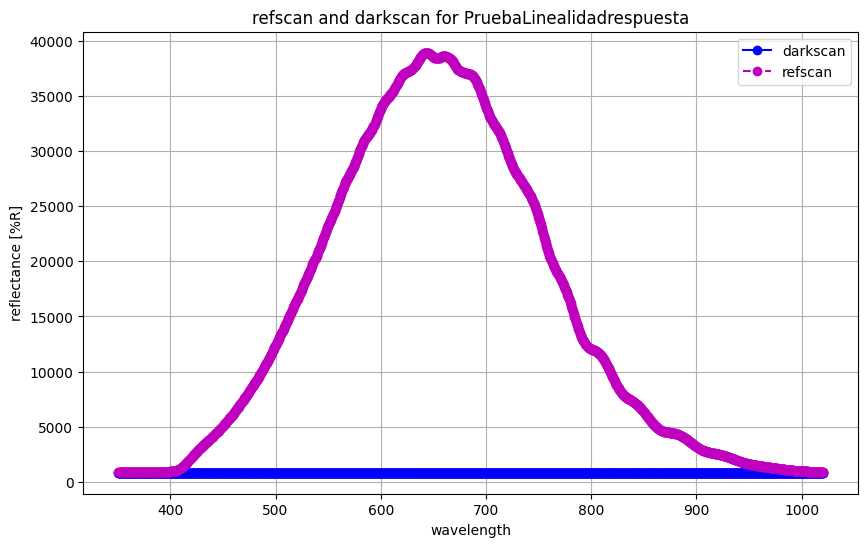

Plotting data for PruebasPolCruzadaCoptima...


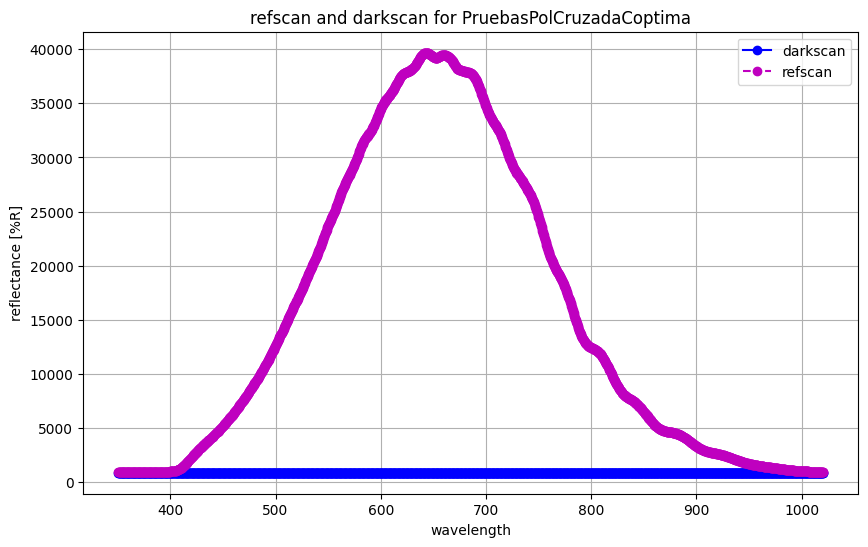

Plotting data for Relacionpolarizacion-totalCoptima...


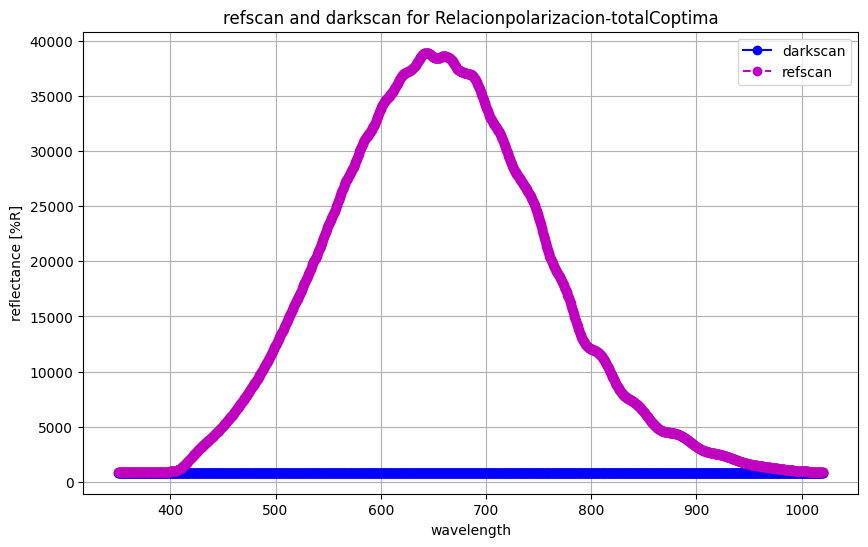

Plotting data for Resplendens&varios...


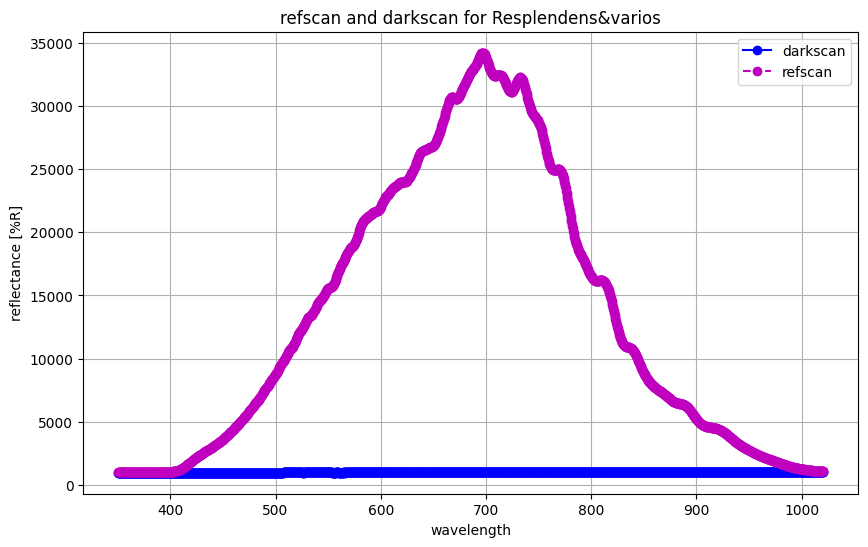

In [25]:
import os
from pathlib import Path

def list_and_plot_spectral_data(parent_directory, current_directory):
    # List all directories in the given parent directory
    parent_directory_path = Path(parent_directory)
    
    # Check if the parent directory exists
    if not parent_directory_path.exists():
        print(f"Directory {parent_directory_path} does not exist.")
        return

    # List all folders inside the parent directory
    folder_names = [folder.name for folder in parent_directory_path.iterdir() if folder.is_dir()]

    #remove list
    excluded = ["Ccupreomarginata" , "Ccupreomarginata-Talamanca", "Comparacion-cupreo", "Macraspis", "Macraspischrysis", "Resplendens-total"]
    
    folder_names = [element for element in folder_names if element not in excluded]
    # Apply the plot_spectral_data function to each folder
    for folder_basename in folder_names:
        print(f"Plotting data for {folder_basename}...")
        plot_spectral_data(folder_basename, current_directory)

# Usage:
# Assuming current_directory is already defined, and parent_directory is the top-level directory where 'data' resides
parent_directory = r"C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\data\Estudio-espectral-escarabajos"
list_and_plot_spectral_data(parent_directory, current_directory)


       wavelength  reflectance
0      350.601937    70.856538
1      351.037728    71.479537
2      351.473509    71.444851
3      351.909281    71.661819
4      352.345042    71.519693
...           ...          ...
1591  1018.728973    41.776184
1592  1019.124994    42.332635
1593  1019.520974    43.192674
1594  1019.916914    43.814882
1595  1020.312814    44.728770

[1596 rows x 2 columns]
       wavelength  reflectance
0      354.087989    90.955358
1      354.523701    90.956618
2      354.959403    90.957850
3      355.395095    90.959052
4      355.830777    90.960227
...           ...          ...
1583  1018.728973    93.622914
1584  1019.124994    93.631483
1585  1019.520974    93.640009
1586  1019.916914    93.648492
1587  1020.312814    93.656932

[1588 rows x 2 columns]
       wavelength  corrected_reflectance
0      350.601937                    NaN
1      351.037728                    NaN
2      351.473509                    NaN
3      351.909281                    NaN
4

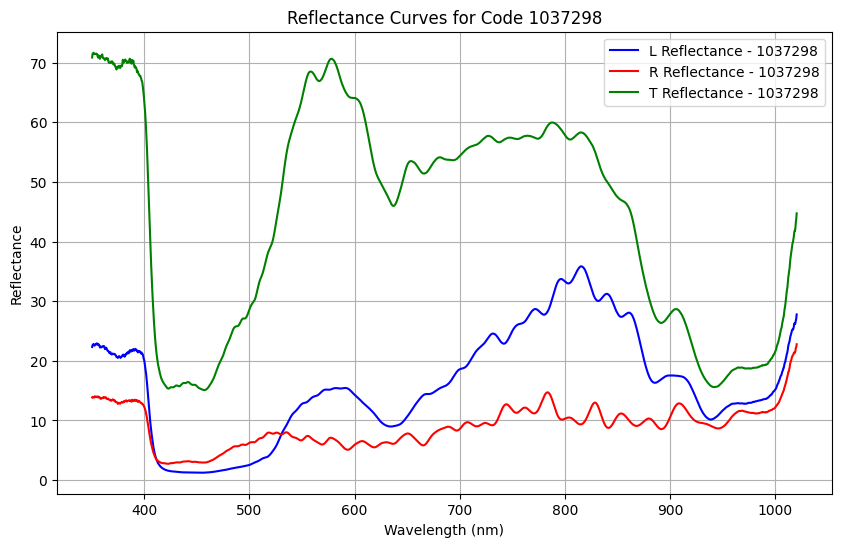

Saved T reflectance for code 1037298 to calculated_total_reflectance/1037298T.csv


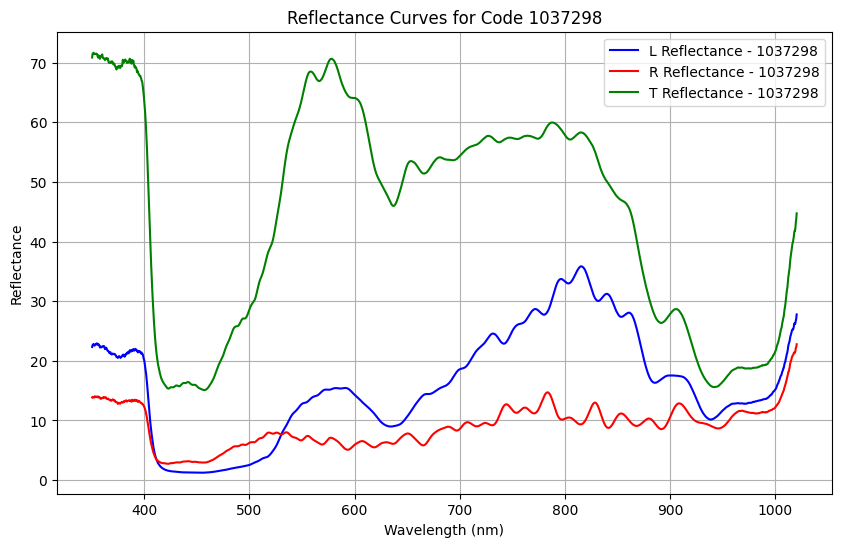

Saved T reflectance for code 1037298 to calculated_total_reflectance/1037298T.csv


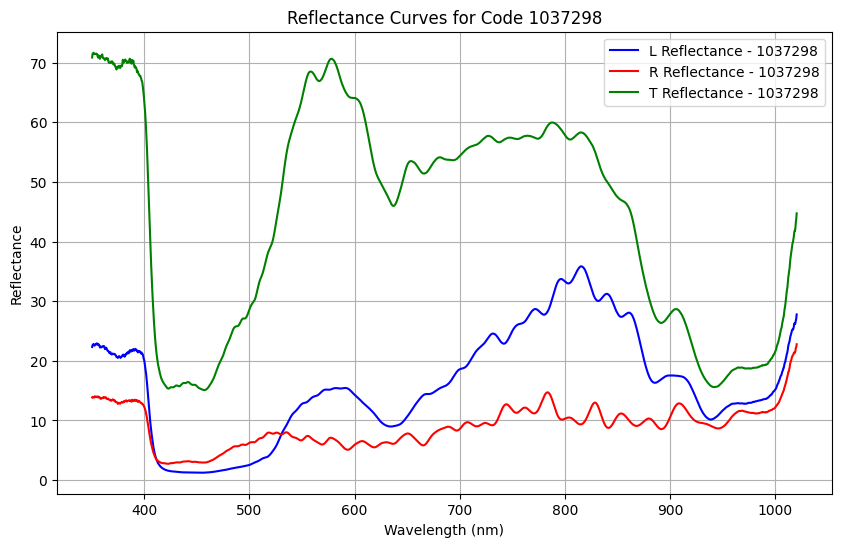

Saved T reflectance for code 1037298 to calculated_total_reflectance/1037298T.csv


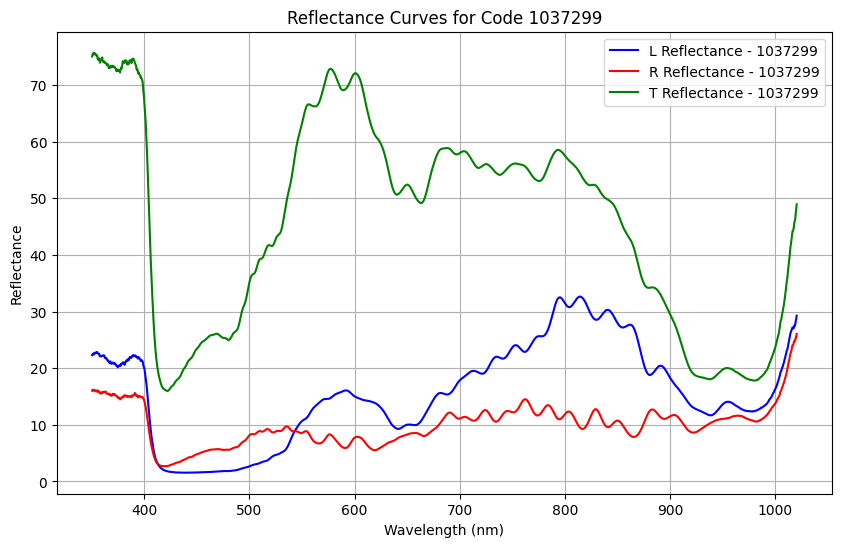

Saved T reflectance for code 1037299 to calculated_total_reflectance/1037299T.csv


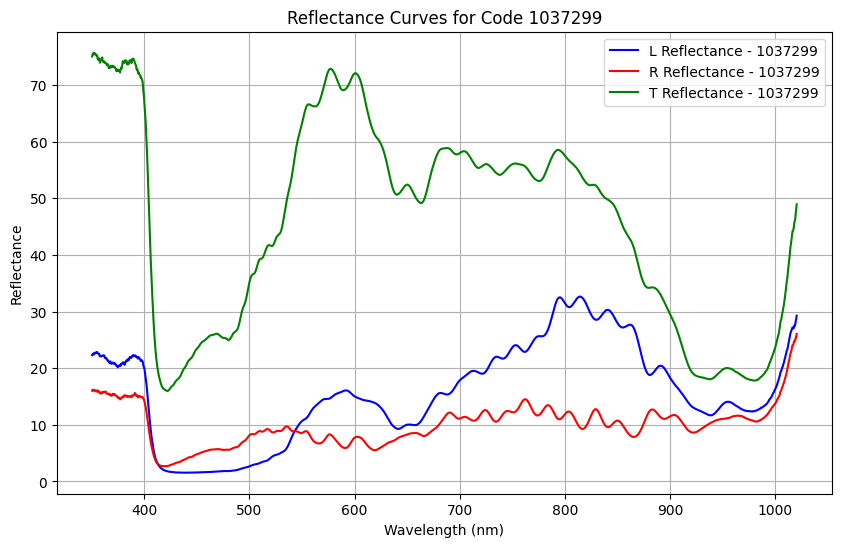

Saved T reflectance for code 1037299 to calculated_total_reflectance/1037299T.csv


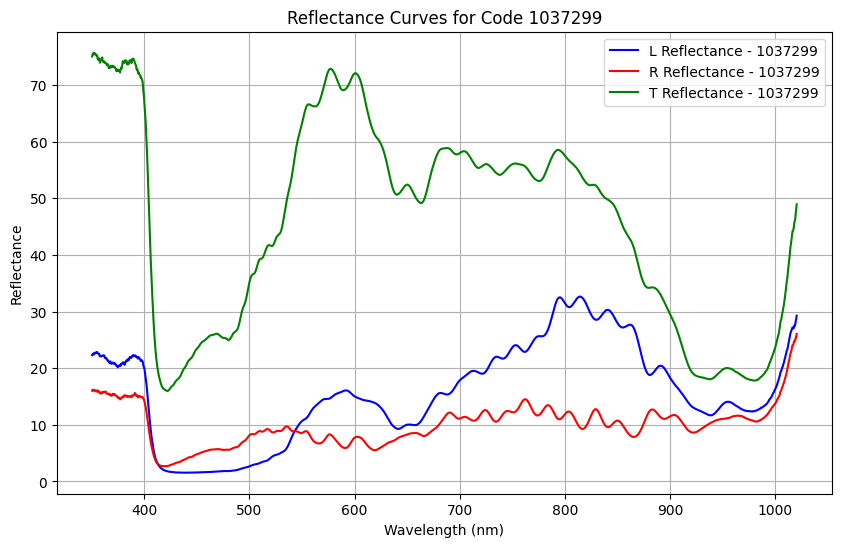

Saved T reflectance for code 1037299 to calculated_total_reflectance/1037299T.csv


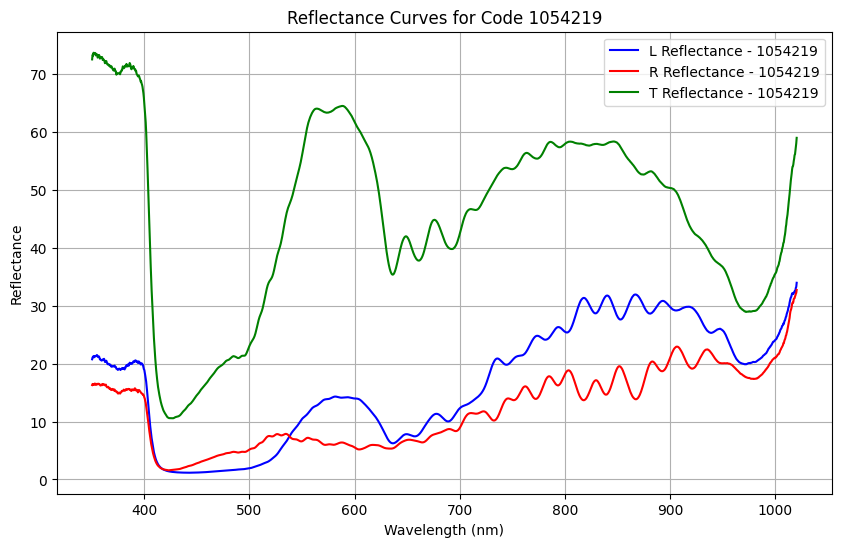

Saved T reflectance for code 1054219 to calculated_total_reflectance/1054219T.csv


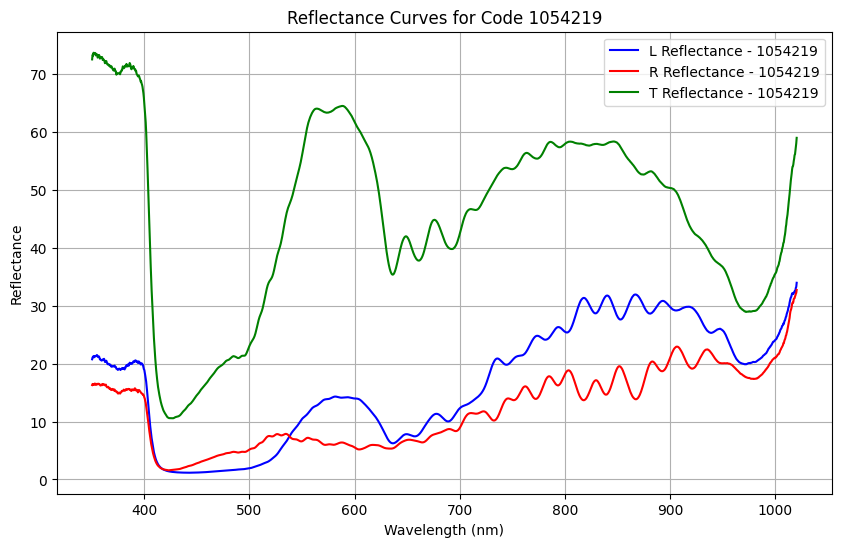

Saved T reflectance for code 1054219 to calculated_total_reflectance/1054219T.csv


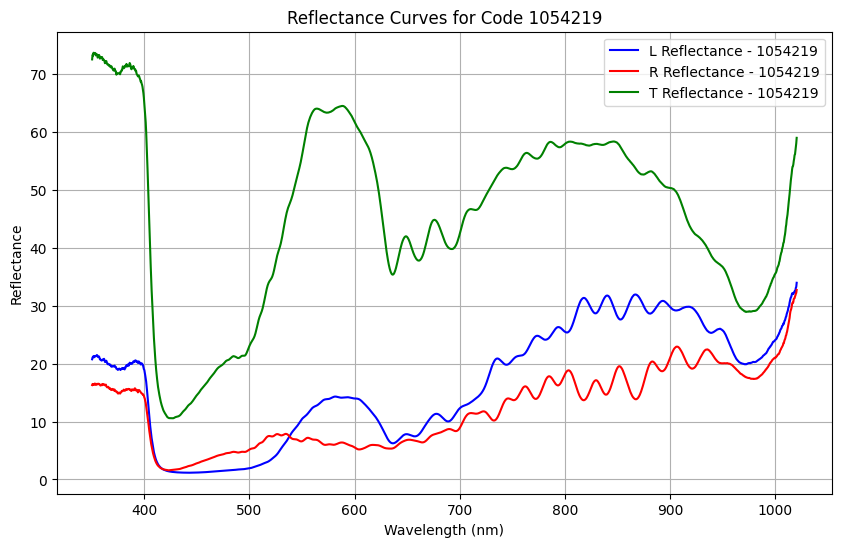

Saved T reflectance for code 1054219 to calculated_total_reflectance/1054219T.csv


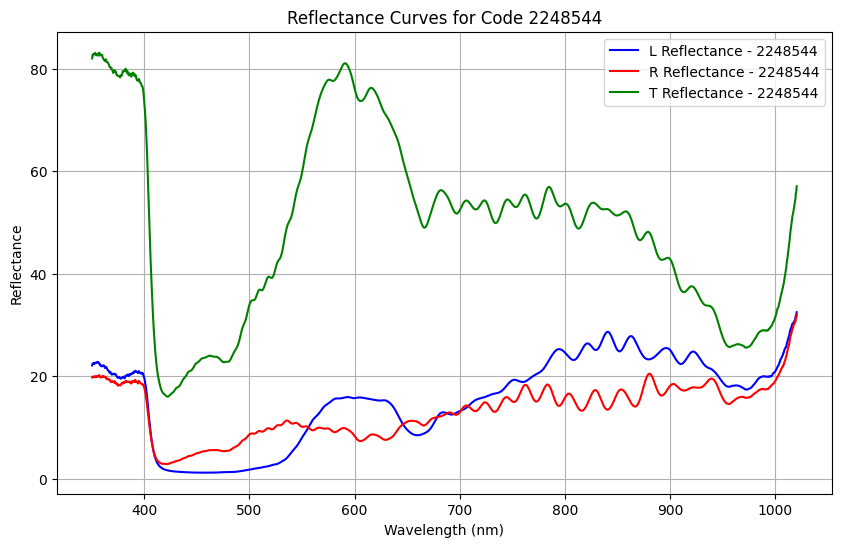

Saved T reflectance for code 2248544 to calculated_total_reflectance/2248544T.csv


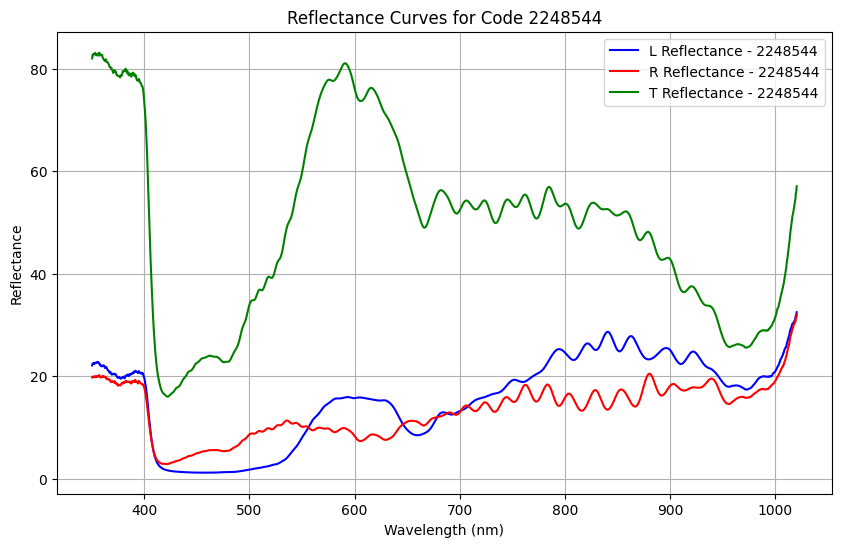

Saved T reflectance for code 2248544 to calculated_total_reflectance/2248544T.csv


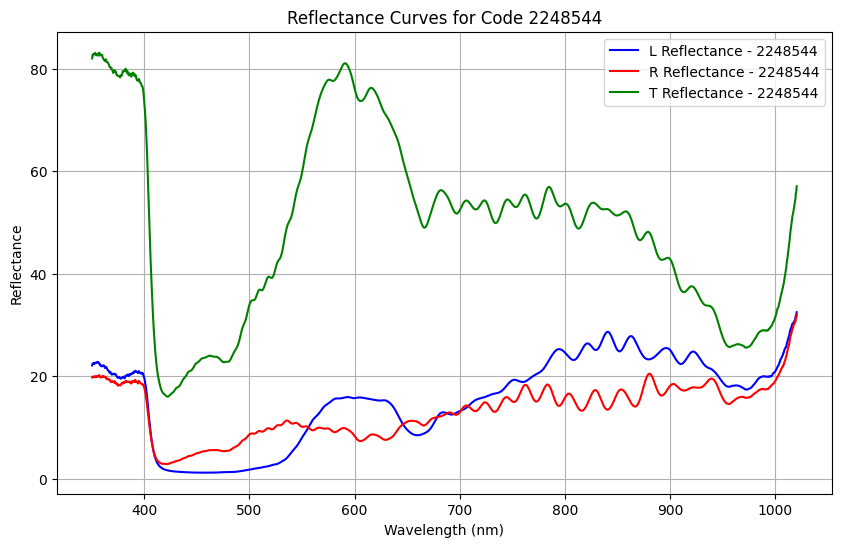

Saved T reflectance for code 2248544 to calculated_total_reflectance/2248544T.csv


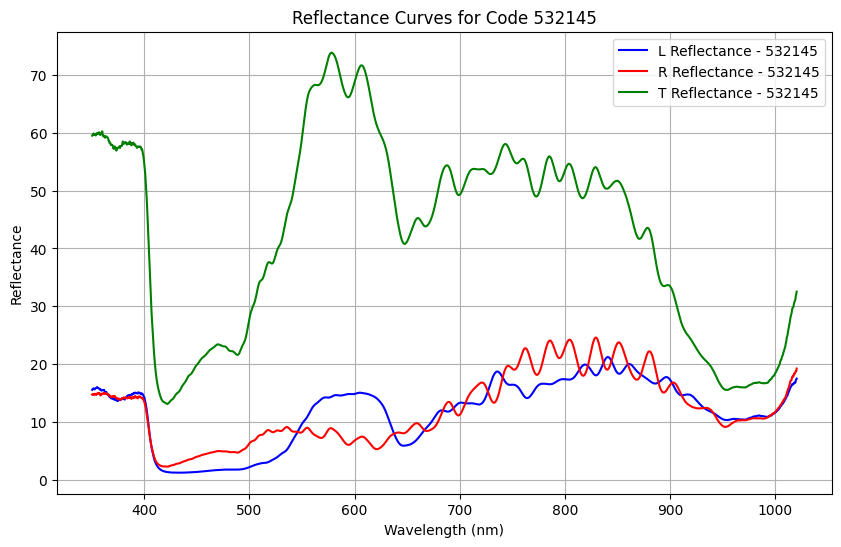

Saved T reflectance for code 532145 to calculated_total_reflectance/532145T.csv


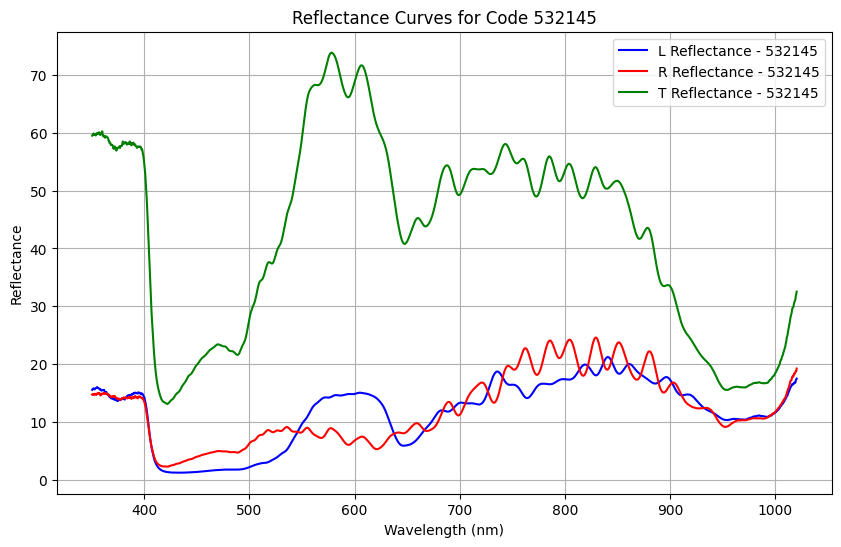

Saved T reflectance for code 532145 to calculated_total_reflectance/532145T.csv


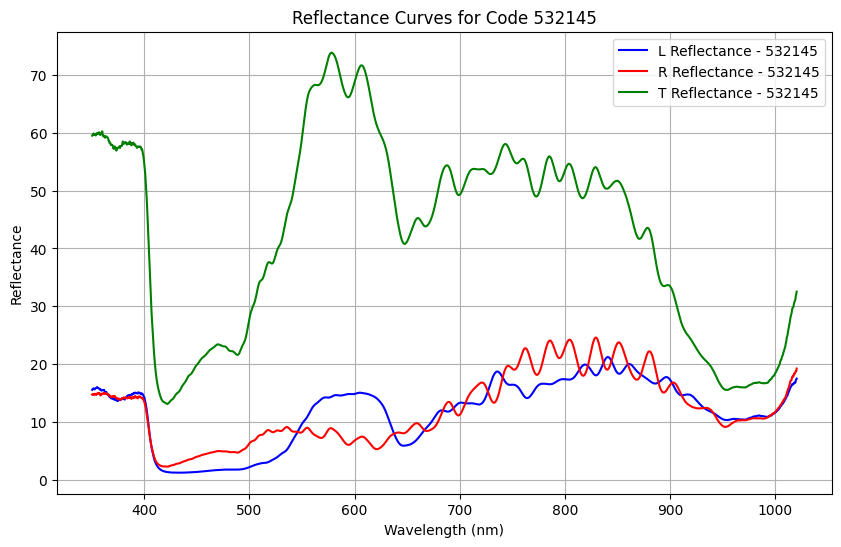

Saved T reflectance for code 532145 to calculated_total_reflectance/532145T.csv


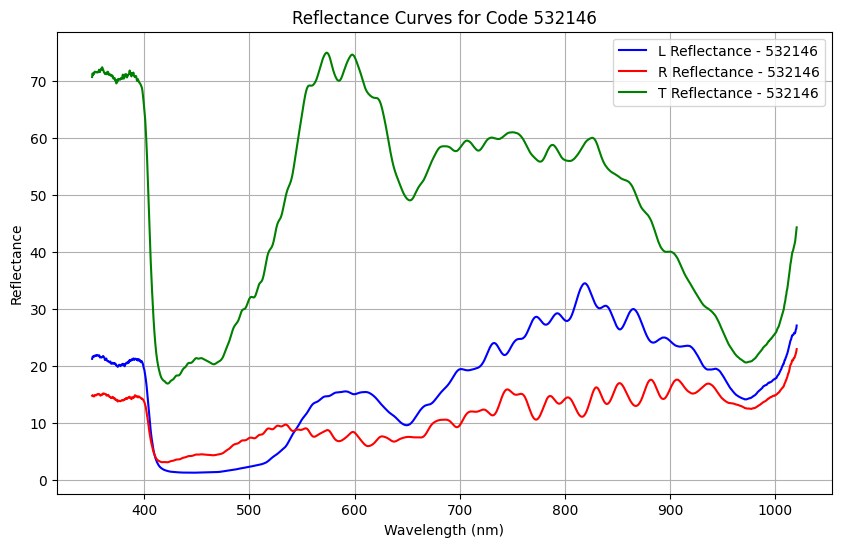

Saved T reflectance for code 532146 to calculated_total_reflectance/532146T.csv


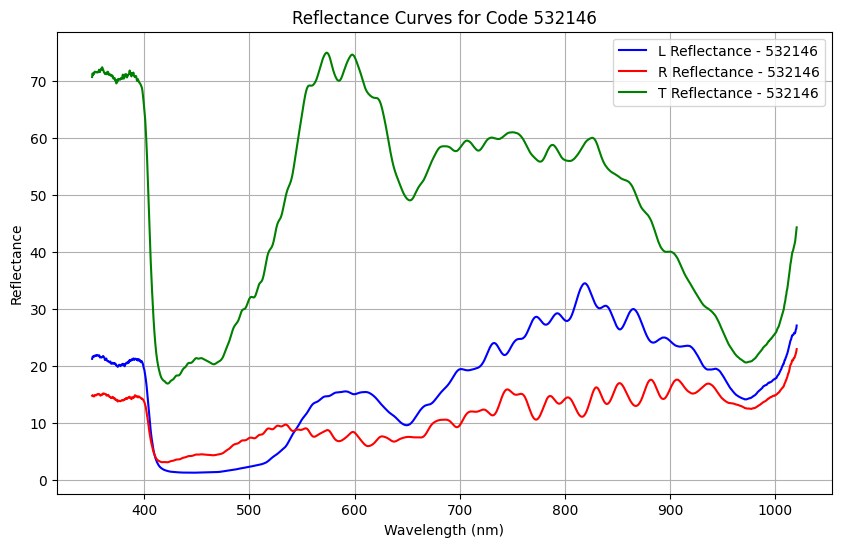

Saved T reflectance for code 532146 to calculated_total_reflectance/532146T.csv


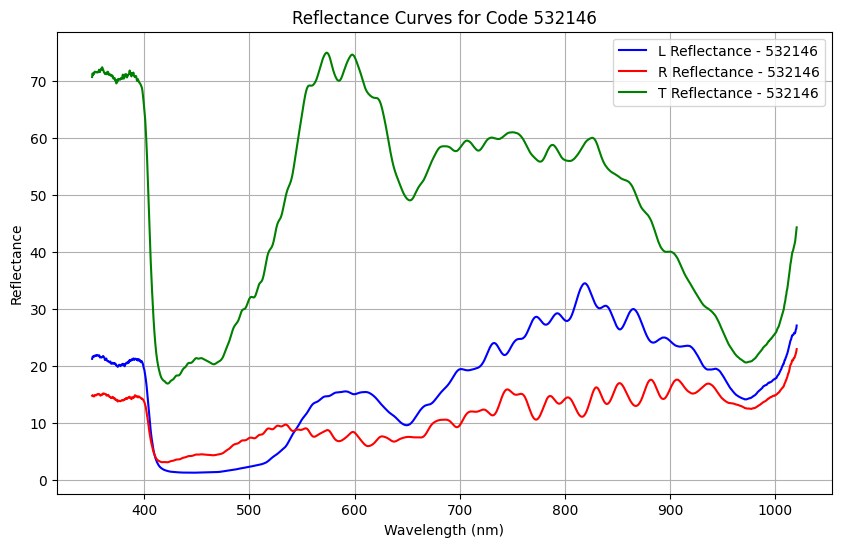

Saved T reflectance for code 532146 to calculated_total_reflectance/532146T.csv


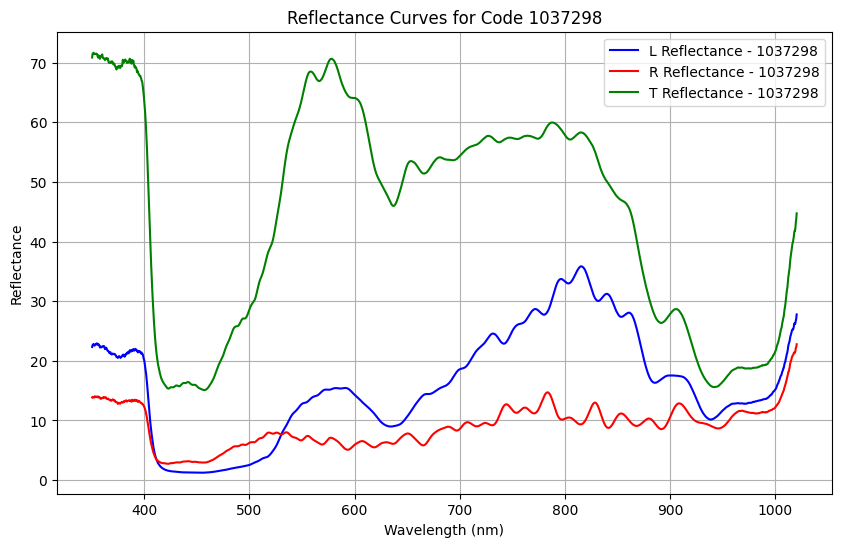

Saved T reflectance for code 1037298 to calculated_total_reflectance/1037298T.csv


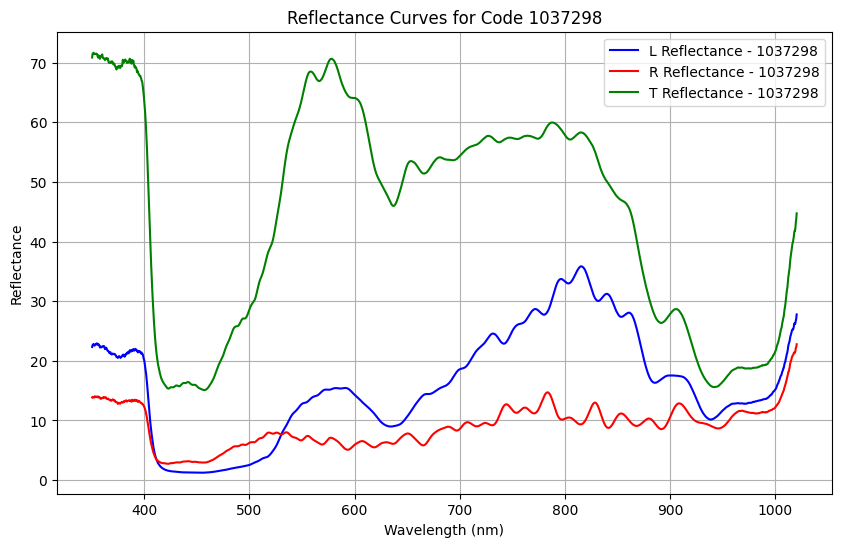

Saved T reflectance for code 1037298 to calculated_total_reflectance/1037298T.csv


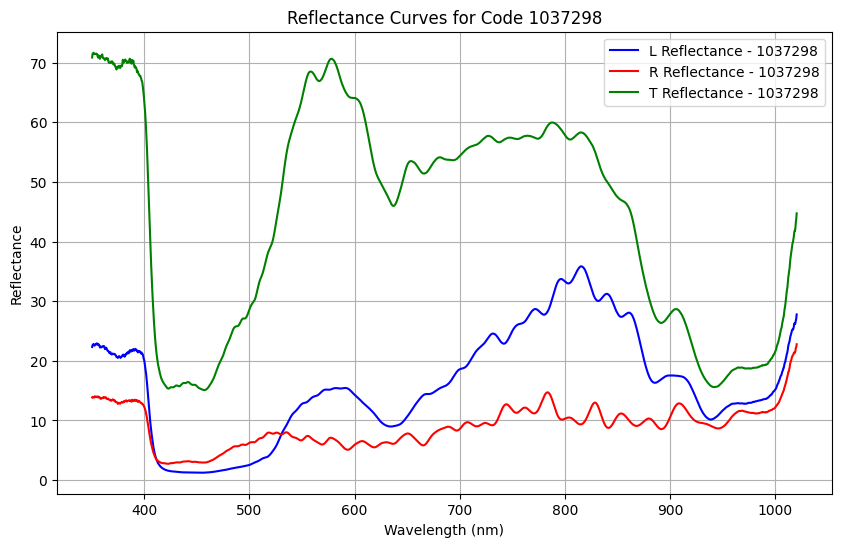

Saved T reflectance for code 1037298 to calculated_total_reflectance/1037298T.csv


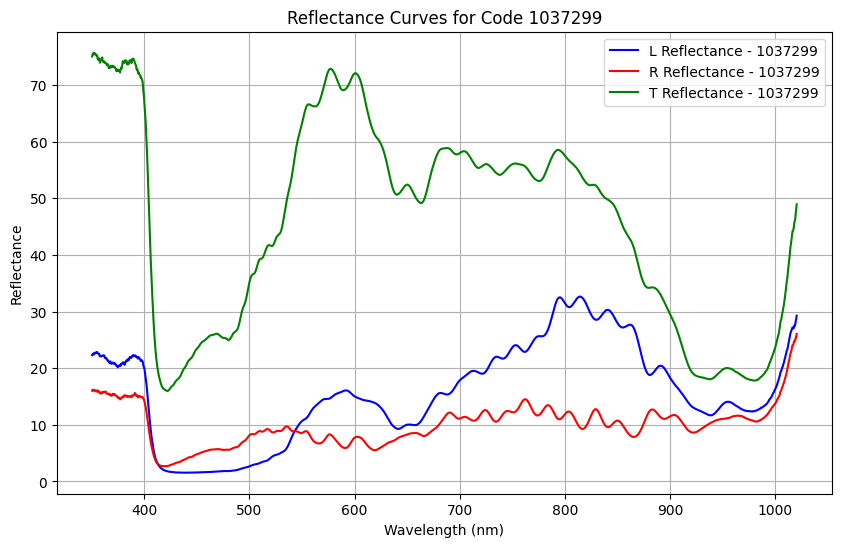

Saved T reflectance for code 1037299 to calculated_total_reflectance/1037299T.csv


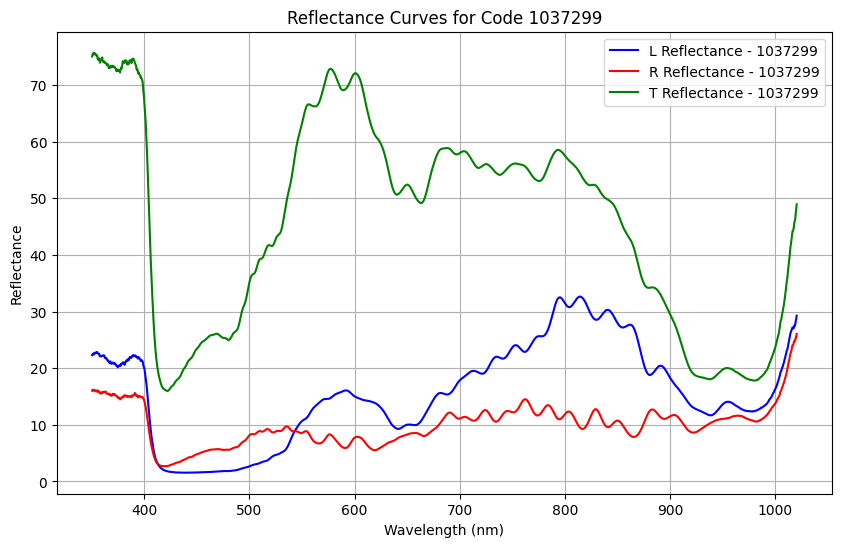

Saved T reflectance for code 1037299 to calculated_total_reflectance/1037299T.csv


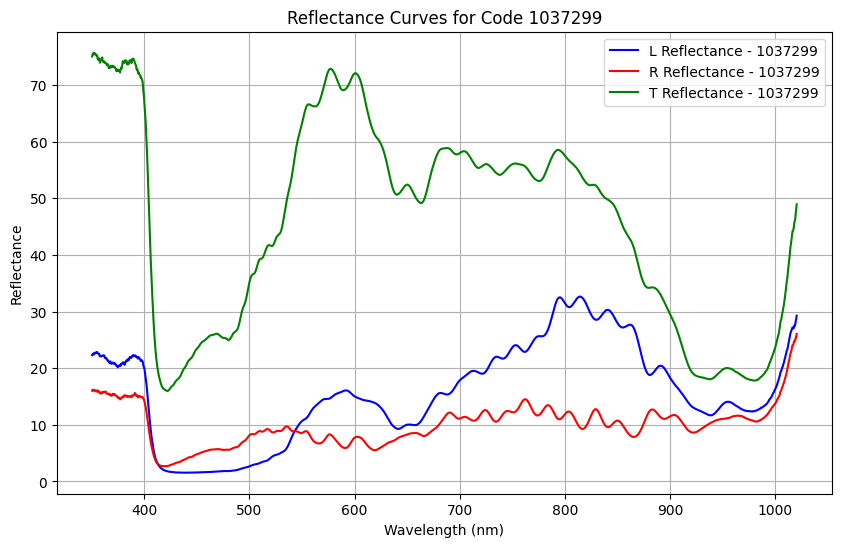

Saved T reflectance for code 1037299 to calculated_total_reflectance/1037299T.csv


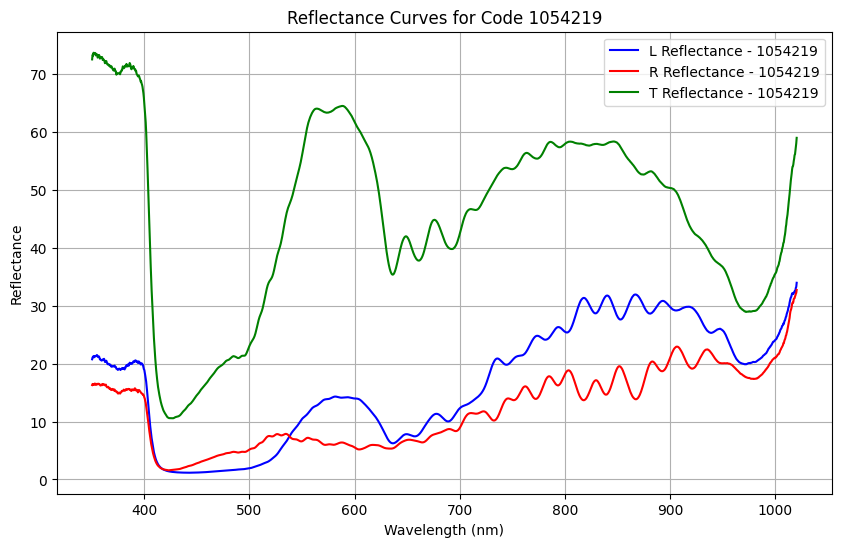

Saved T reflectance for code 1054219 to calculated_total_reflectance/1054219T.csv


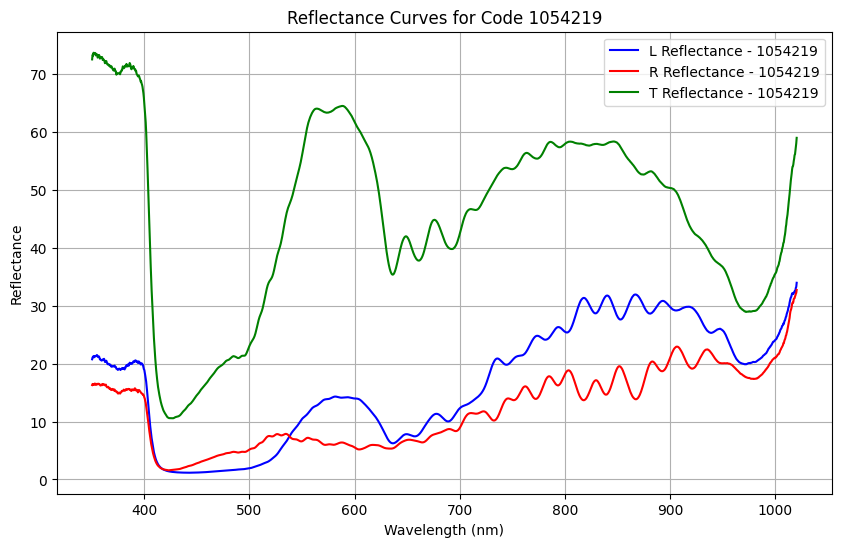

Saved T reflectance for code 1054219 to calculated_total_reflectance/1054219T.csv


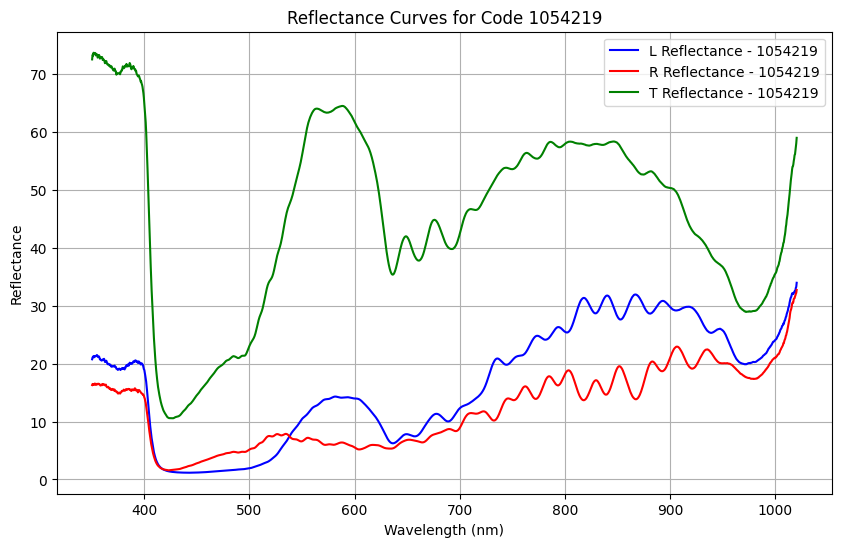

Saved T reflectance for code 1054219 to calculated_total_reflectance/1054219T.csv


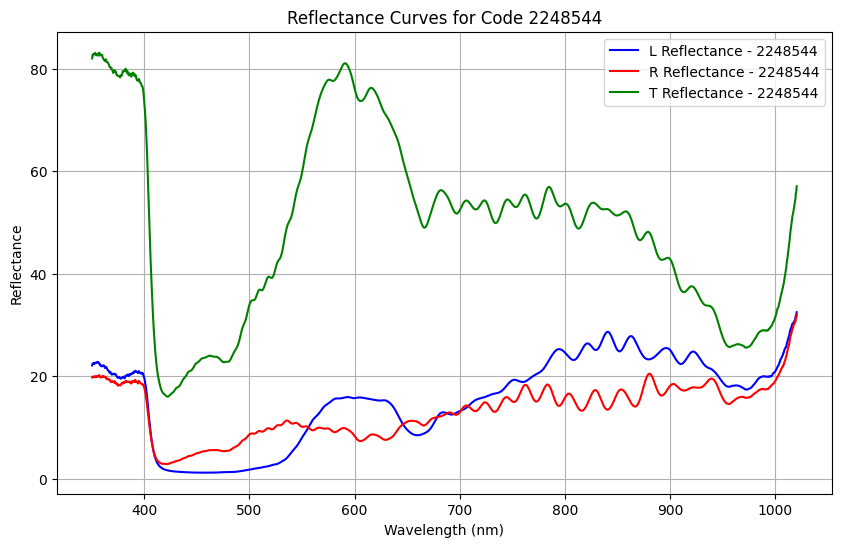

Saved T reflectance for code 2248544 to calculated_total_reflectance/2248544T.csv


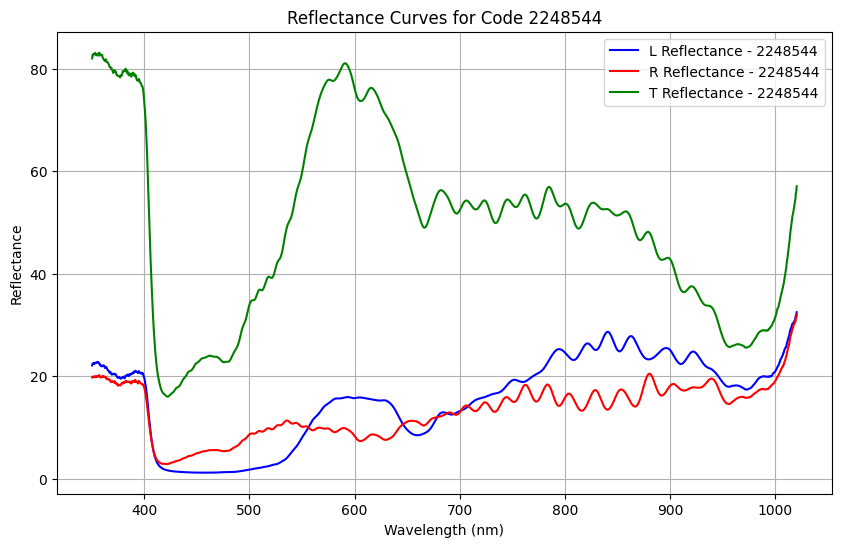

Saved T reflectance for code 2248544 to calculated_total_reflectance/2248544T.csv


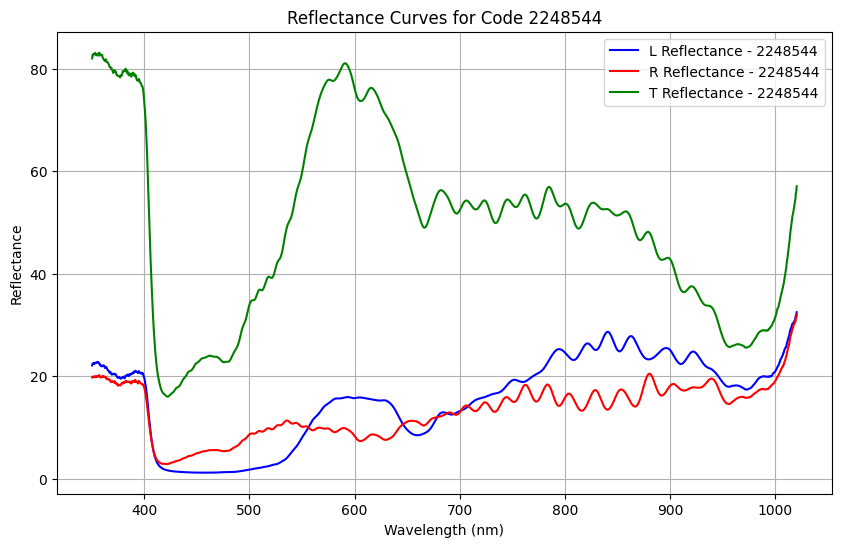

Saved T reflectance for code 2248544 to calculated_total_reflectance/2248544T.csv


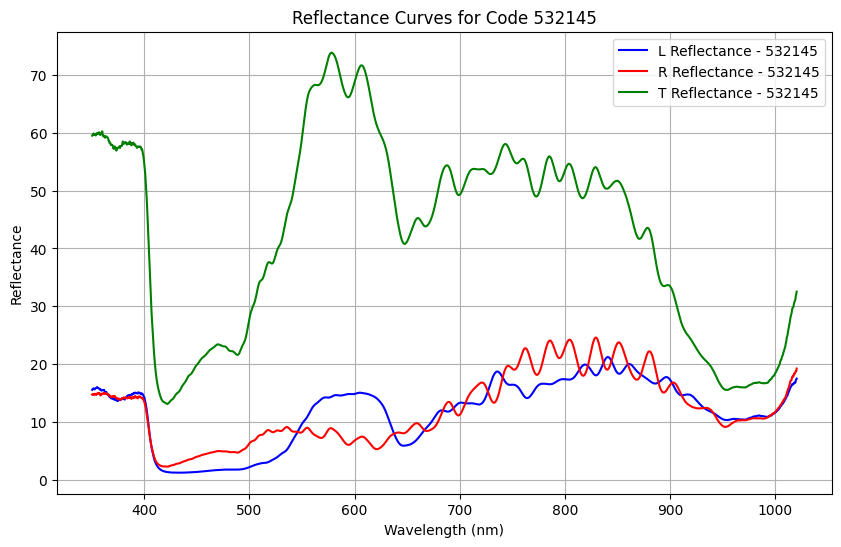

Saved T reflectance for code 532145 to calculated_total_reflectance/532145T.csv


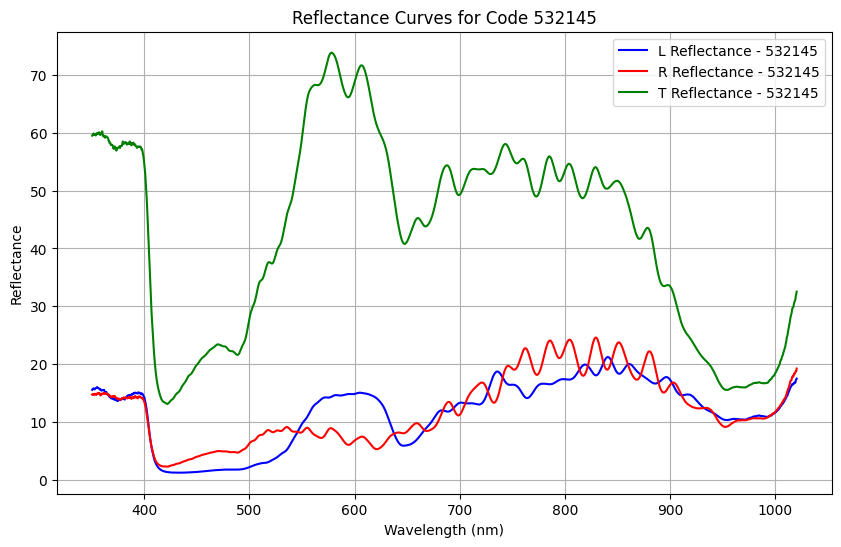

Saved T reflectance for code 532145 to calculated_total_reflectance/532145T.csv


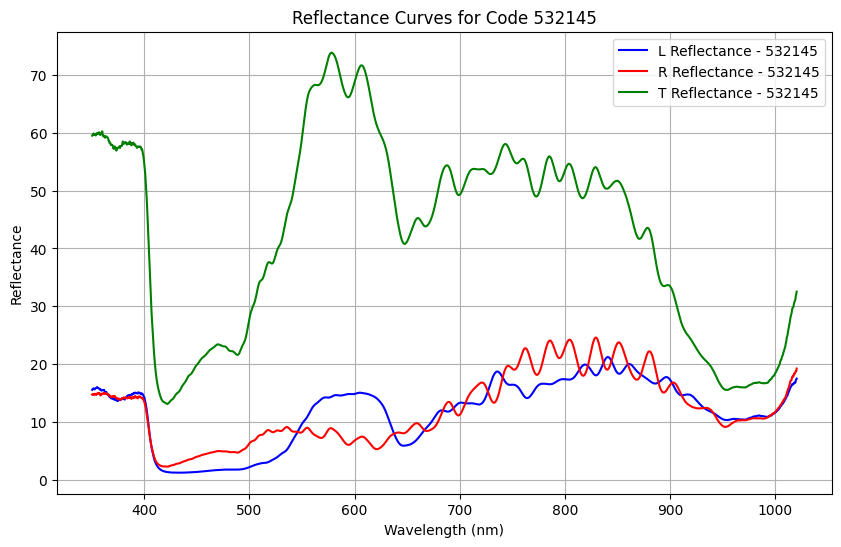

Saved T reflectance for code 532145 to calculated_total_reflectance/532145T.csv


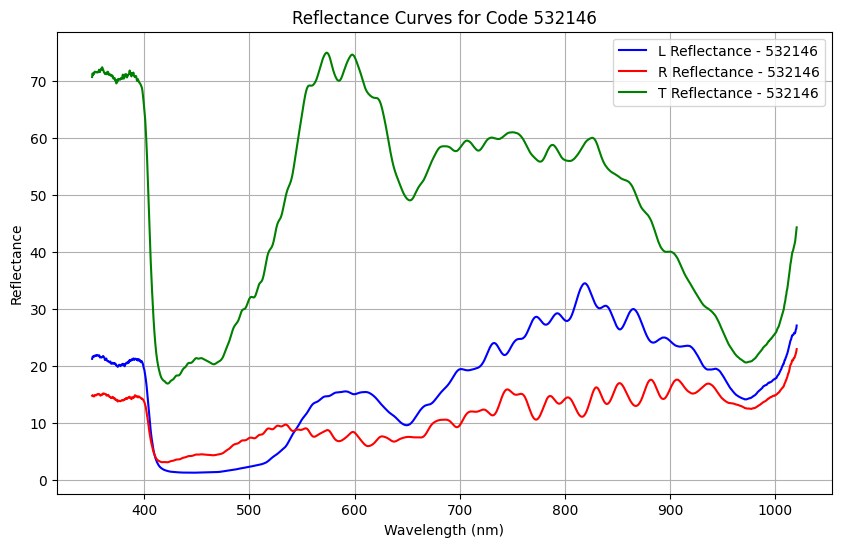

Saved T reflectance for code 532146 to calculated_total_reflectance/532146T.csv


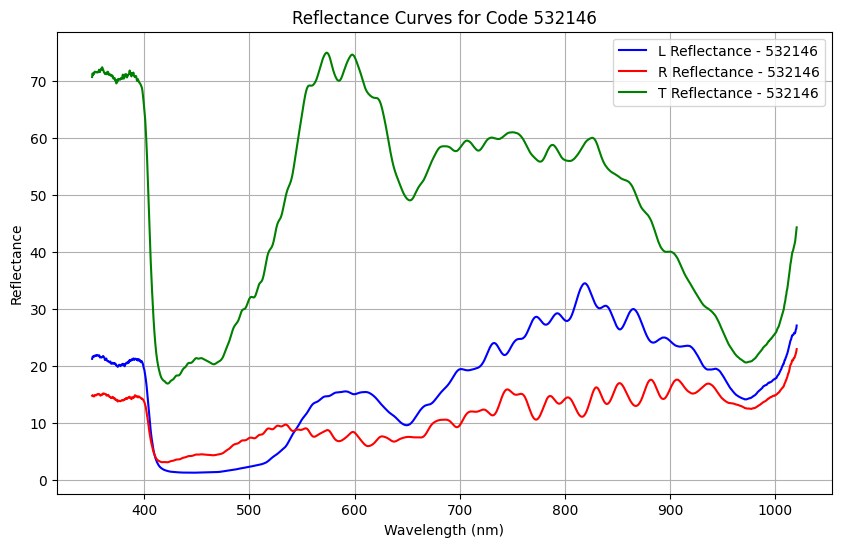

Saved T reflectance for code 532146 to calculated_total_reflectance/532146T.csv


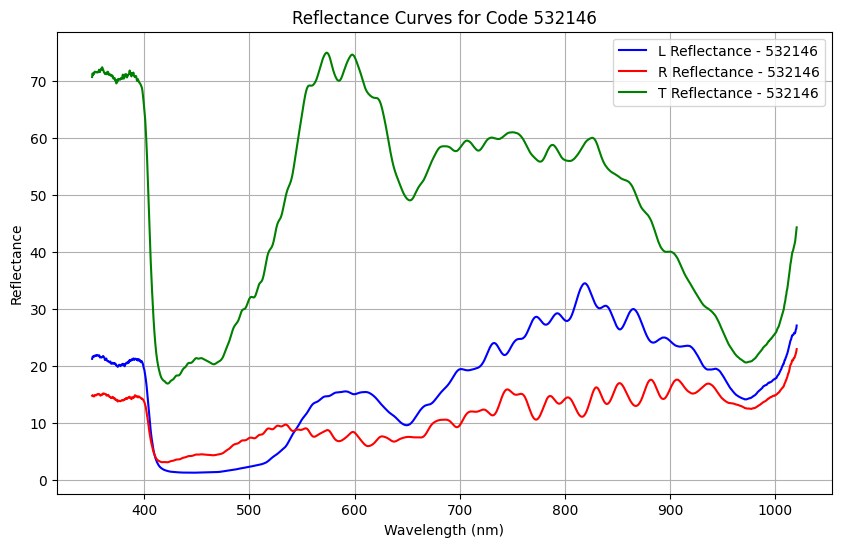

Saved T reflectance for code 532146 to calculated_total_reflectance/532146T.csv


In [26]:
# ["Ccupreomarginata" , "Ccupreomarginata-Talamanca", "Comparacion-cupreo", "Macraspis", "Macraspischrysis", "Resplendens-total"]
import re 

parent_directory = Path(r"C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\data\Estudio-espectral-escarabajos")
folder_path = parent_directory / "Ccupreomarginata"

# Paths to CSV files
L_folder = folder_path / "L" 
R_folder = folder_path

#List files
L_files = get_csv_files(L_folder)
R_files = get_csv_files(R_folder)

#Convert to string and append folder path

L_files = [str(L_folder / file) for file in L_files]
R_files = [str(R_folder / file) for file in R_files]

# Extract numbers from L_files and R_files into sets
L_numbers = {extract_number_before_letter(Path(file).name) for file in L_files}
R_numbers = {extract_number_before_letter(Path(file).name) for file in R_files}

# Find common numbers and filter files based on those common numbers
codes = [
    extract_number_before_letter(Path(file).name)
    for file in L_files + R_files
]
#print(L_numbers)
#print(R_numbers)
#print(codes)

codes = [code for code in codes if (code in L_numbers) and (code in R_numbers)]
#print(codes)

#Para cada código
samples = []

for code in codes: 
    measured_L_reflectance_file = [file for file in L_files if code in file][0]
    measured_L_reflectance = get_csv_data(measured_L_reflectance_file, x_column="wavelength", y_column="reflectance")

    measured_R_reflectance_file = [file for file in R_files if code in file][0]
    measured_R_reflectance = get_csv_data(measured_R_reflectance_file, x_column="wavelength", y_column="reflectance")

    filtro_L_reflectancia = get_csv_data(filtro_L_file, x_column="wavelength", y_column="reflectance")
    filtro_R_reflectancia = get_csv_data(filtro_R_file, x_column="wavelength", y_column="reflectance")

    measured_T_reflectance = pd.DataFrame([])
    measured_T_reflectance["wavelength"] =  measured_L_reflectance["wavelength"]
    measured_T_reflectance["reflectance"] = (measured_R_reflectance["reflectance"] /100 * filtro_R_reflectancia["reflectance"] + measured_L_reflectance["reflectance"] /100 * filtro_L_reflectancia["reflectance"]) * mirror_total_reflectance["reflectance"] /(filtro_R_reflectancia["reflectance"] +filtro_L_reflectancia["reflectance"])  
    print(measured_T_reflectance)
    print(aluminum_reflectance)
    corrected_T_reflectance = correct_reflectance(bad_reflectance = measured_T_reflectance, aluminum_reflectance = aluminum_reflectance)
    print(corrected_T_reflectance)
    #df = pd.DataFrame([])
    #df["wavelength"] = measured_L_reflectance

    #calculate scaled down reflectances
    scaled_down_L_reflectance = pd.DataFrame([])
    scaled_down_L_reflectance["wavelength"] = measured_L_reflectance["wavelength"]
    scaled_down_L_reflectance["reflectance"] = measured_L_reflectance["reflectance"] * filtro_L_reflectancia["reflectance"] /100

    scaled_down_R_reflectance = pd.DataFrame([])
    scaled_down_R_reflectance["wavelength"] = measured_R_reflectance["wavelength"]
    scaled_down_R_reflectance["reflectance"] = measured_R_reflectance["reflectance"] * filtro_R_reflectancia["reflectance"]/100

    code_dict = {"code": code, "L": scaled_down_L_reflectance, "R": scaled_down_R_reflectance, "T": measured_T_reflectance}
    samples.append(code_dict)

import matplotlib.pyplot as plt
import os

# Create the folder for saving the T reflectances if it doesn't exist
output_folder = 'calculated_total_reflectance'
os.makedirs(output_folder, exist_ok=True)

# Iterate over each code in the samples list
for sample in samples:
    code = sample["code"]
    measured_L_reflectance = sample["L"]
    measured_R_reflectance = sample["R"]
    measured_T_reflectance = sample["T"]

    # Plot the R, L, and T reflectances for the current code
    plt.figure(figsize=(10, 6))
    plt.plot(measured_L_reflectance["wavelength"], measured_L_reflectance["reflectance"], label=f"L Reflectance - {code}", color='blue')
    plt.plot(measured_R_reflectance["wavelength"], measured_R_reflectance["reflectance"], label=f"R Reflectance - {code}", color='red')
    plt.plot(measured_T_reflectance["wavelength"], measured_T_reflectance["reflectance"], label=f"T Reflectance - {code}", color='green')

    # Adding labels and title
    plt.xlabel("Wavelength (nm)")
    plt.ylabel("Reflectance")
    plt.title(f"Reflectance Curves for Code {code}")
    plt.legend()
    plt.grid(True)

    # Show the plot
    plt.show()

    # Save the T reflectance for the current code in the specified folder
    t_filename = f"{output_folder}/{code}T.csv"
    measured_T_reflectance.to_csv(t_filename, index=False)

    print(f"Saved T reflectance for code {code} to {t_filename}")



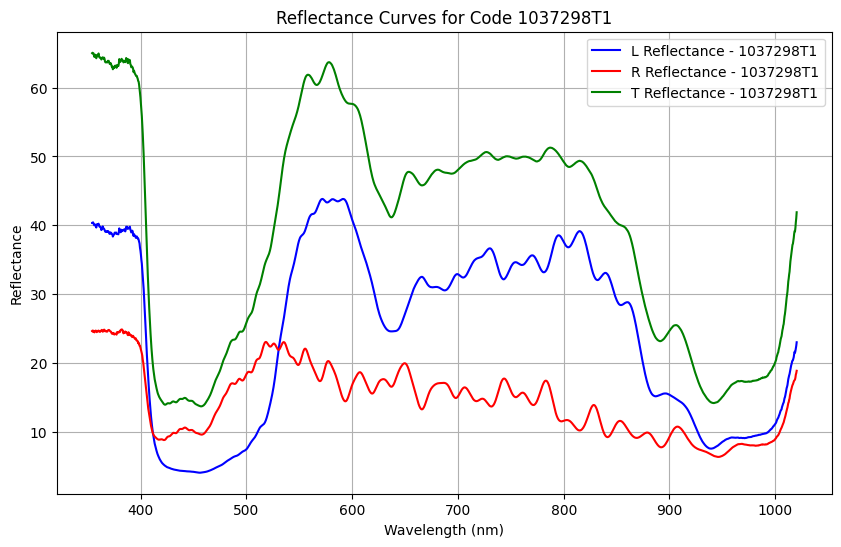

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


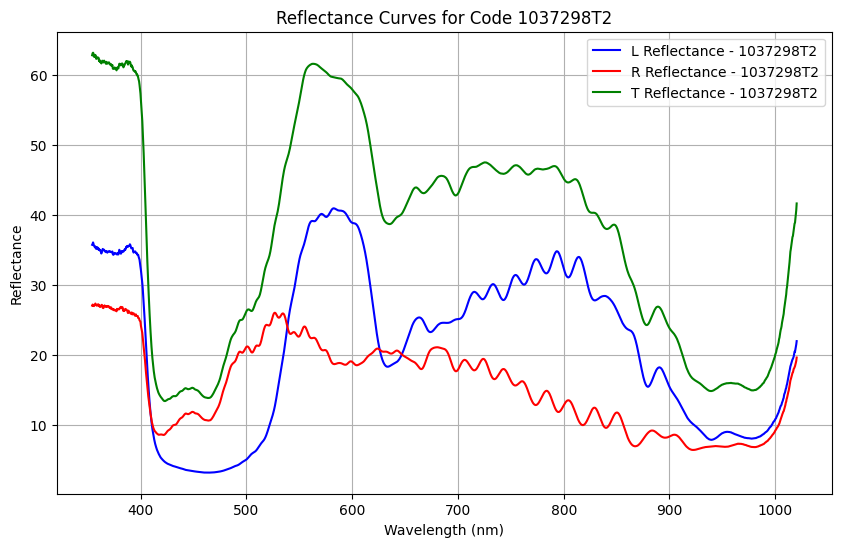

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


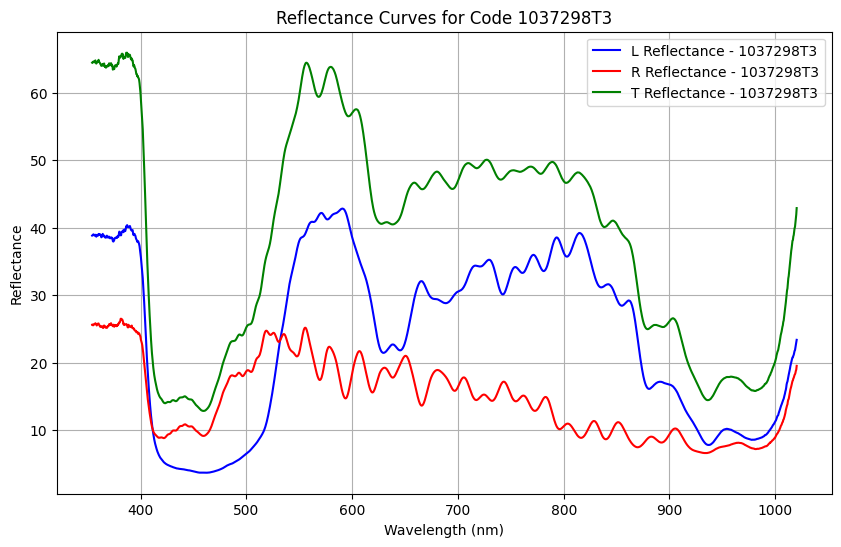

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


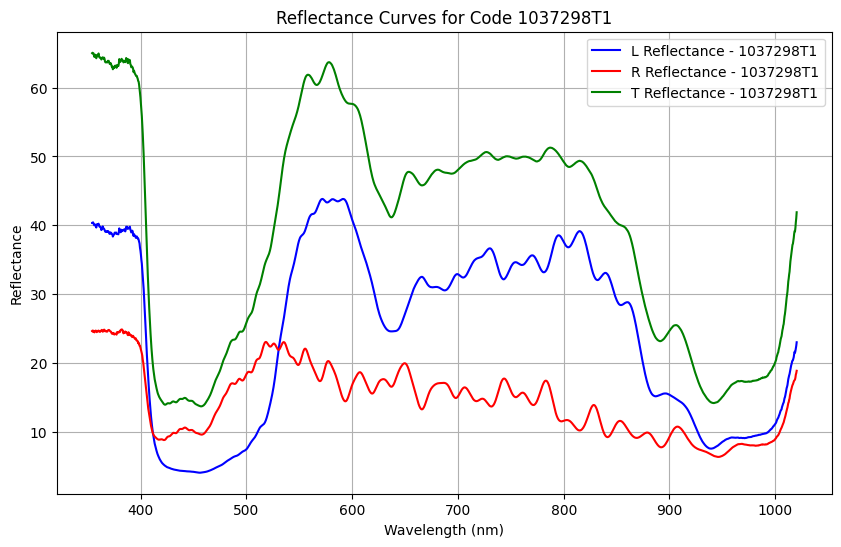

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


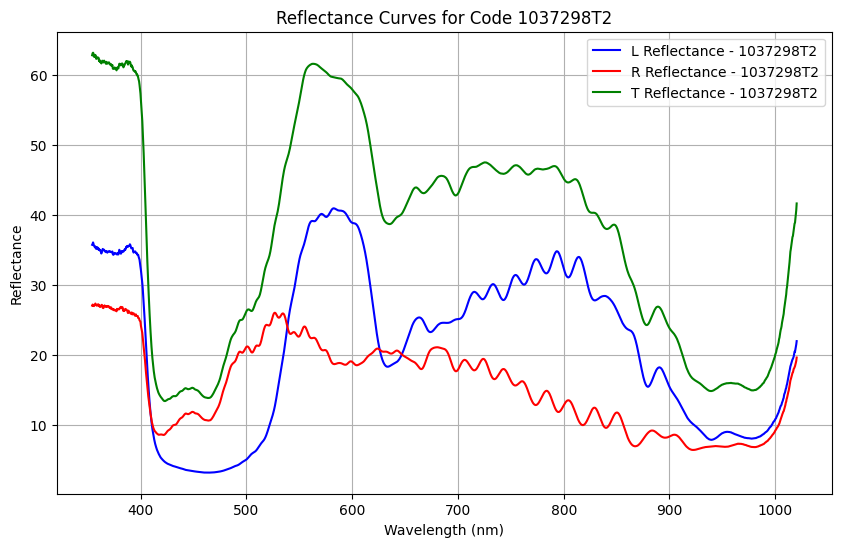

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


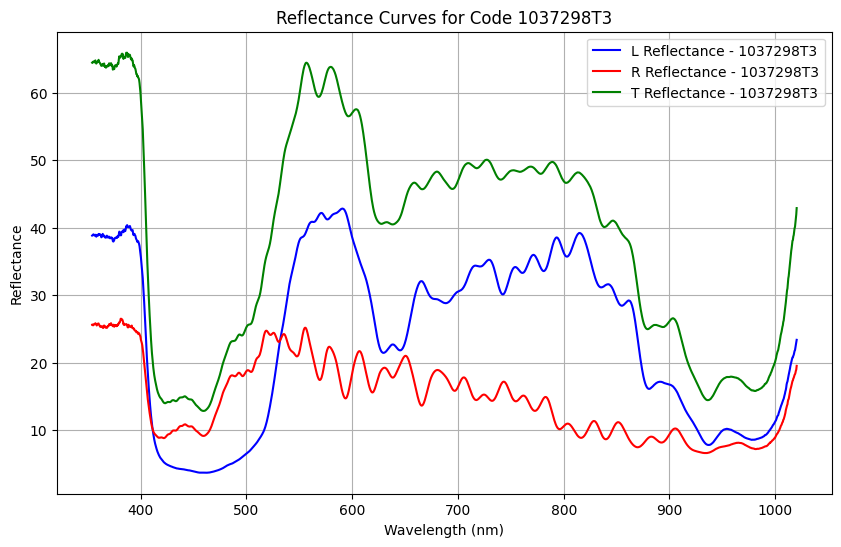

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


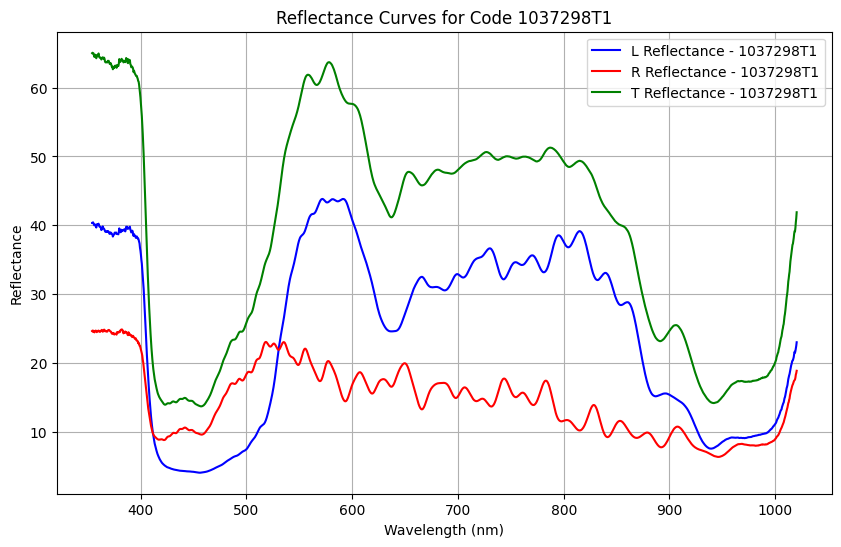

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


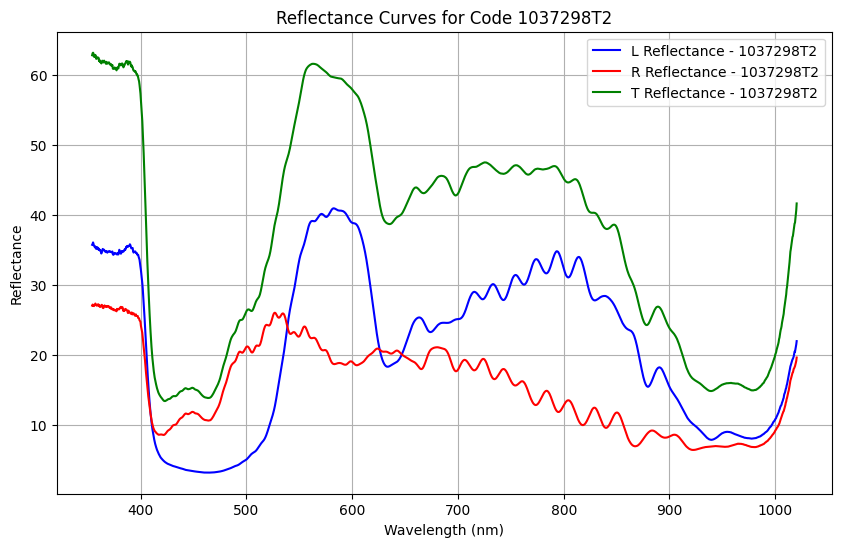

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


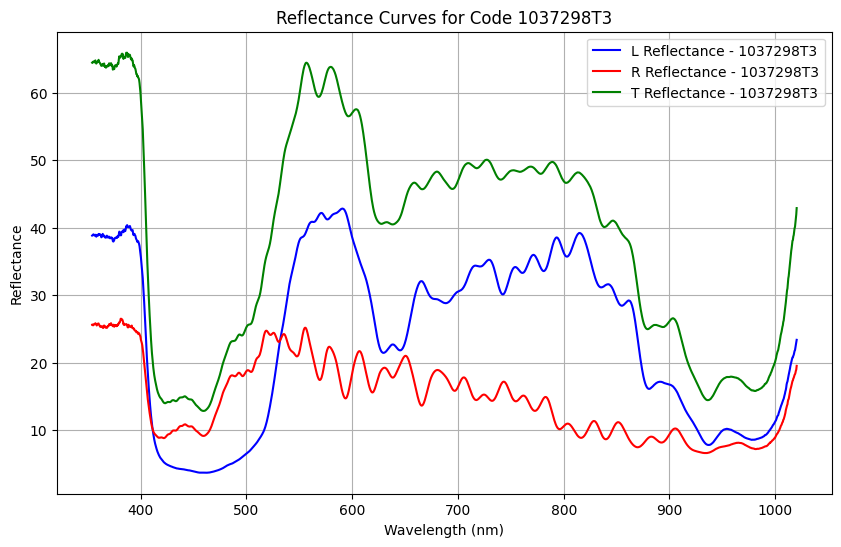

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


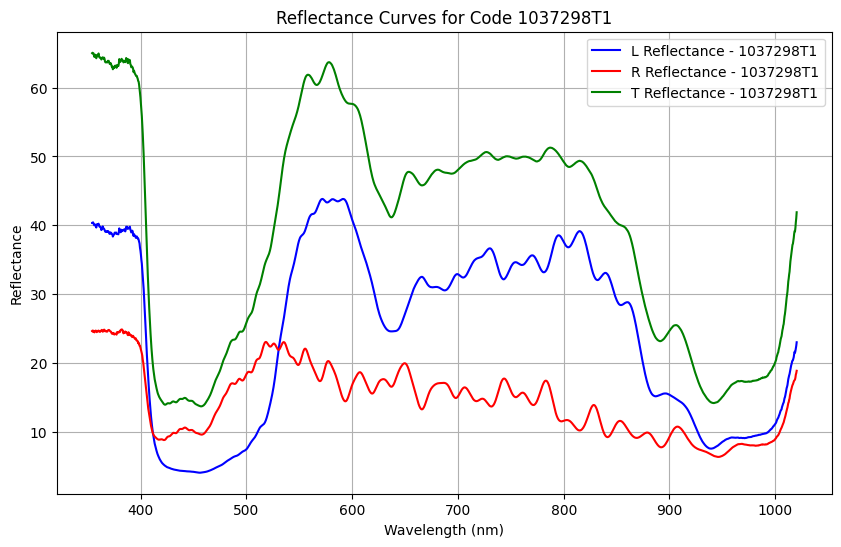

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


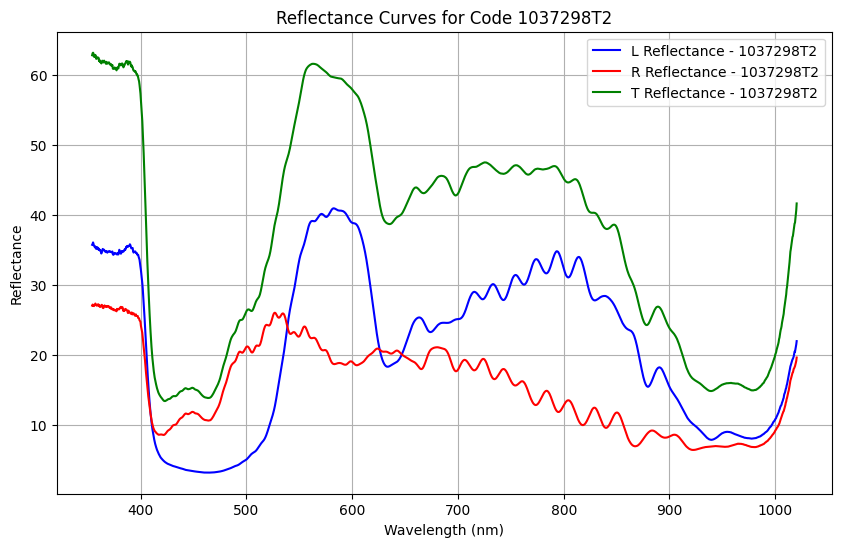

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


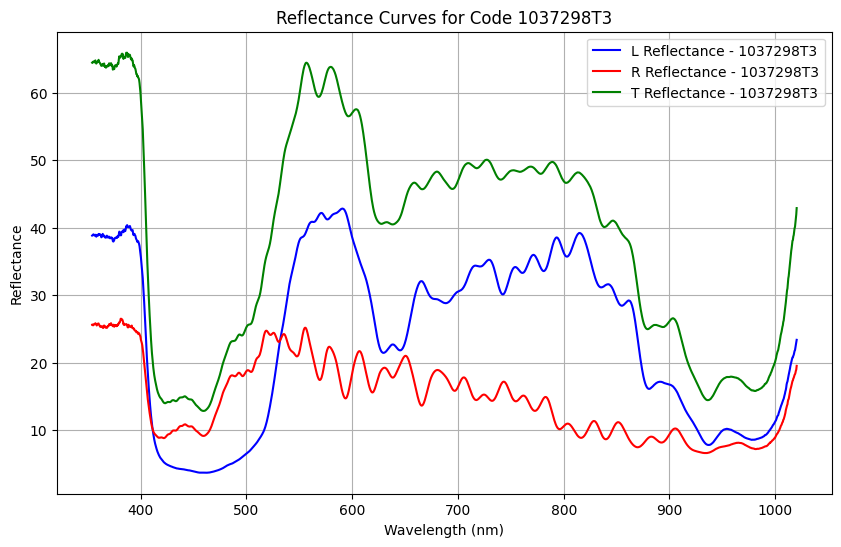

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


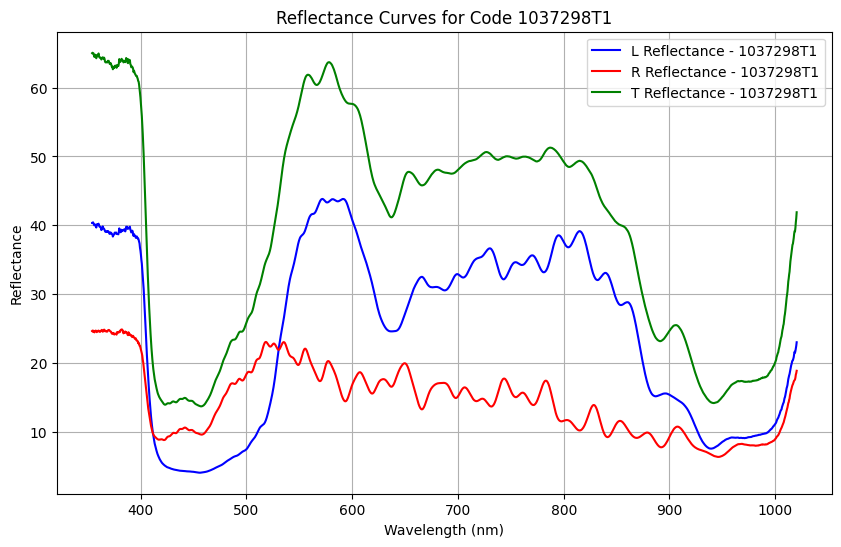

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


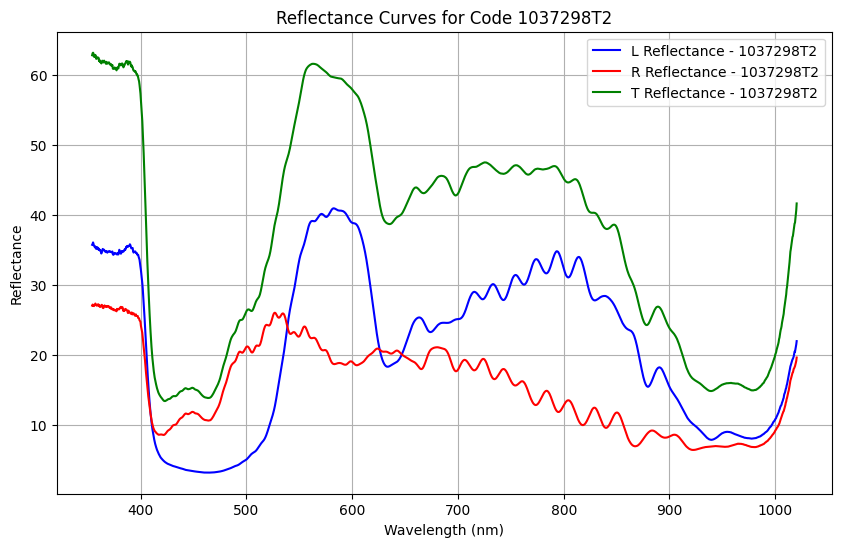

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


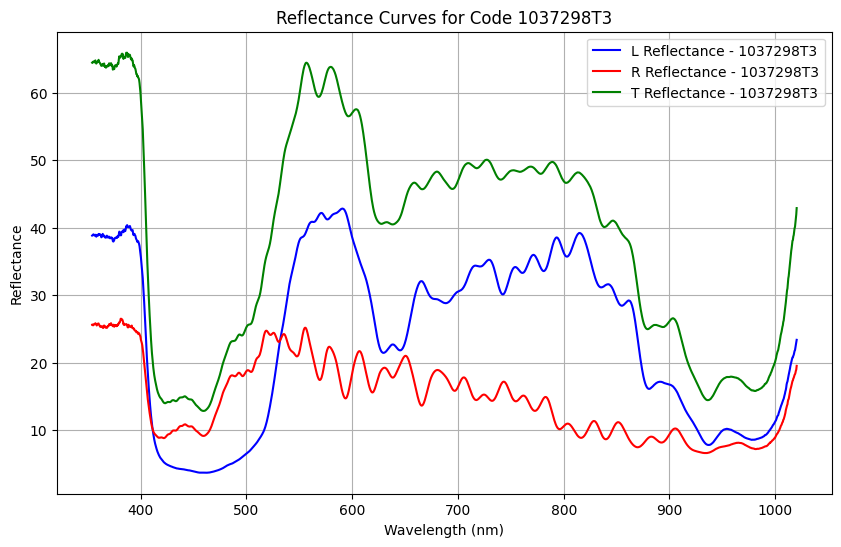

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


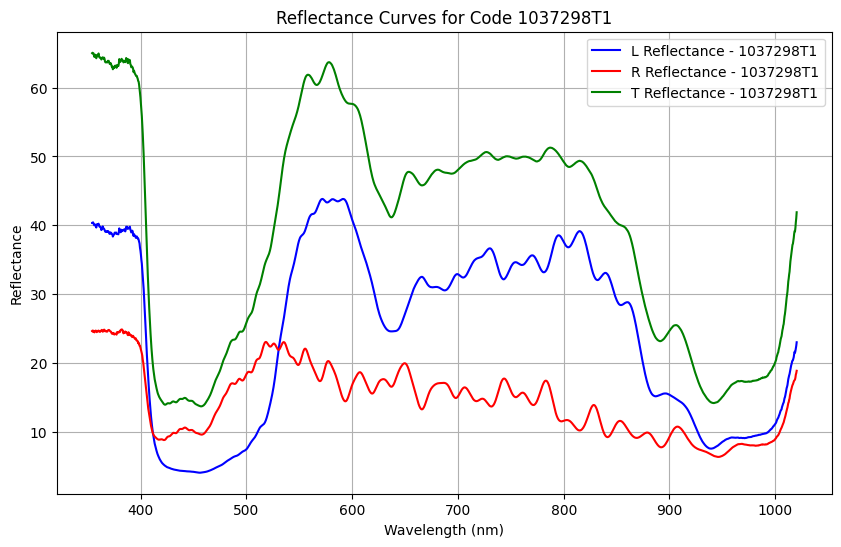

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


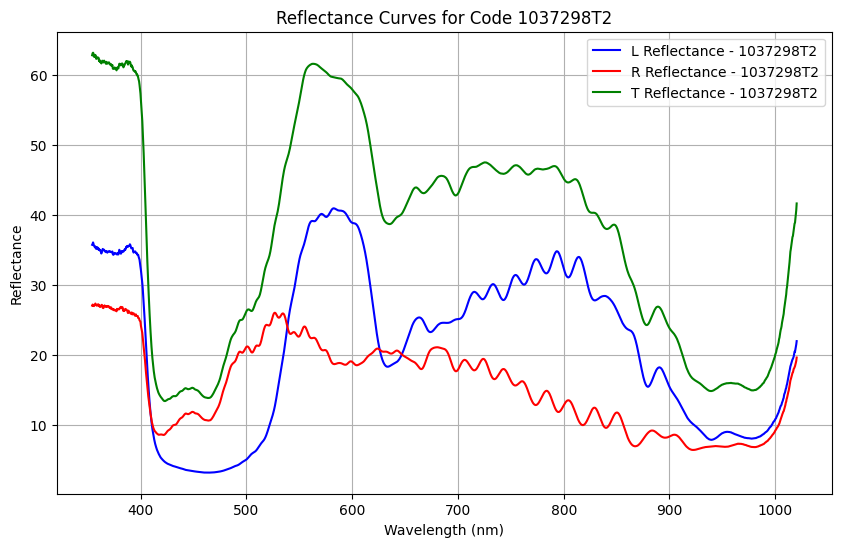

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


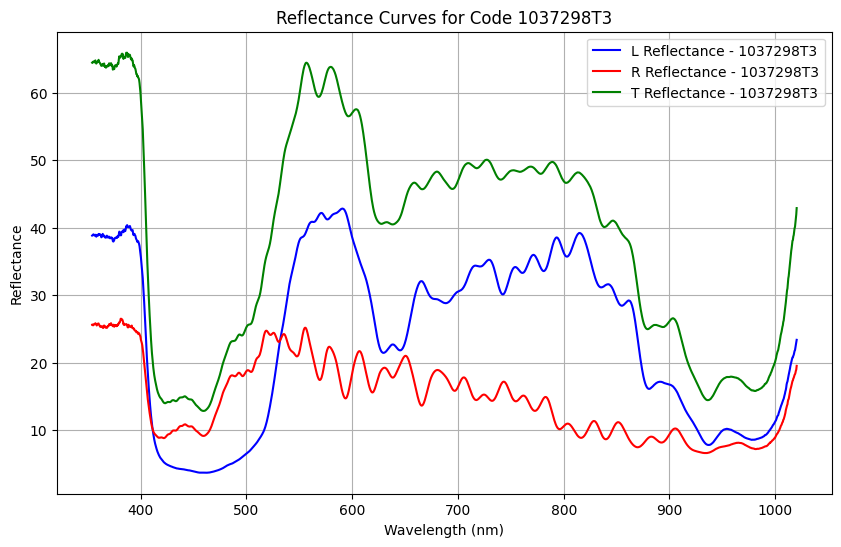

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


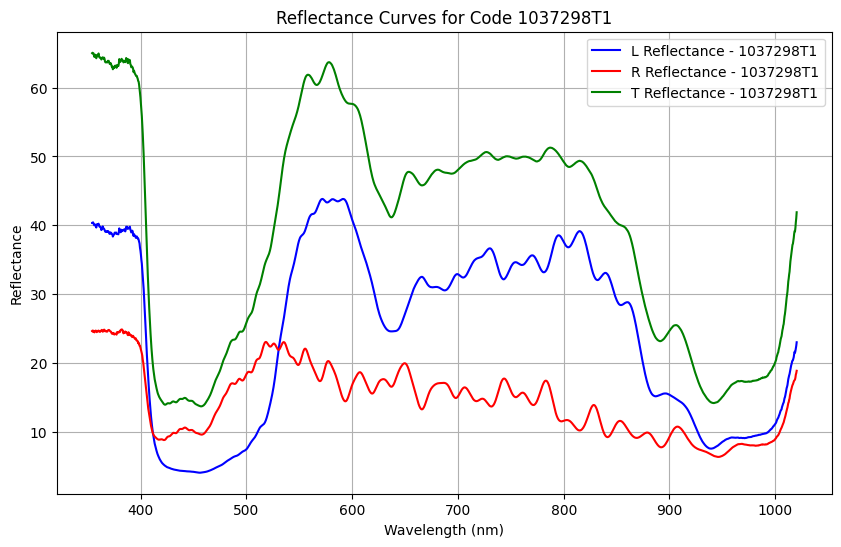

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


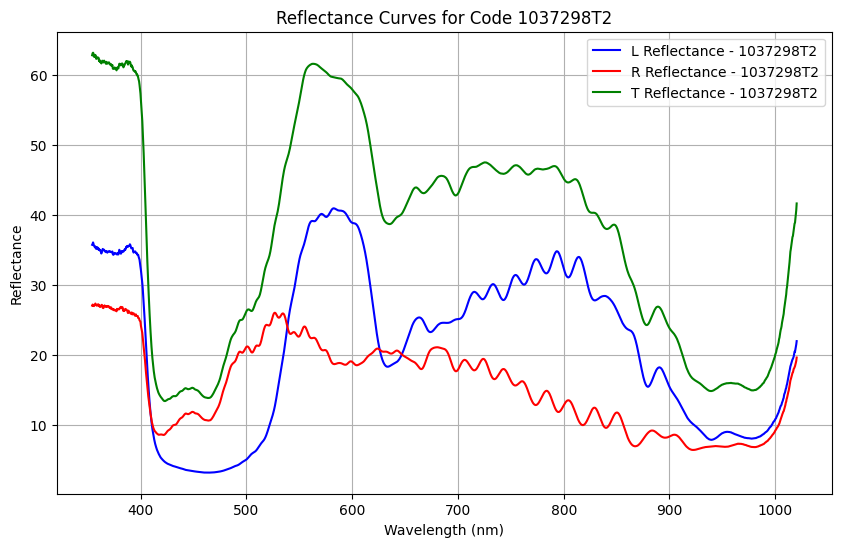

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


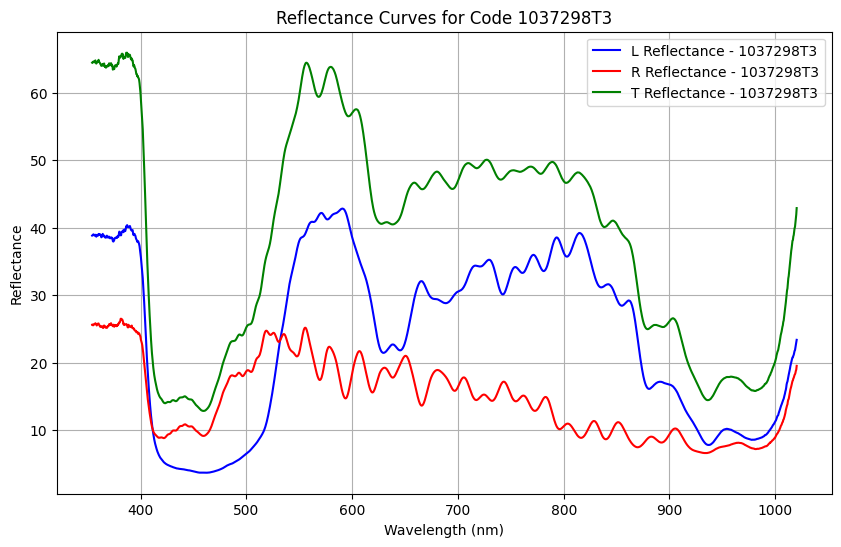

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


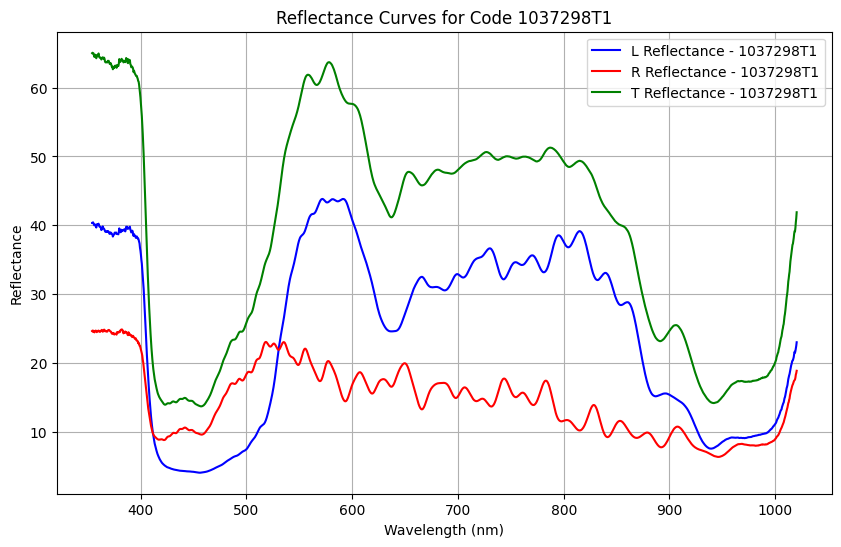

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


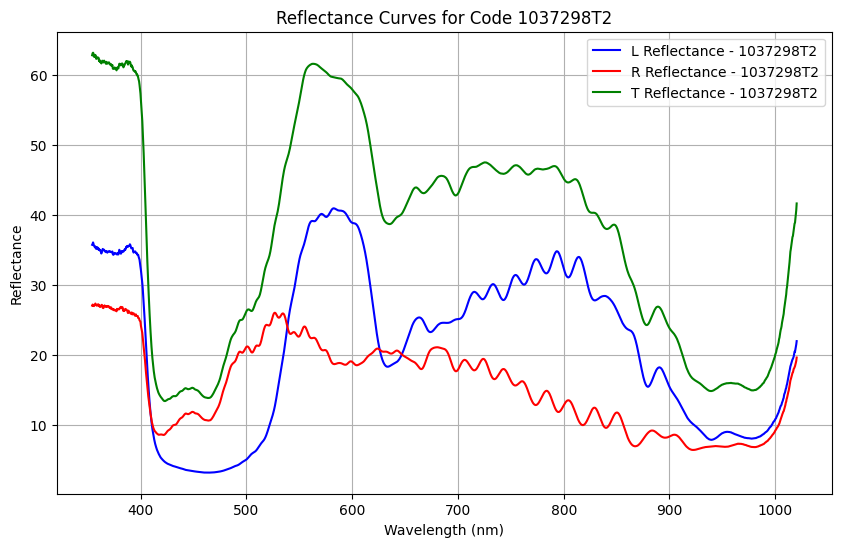

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


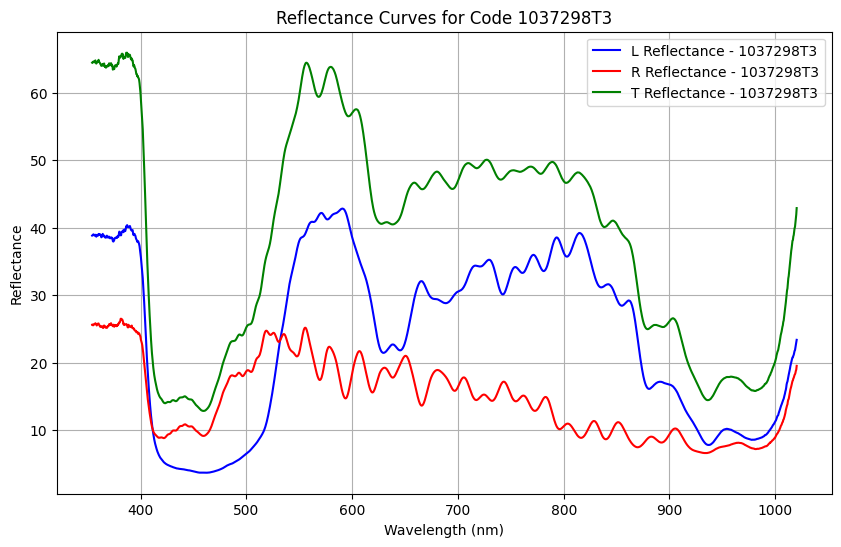

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


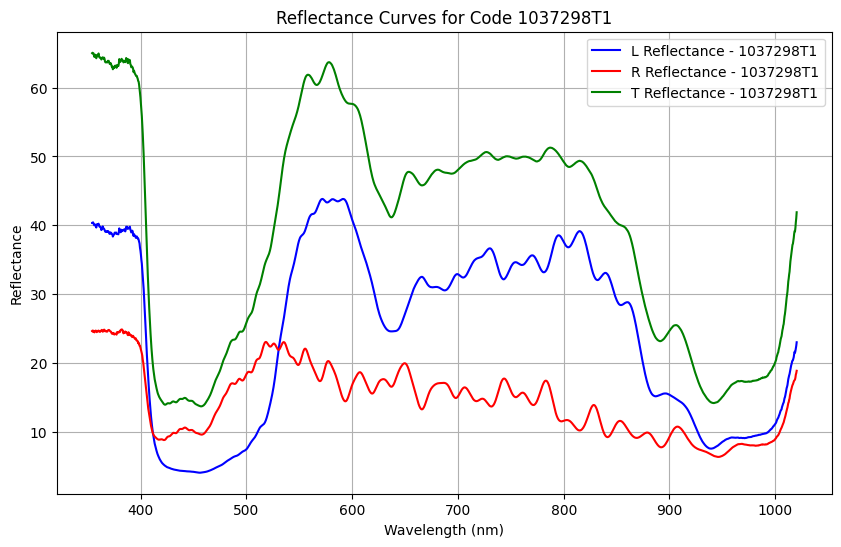

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


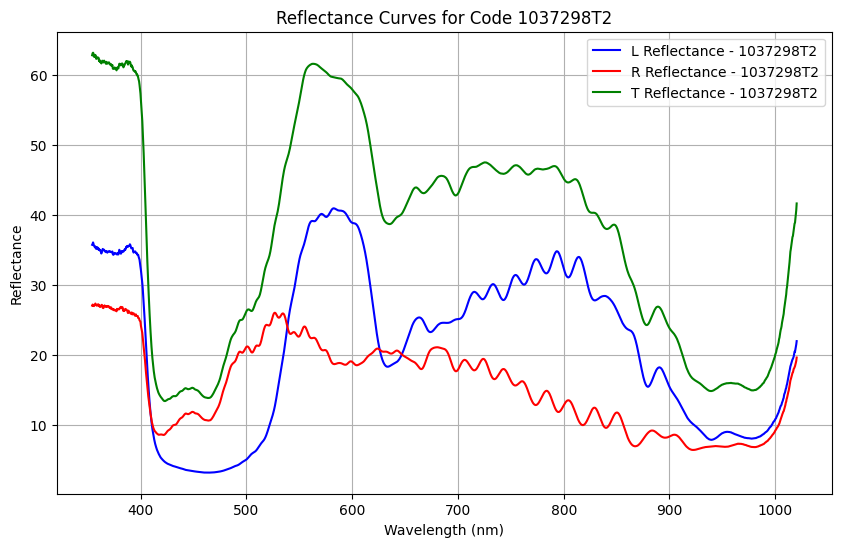

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


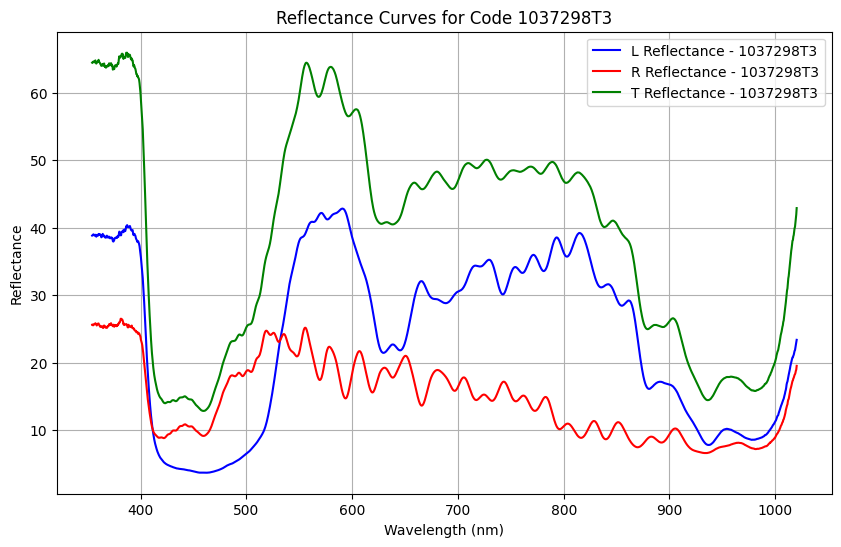

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


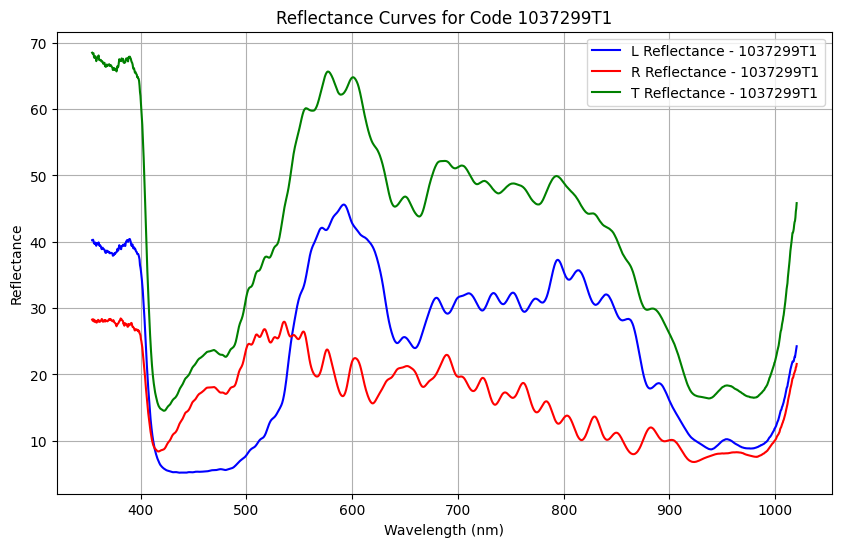

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


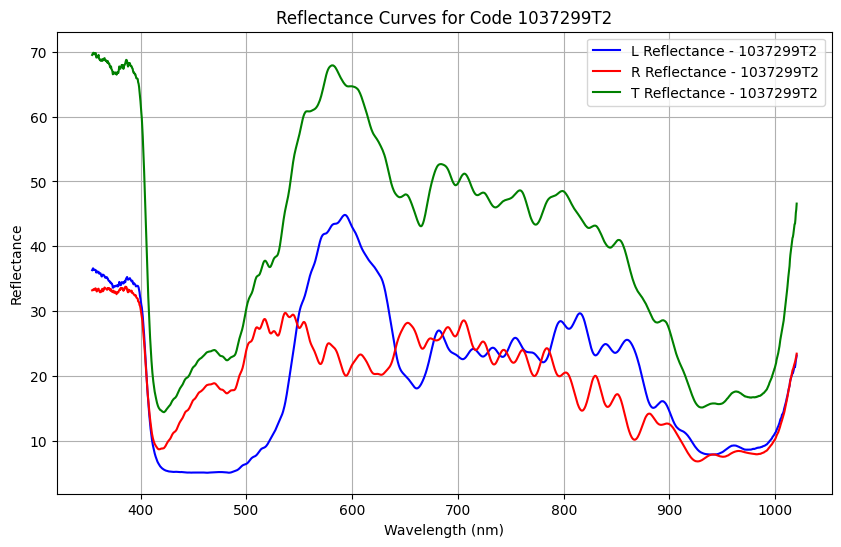

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


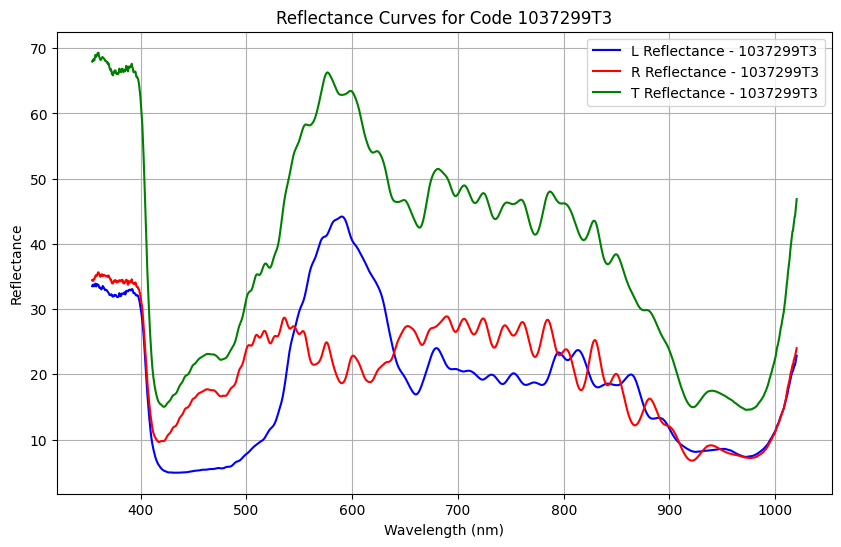

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


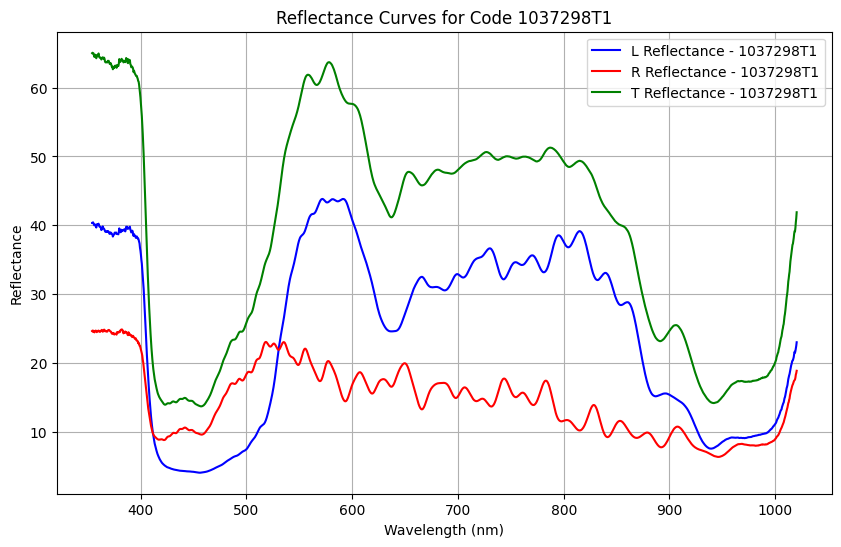

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


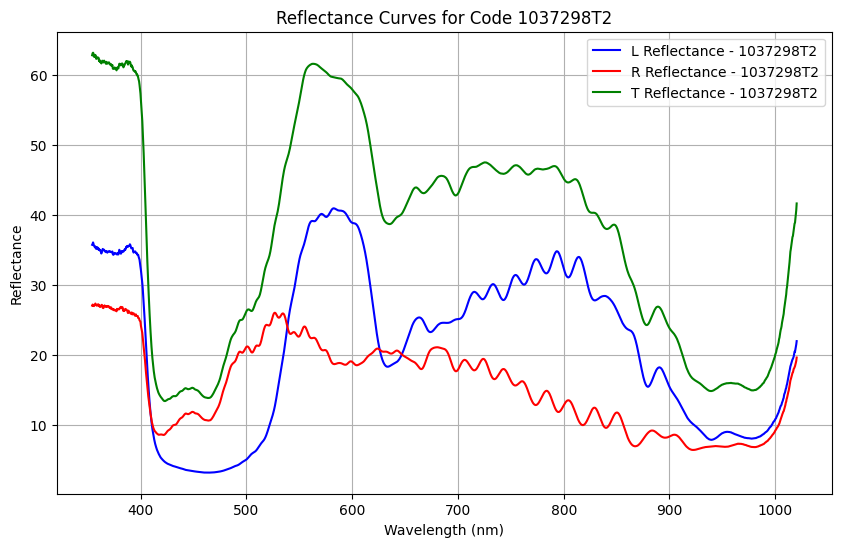

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


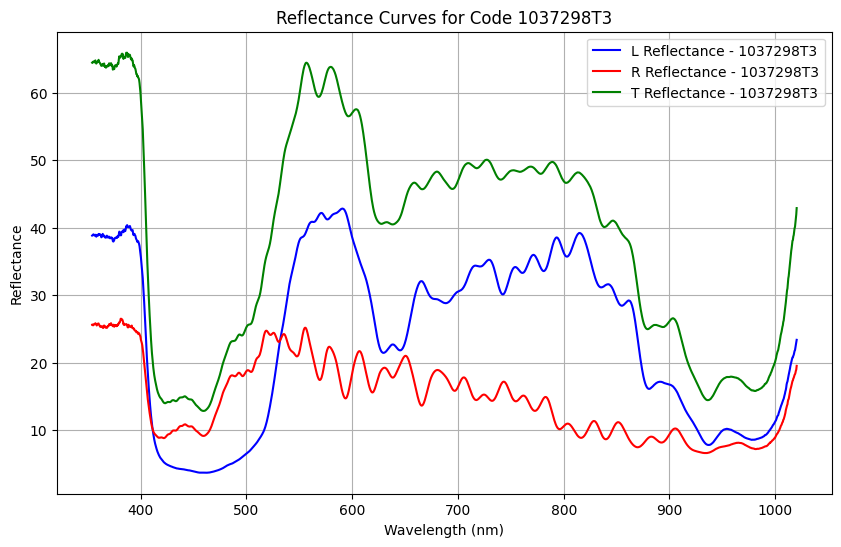

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


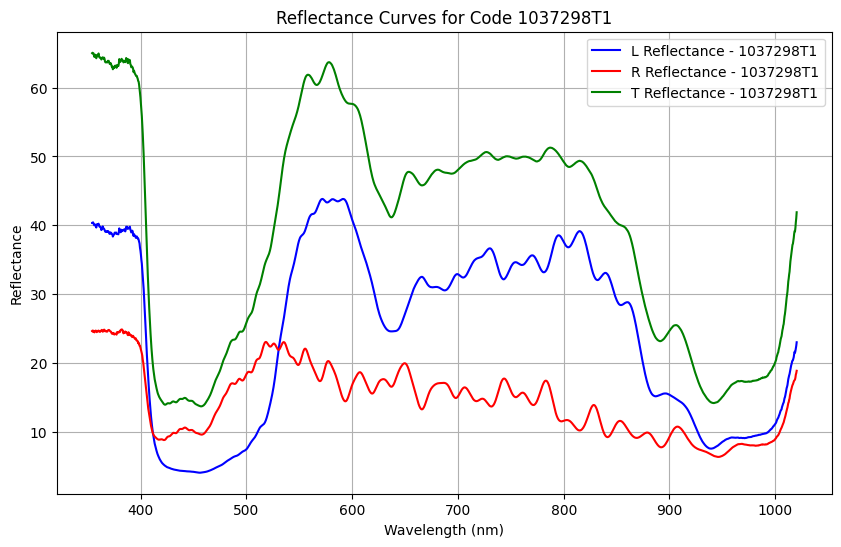

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


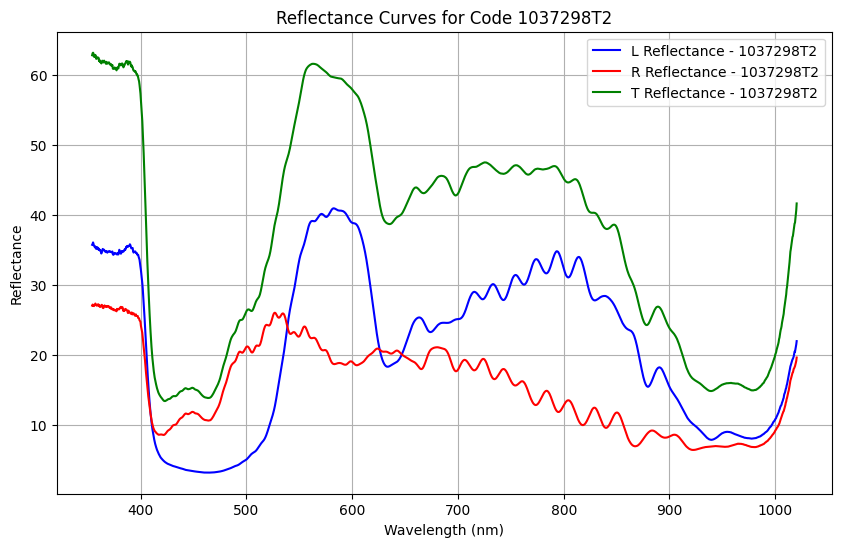

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


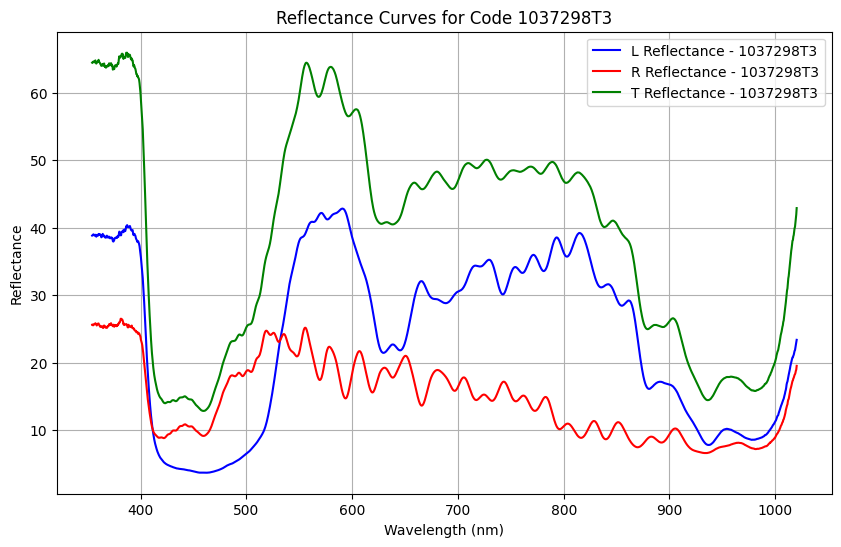

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


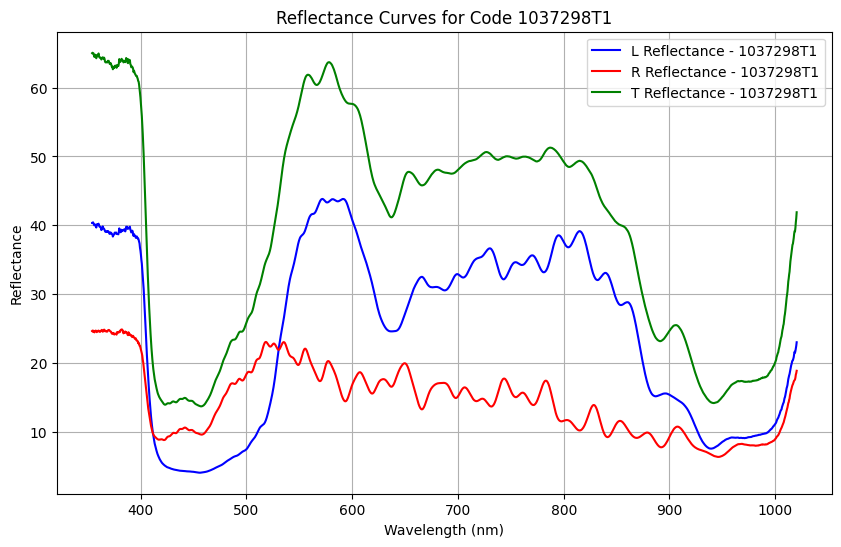

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


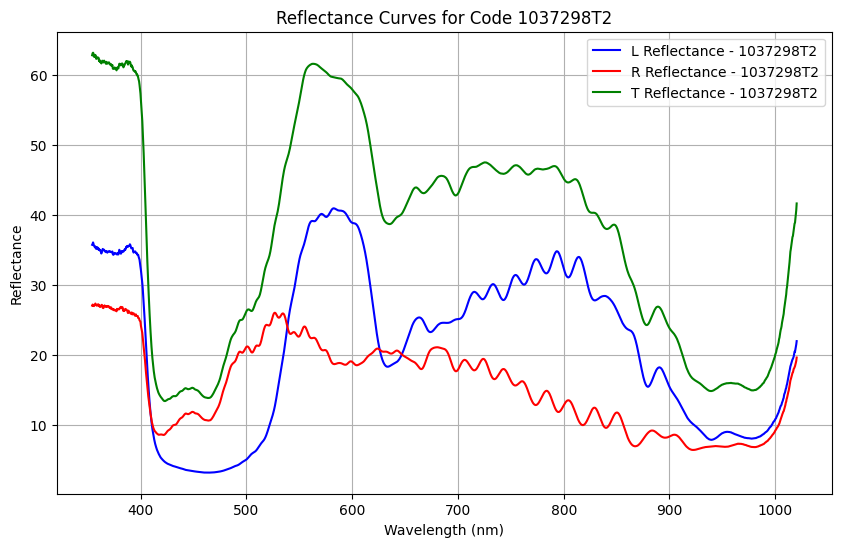

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


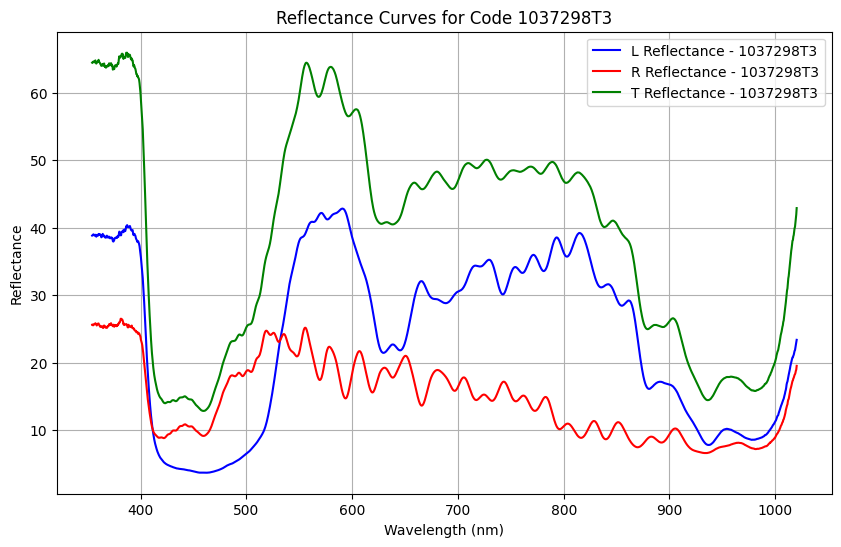

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


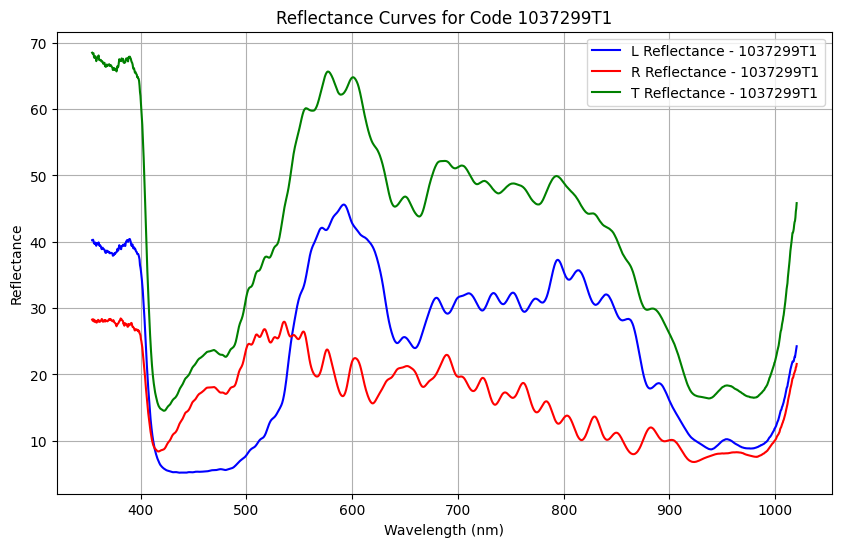

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


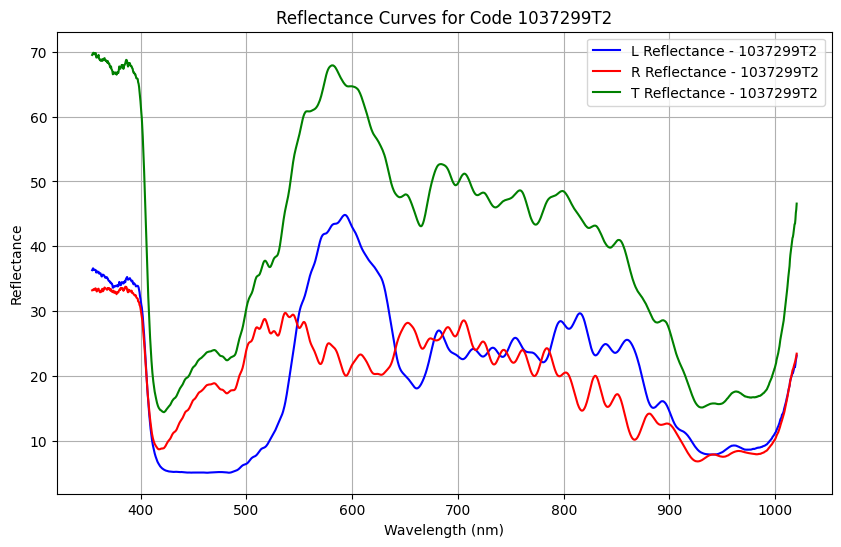

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


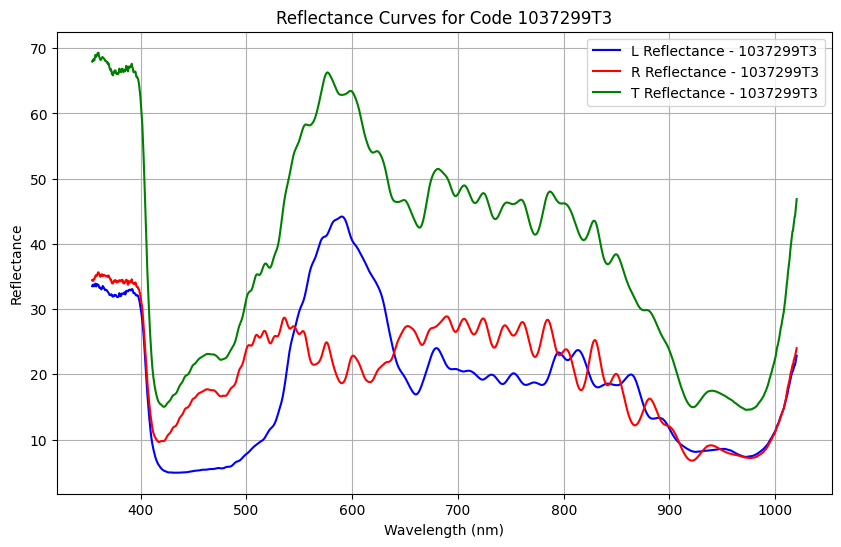

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


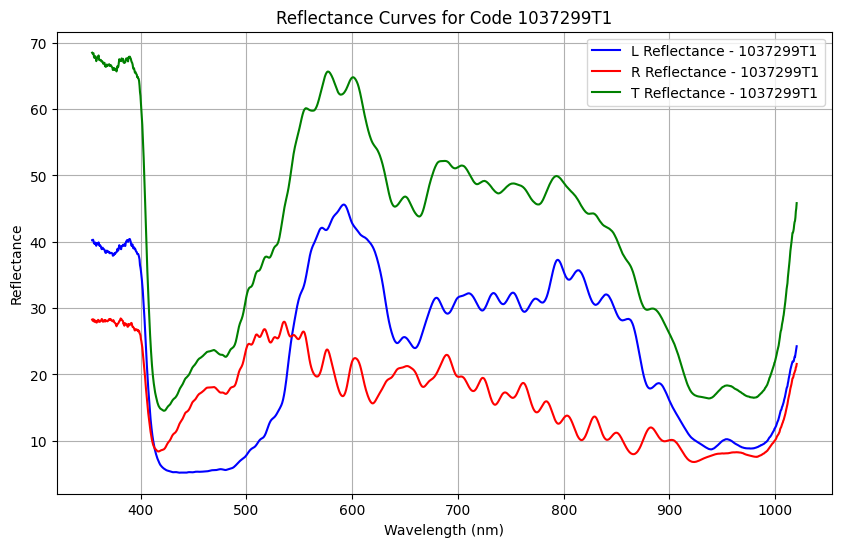

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


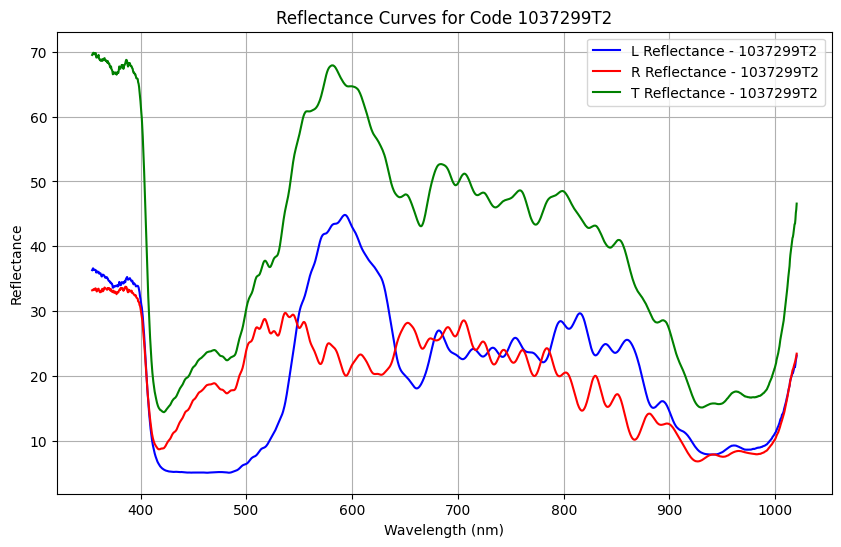

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


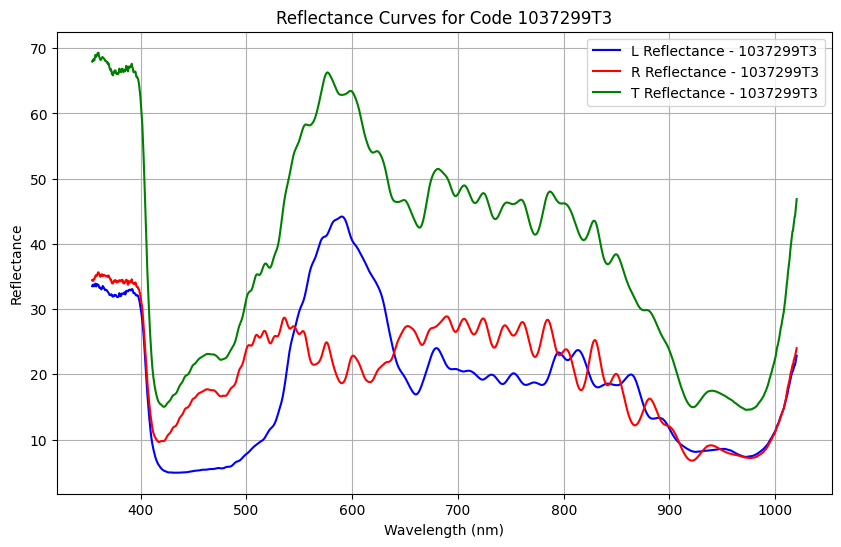

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


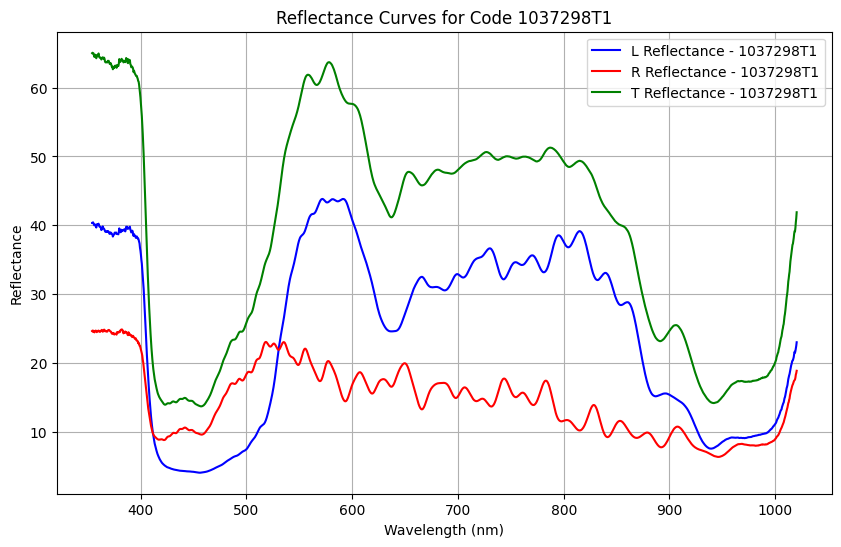

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


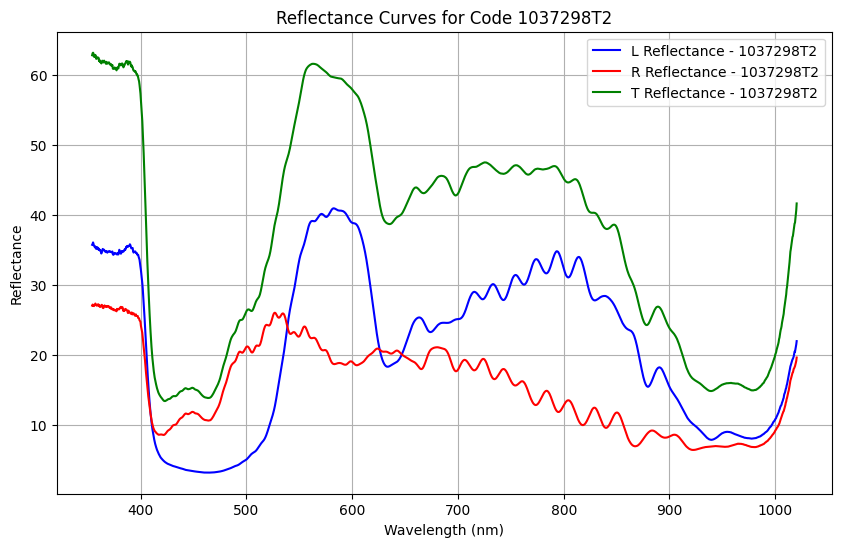

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


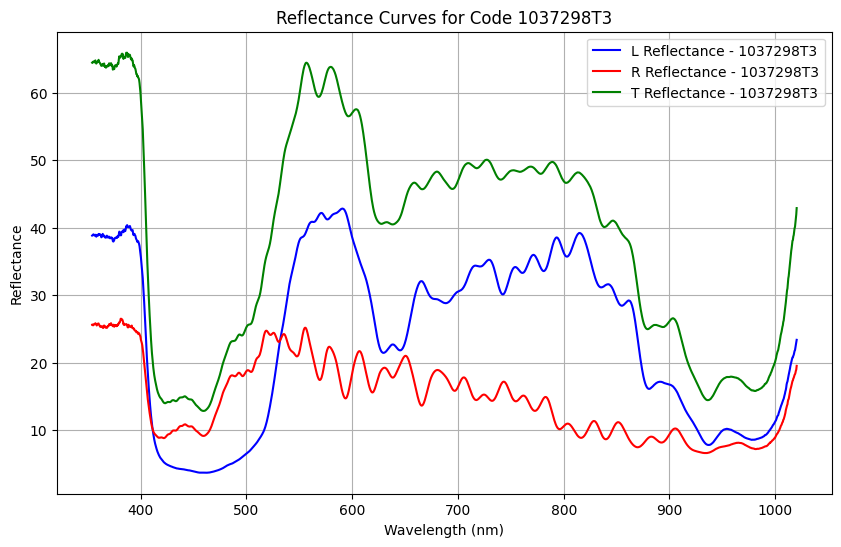

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


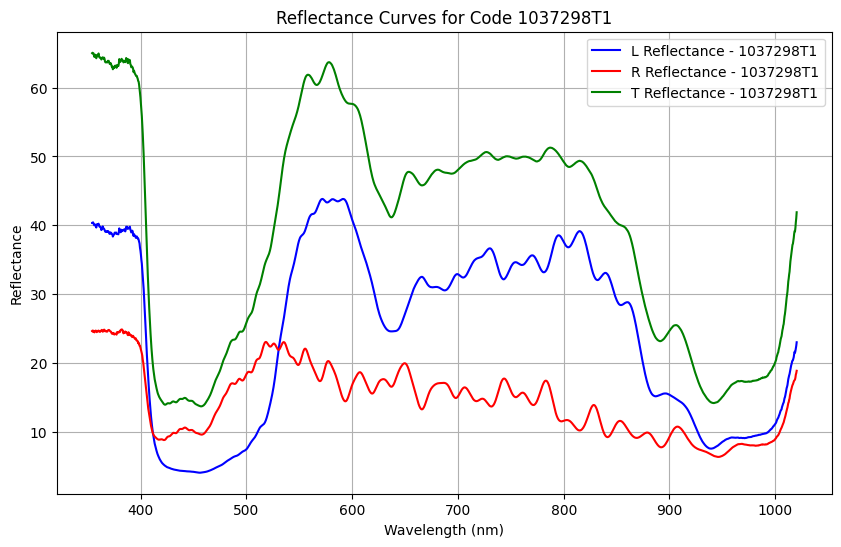

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


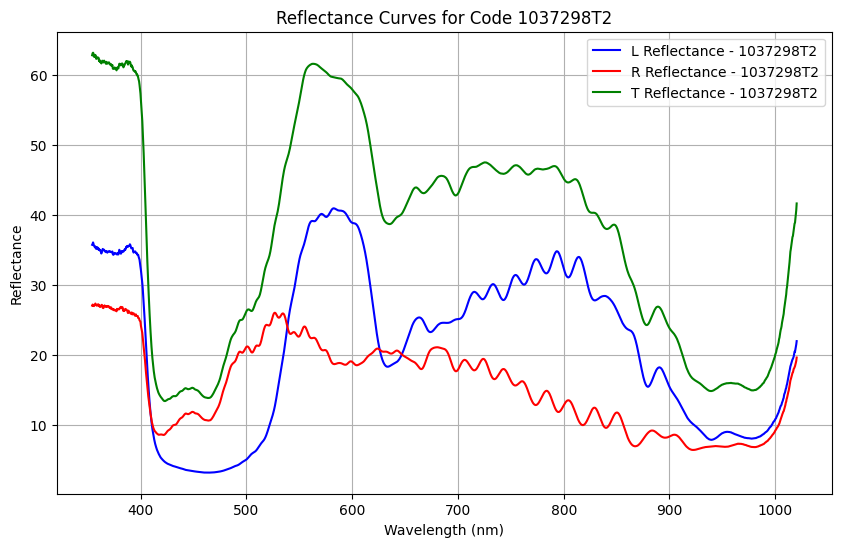

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


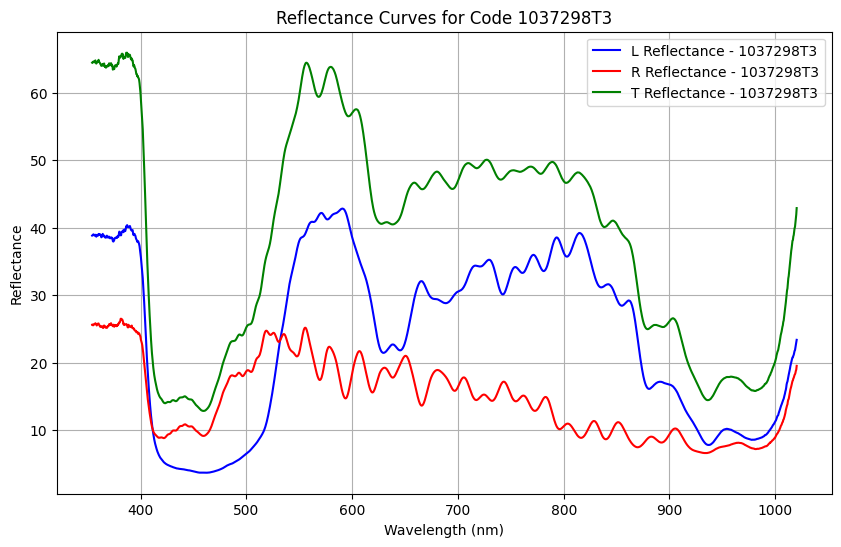

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


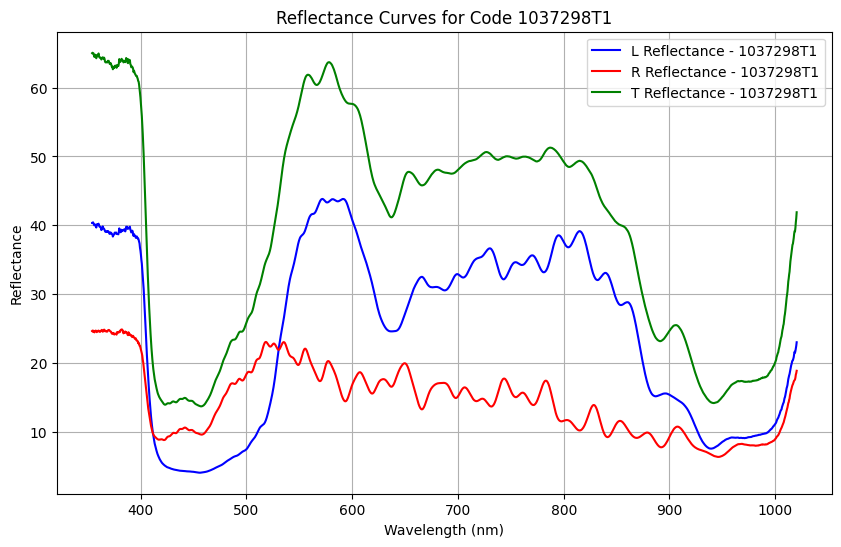

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


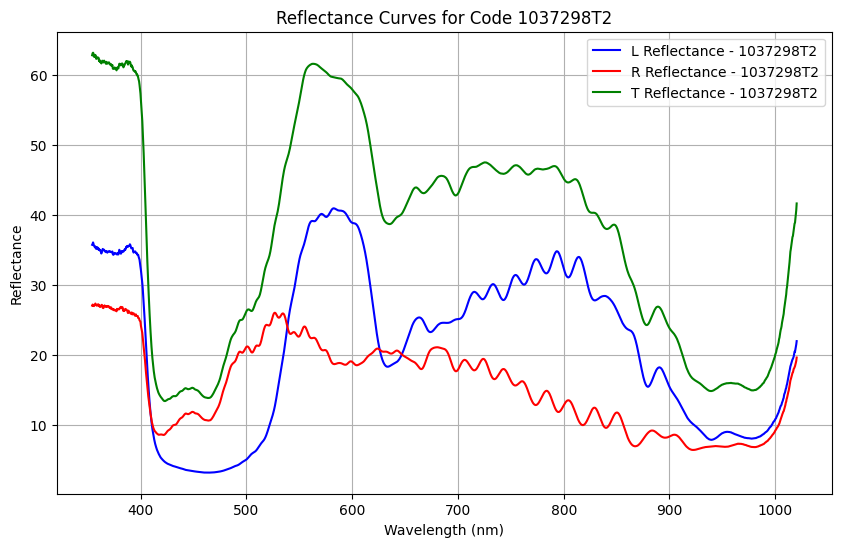

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


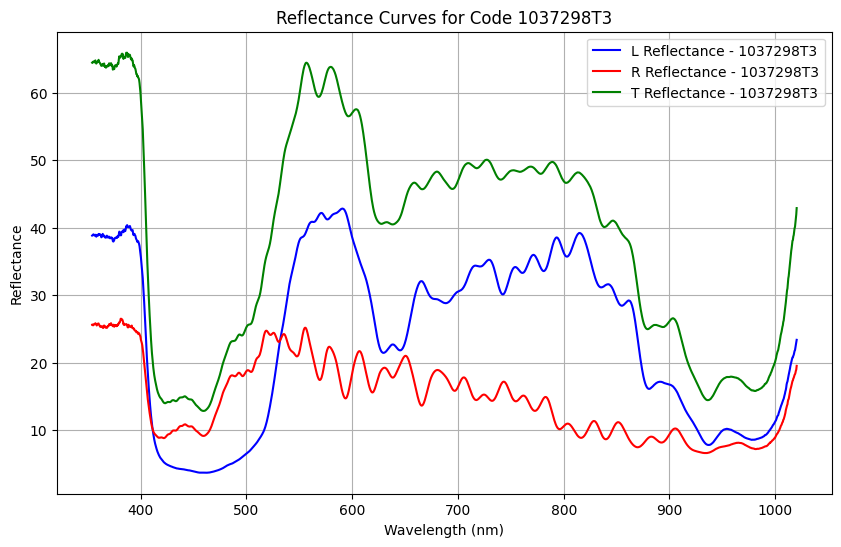

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


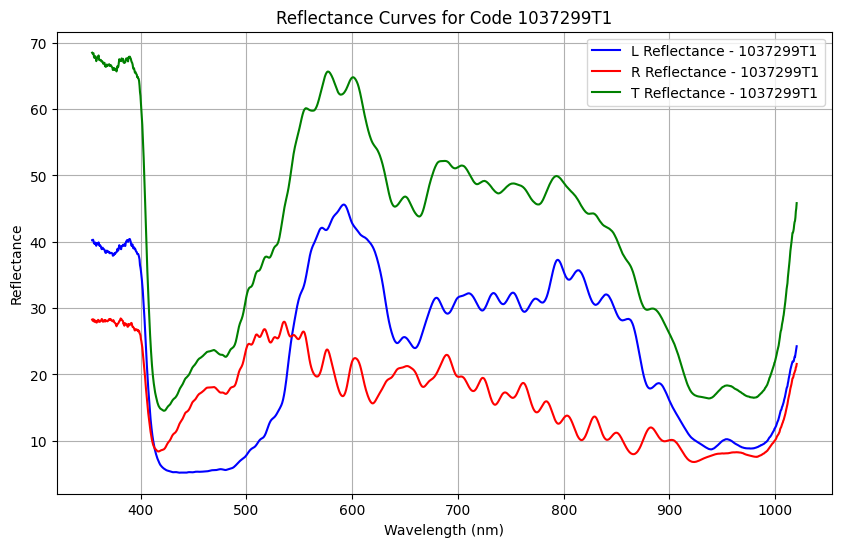

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


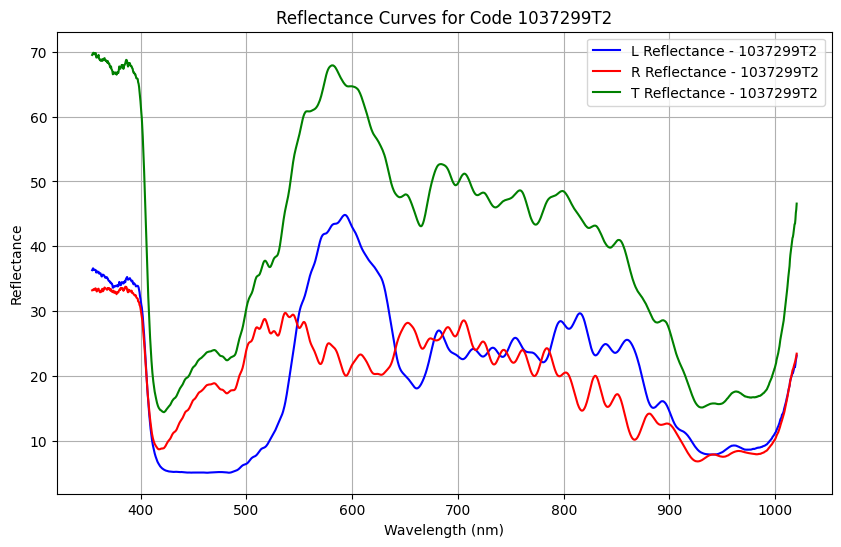

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


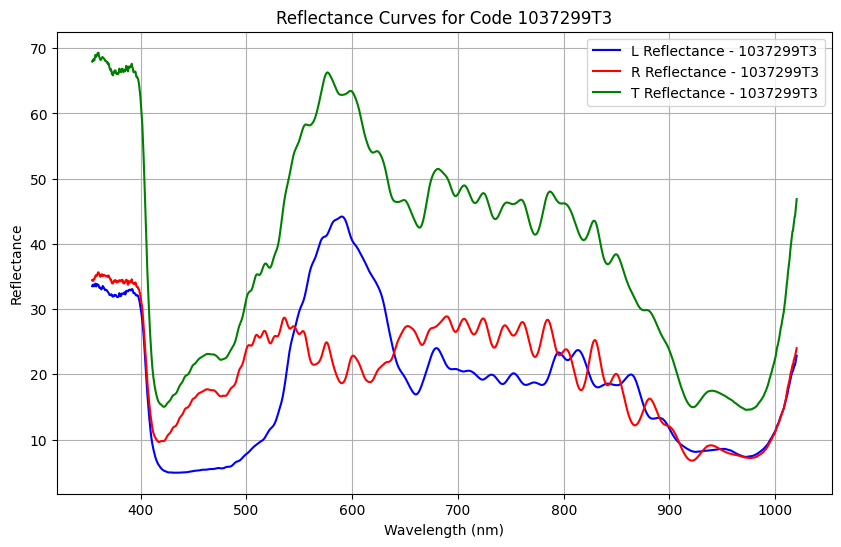

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


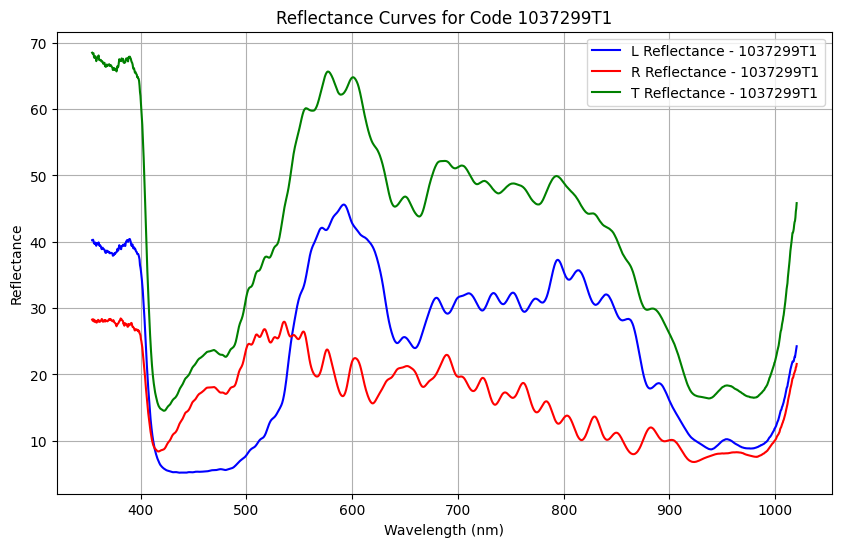

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


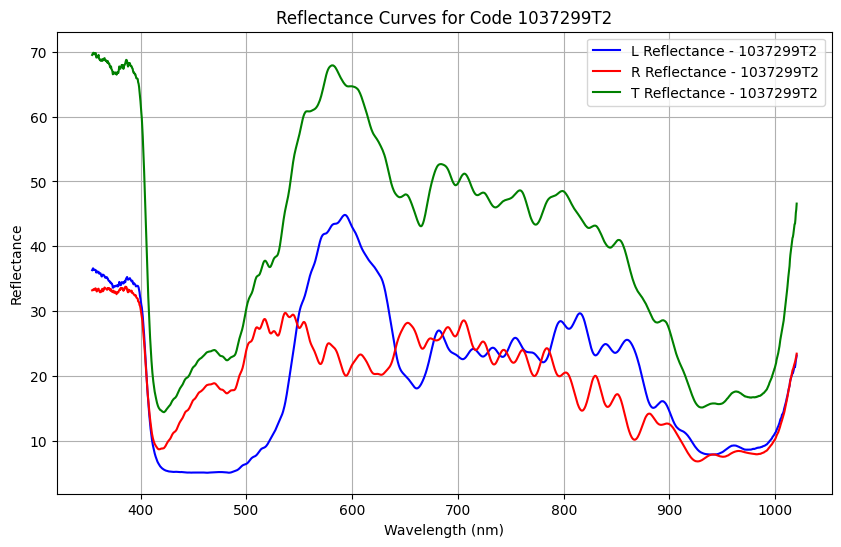

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


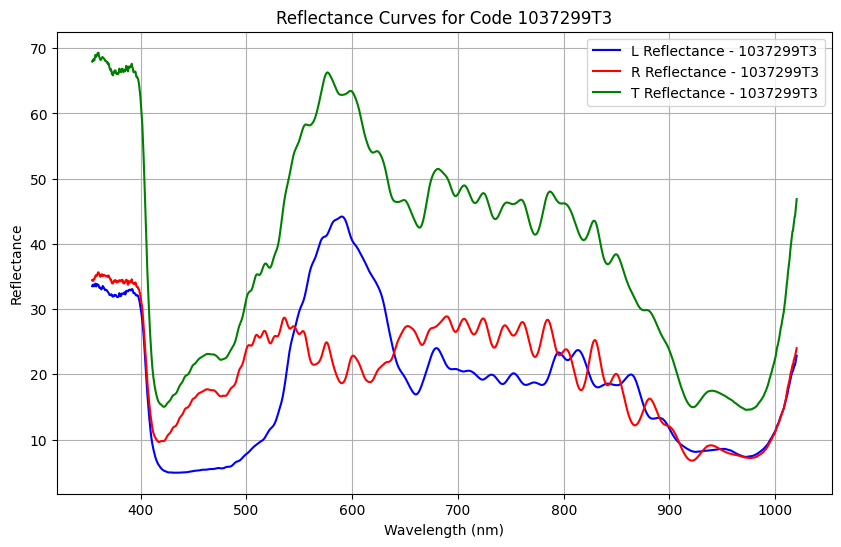

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


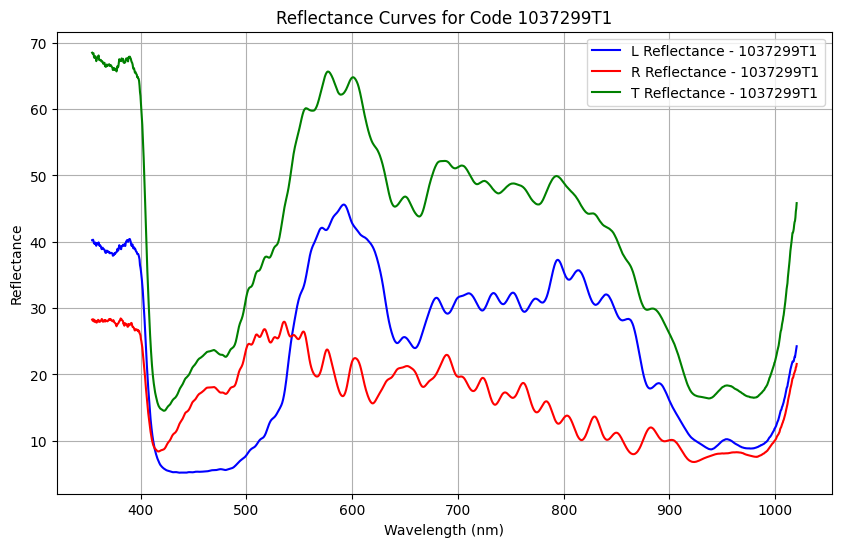

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


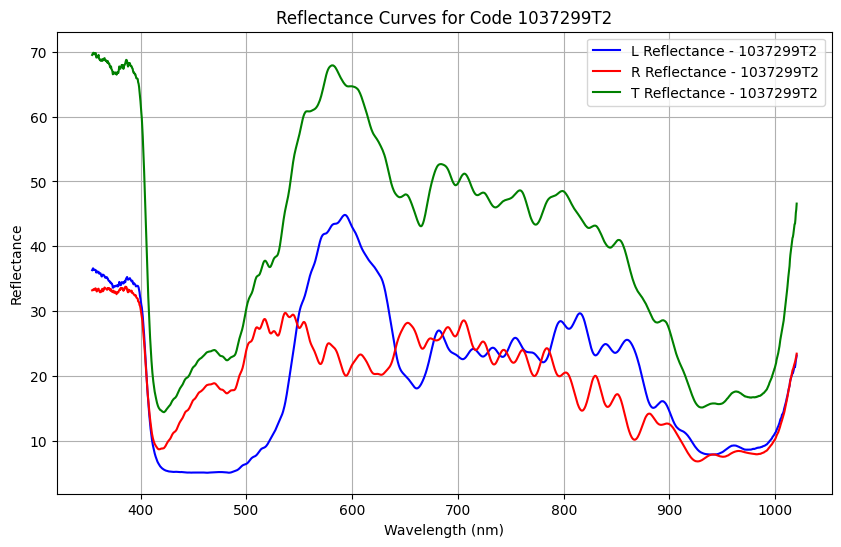

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


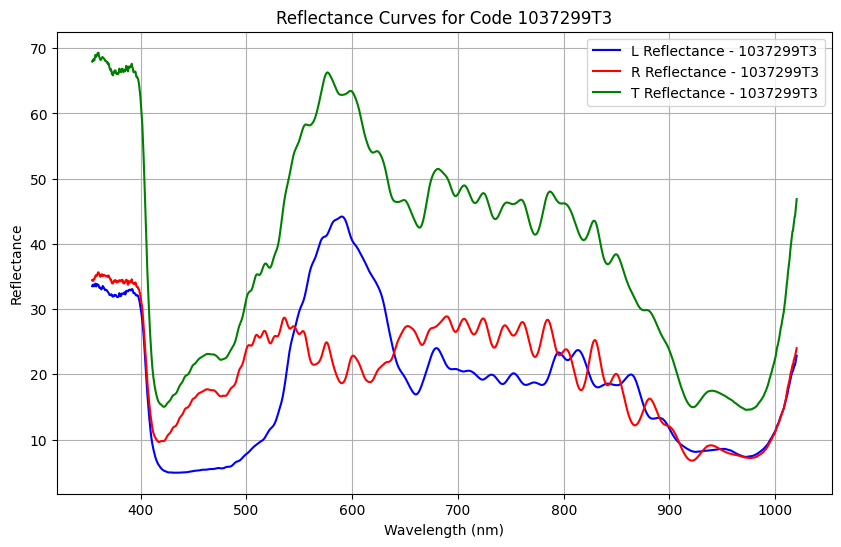

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


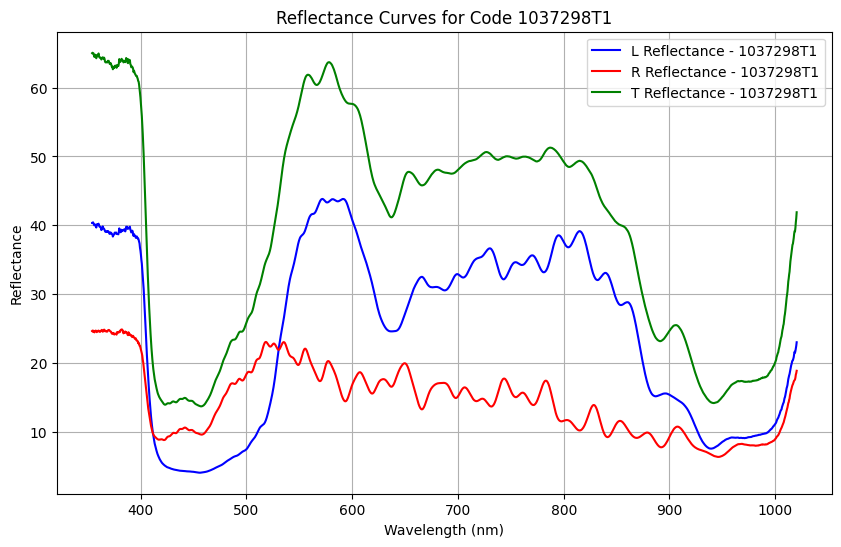

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


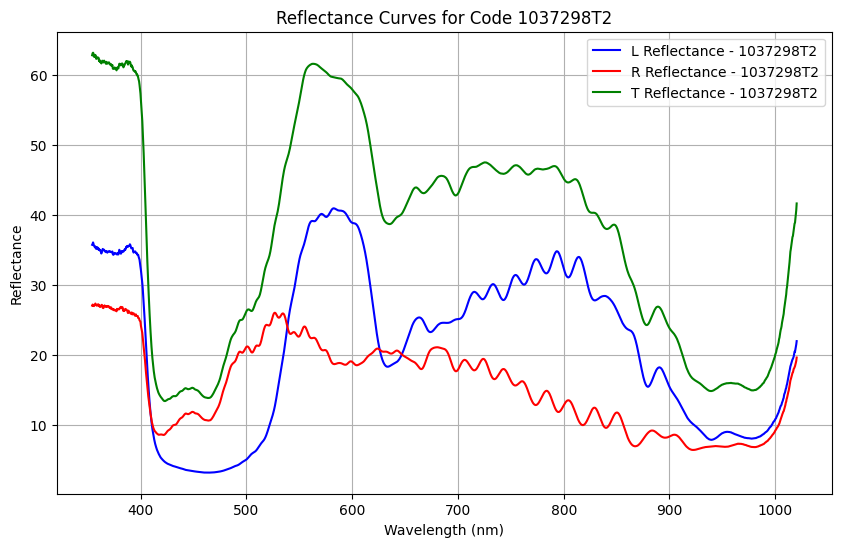

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


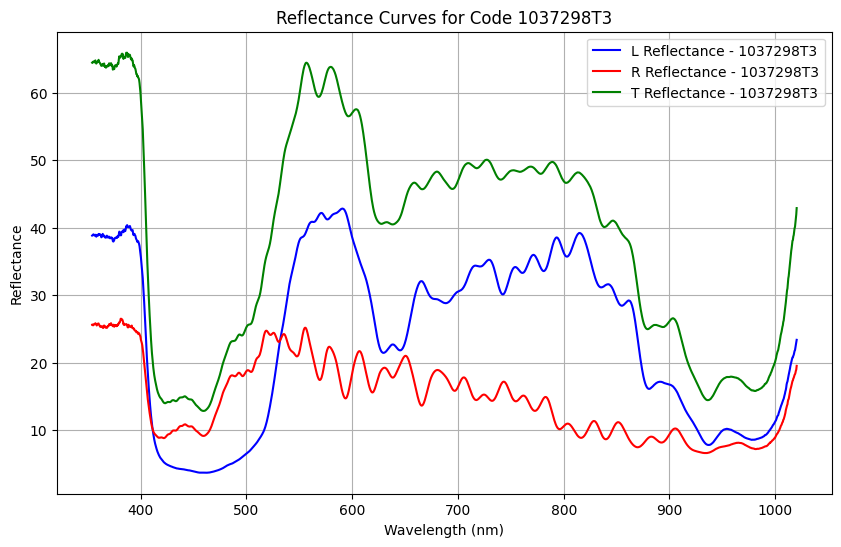

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


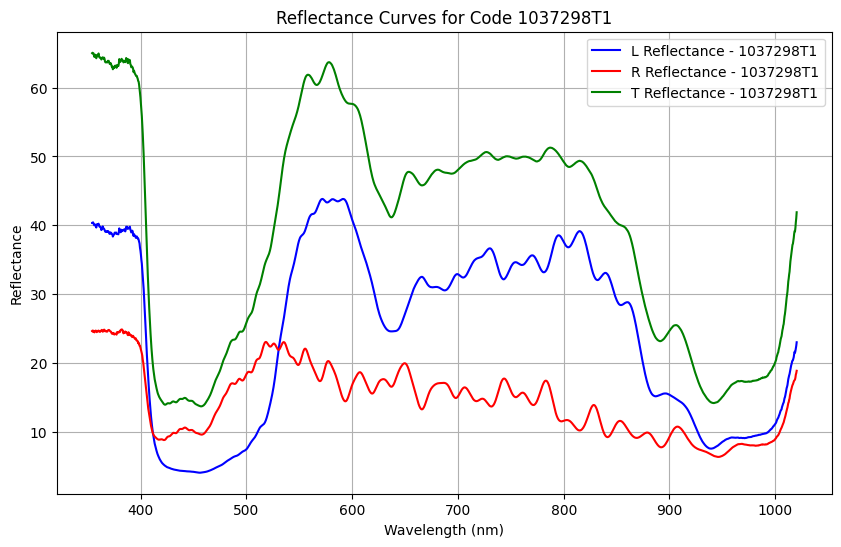

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


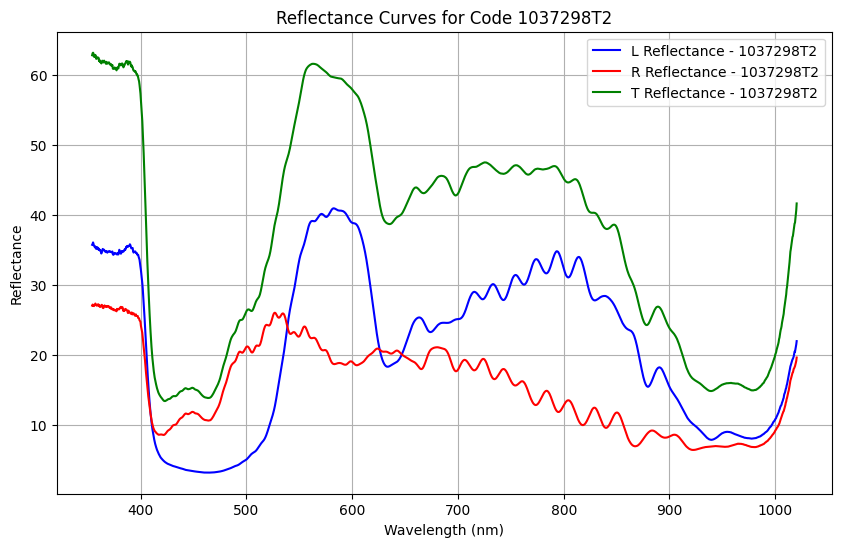

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


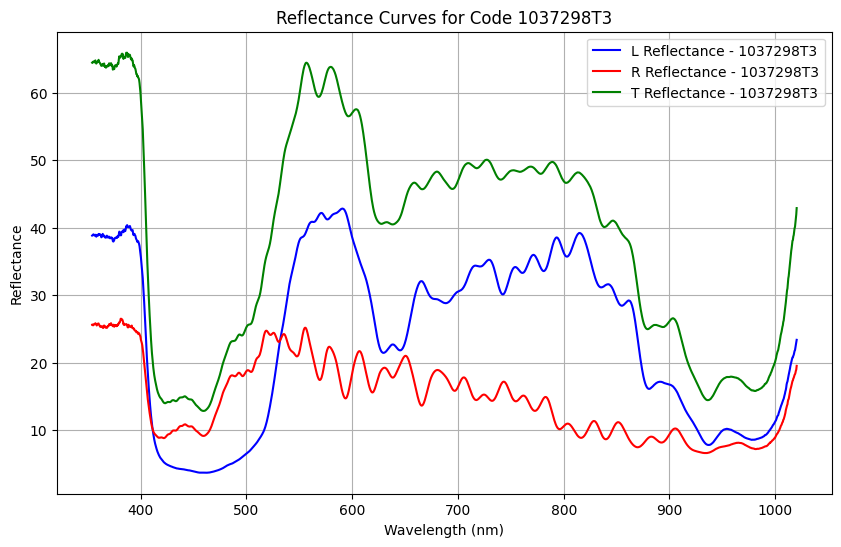

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


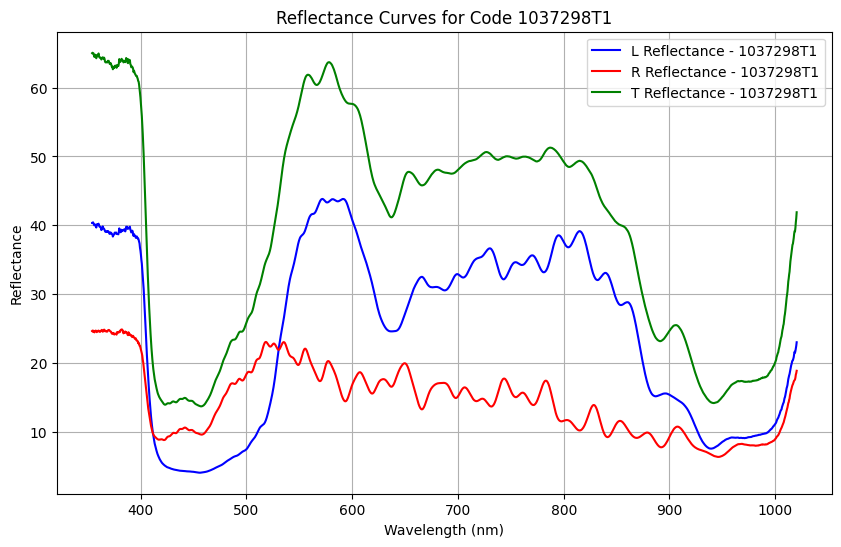

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


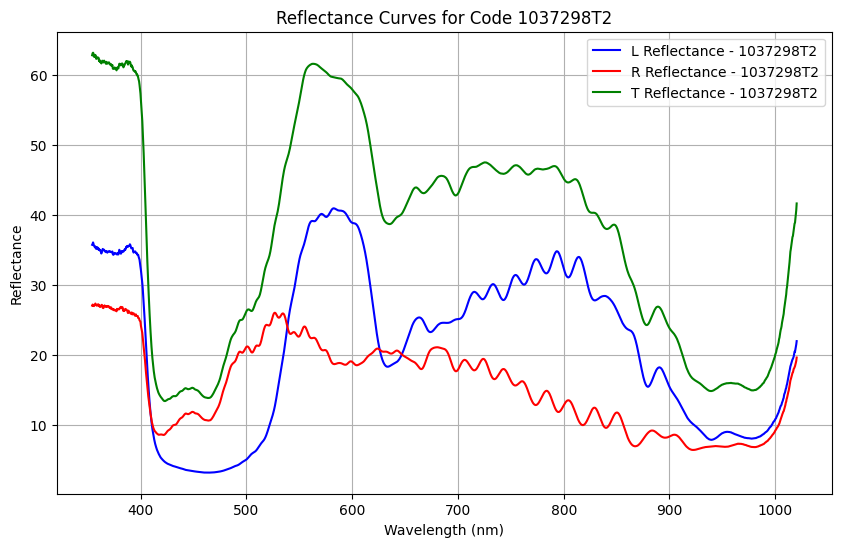

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


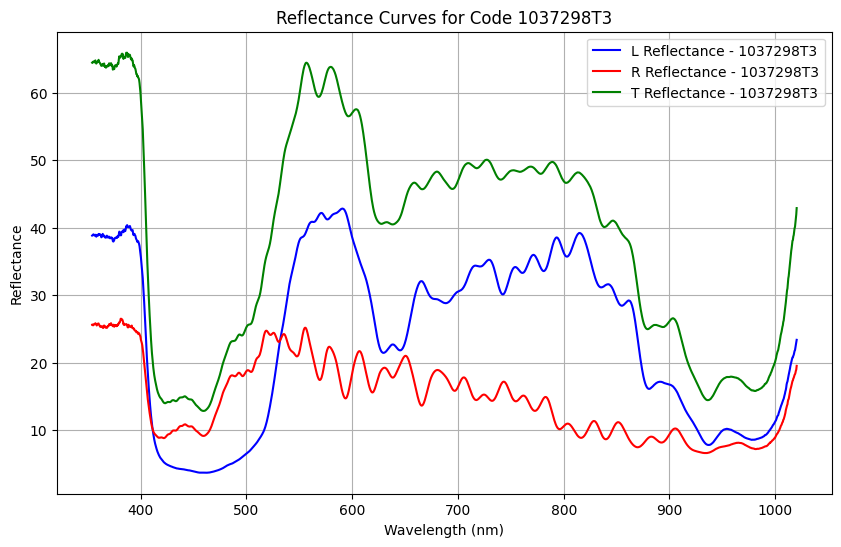

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


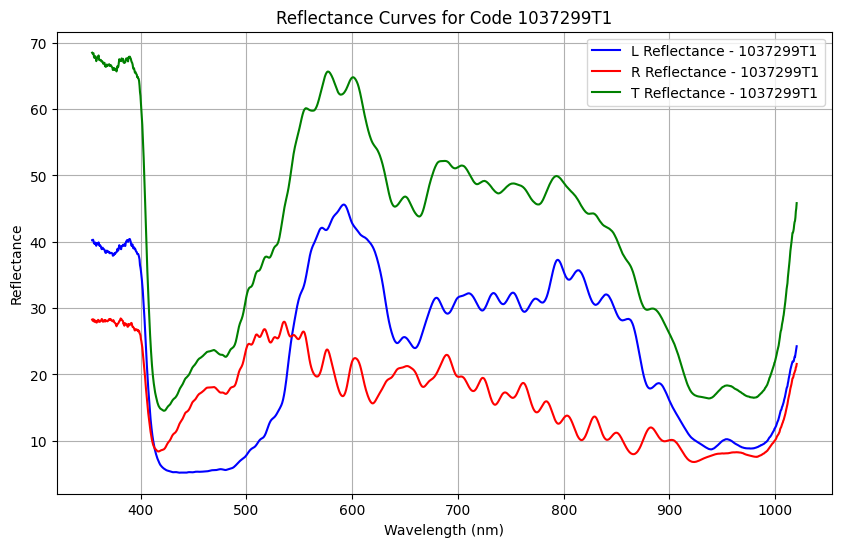

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


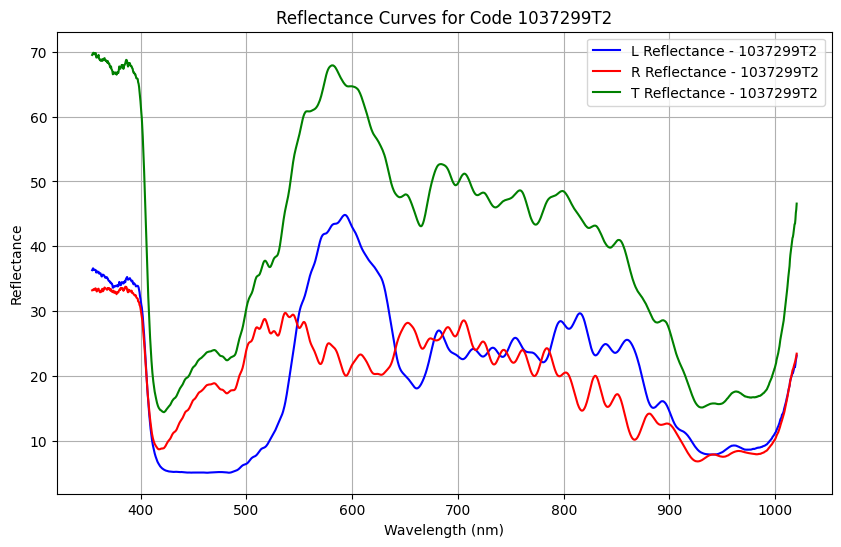

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


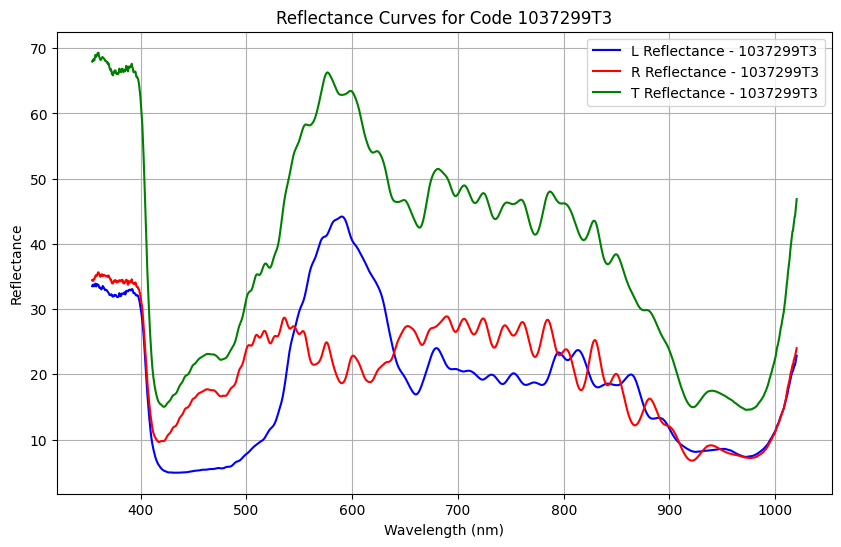

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


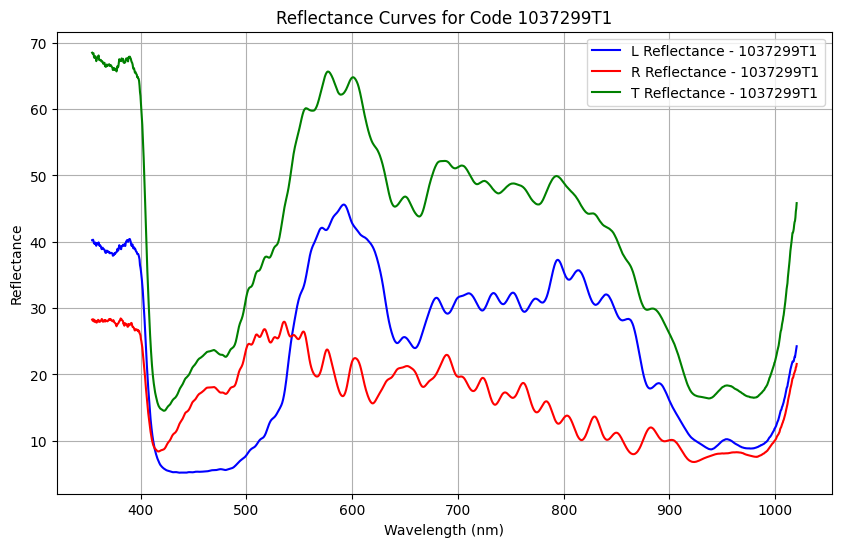

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


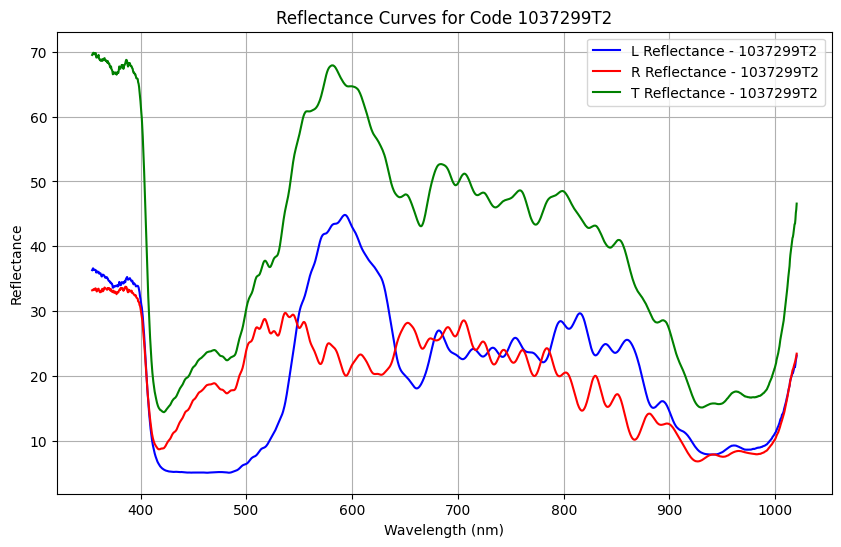

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


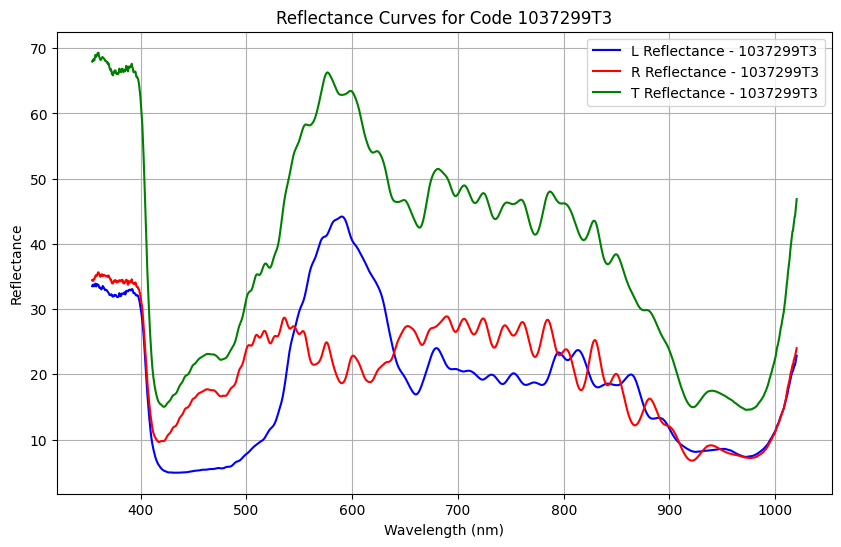

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


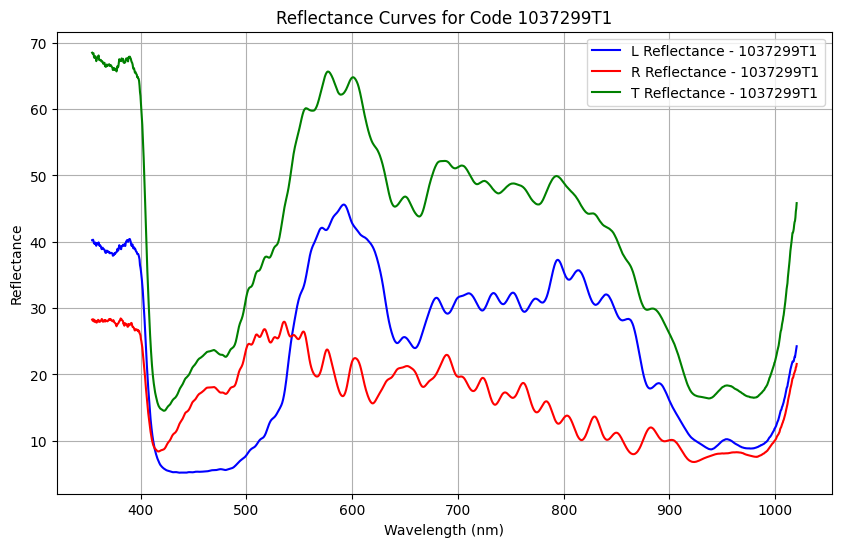

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


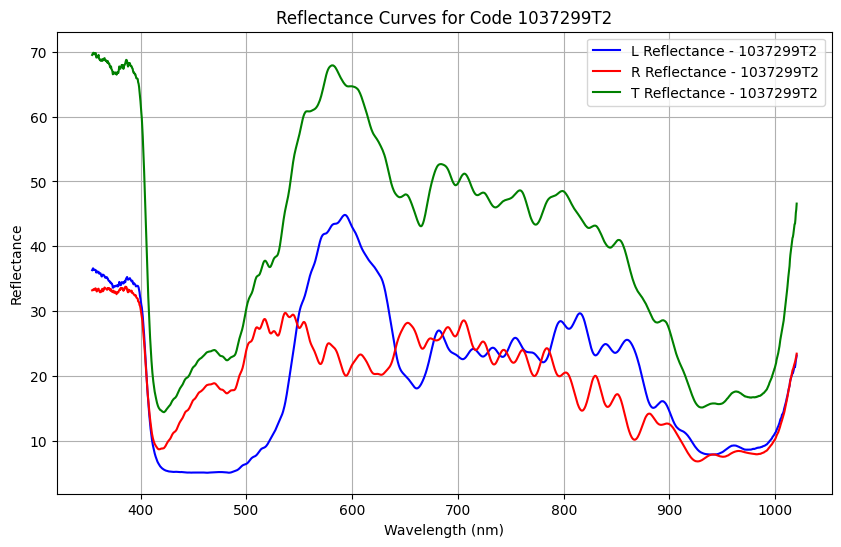

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


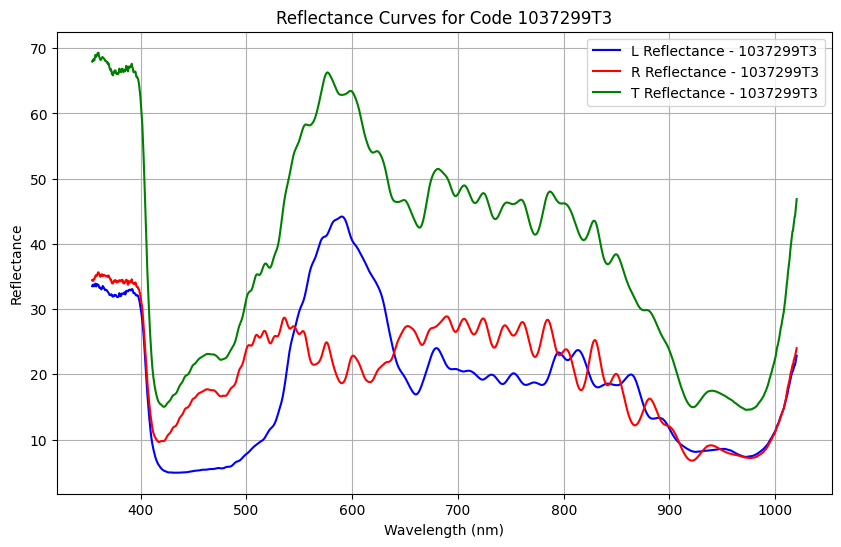

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


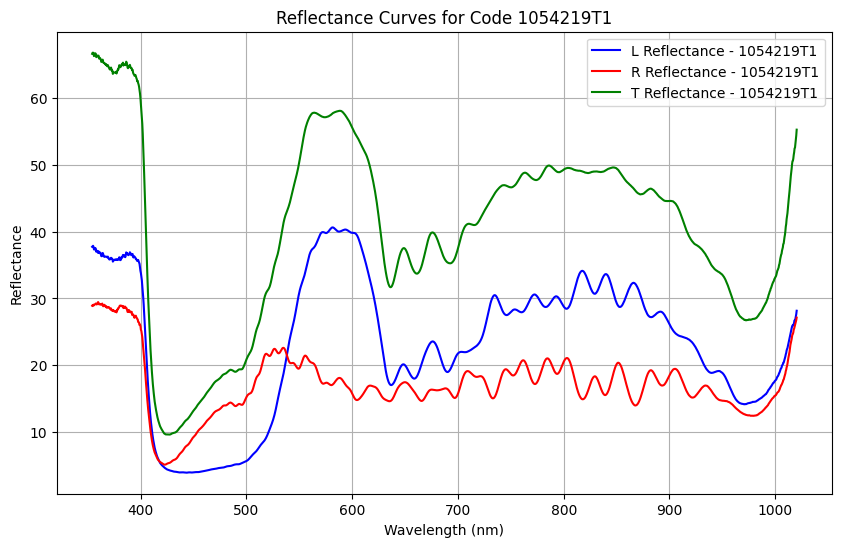

Saved T reflectance for code 1054219T1 to calculated_total_reflectance/1054219T1T.csv


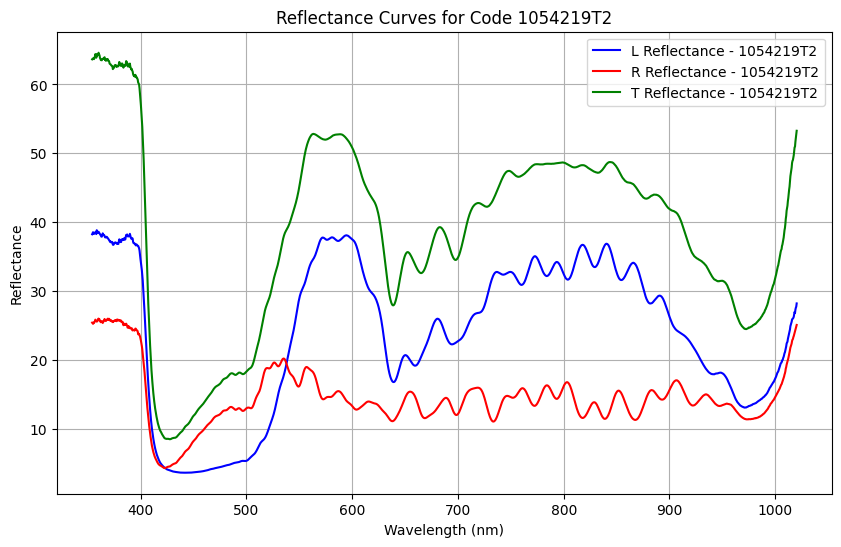

Saved T reflectance for code 1054219T2 to calculated_total_reflectance/1054219T2T.csv


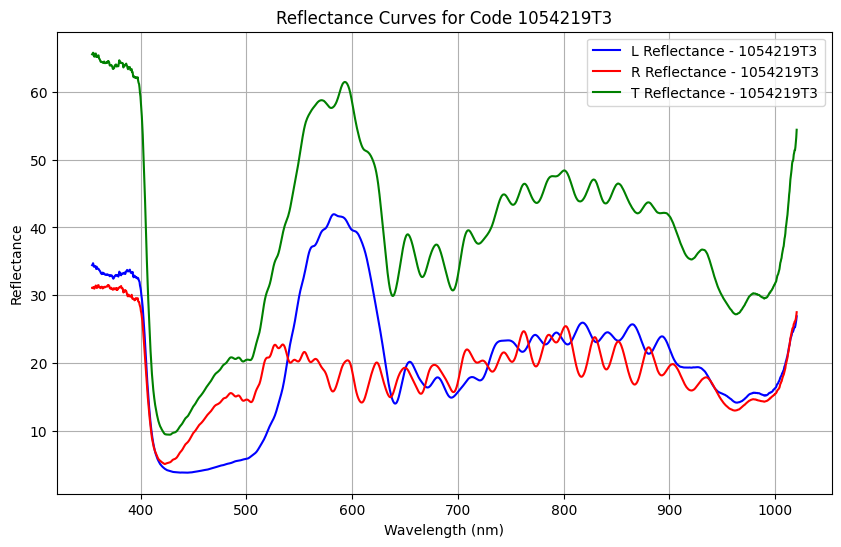

Saved T reflectance for code 1054219T3 to calculated_total_reflectance/1054219T3T.csv


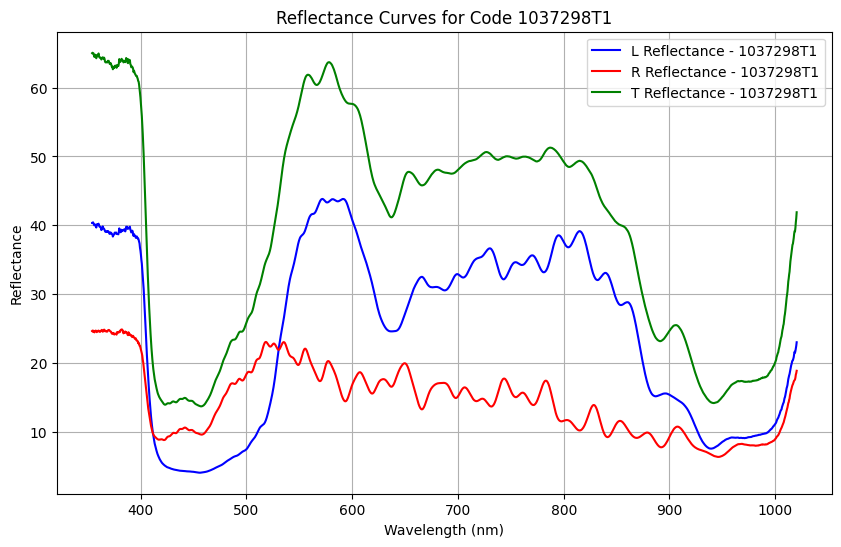

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


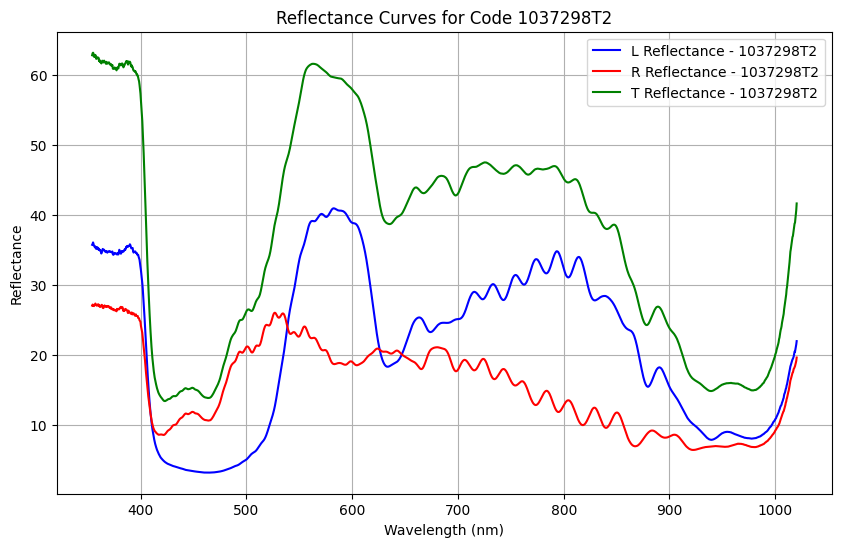

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


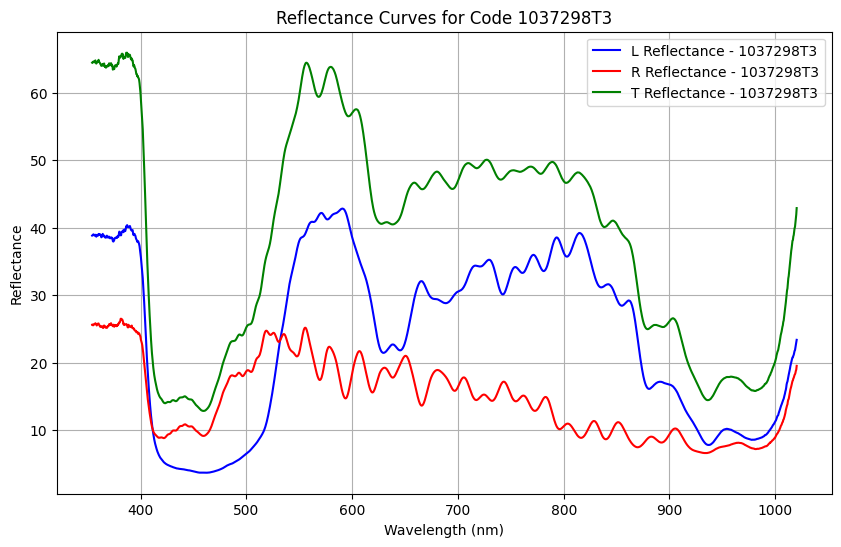

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


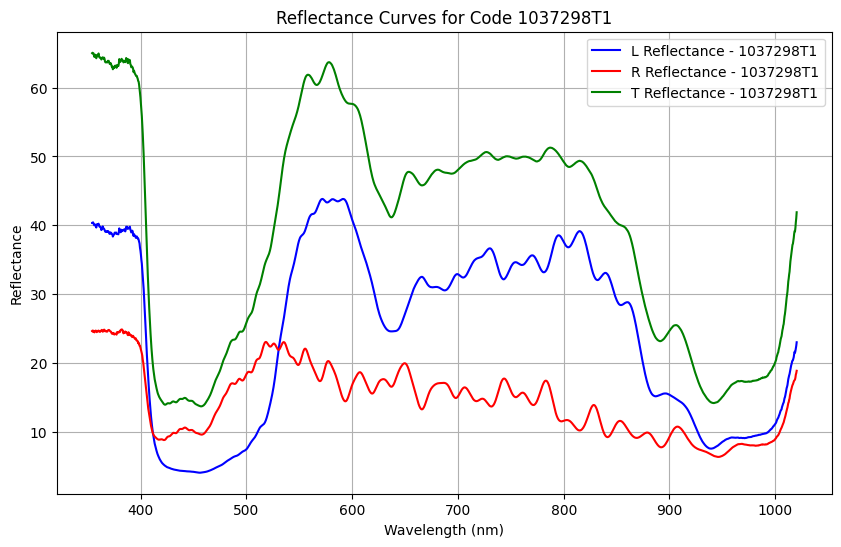

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


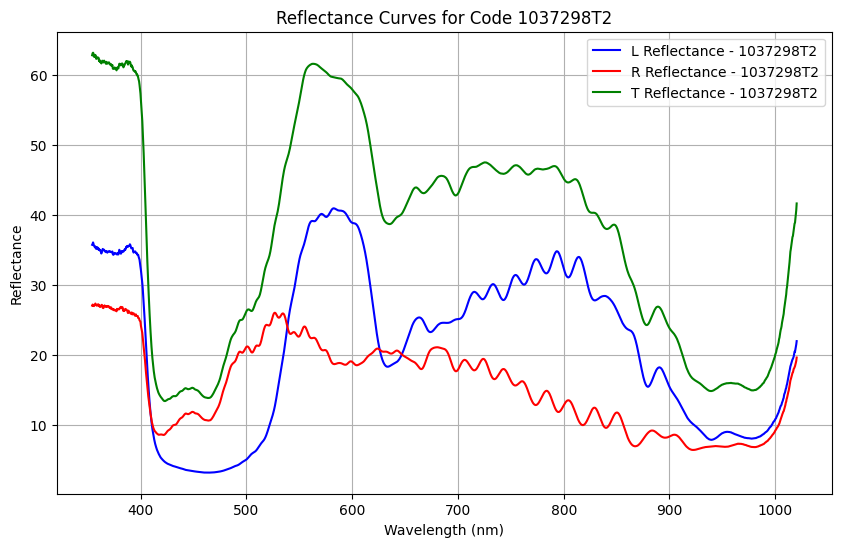

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


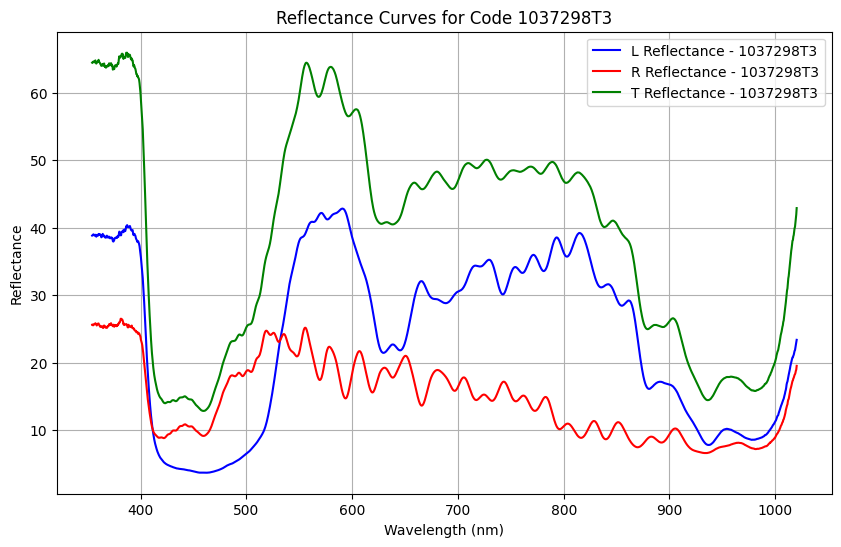

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


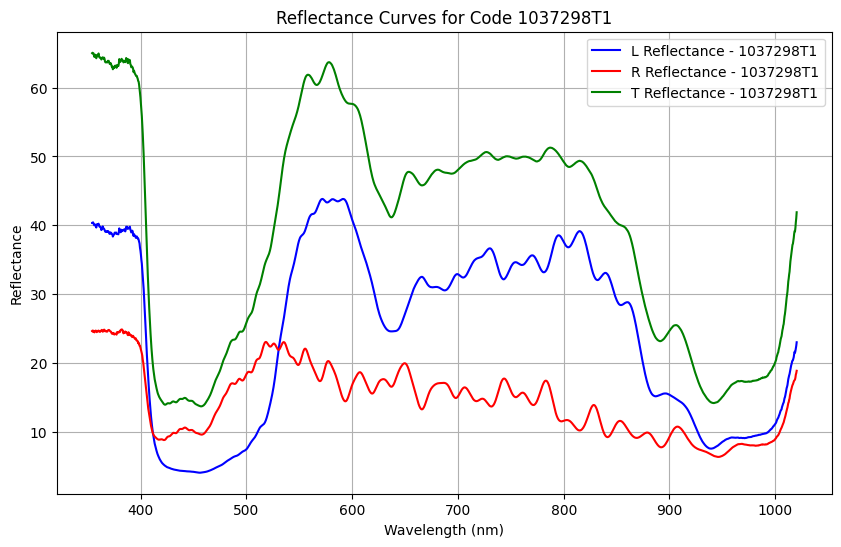

Saved T reflectance for code 1037298T1 to calculated_total_reflectance/1037298T1T.csv


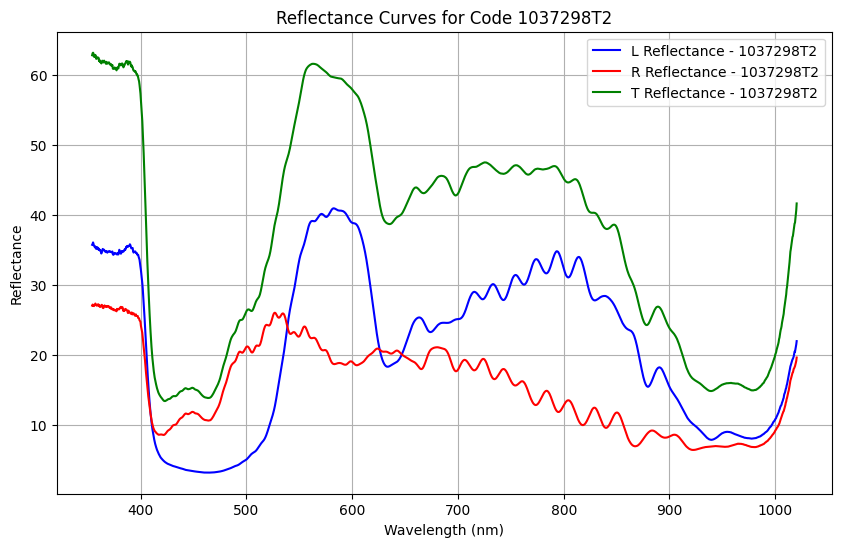

Saved T reflectance for code 1037298T2 to calculated_total_reflectance/1037298T2T.csv


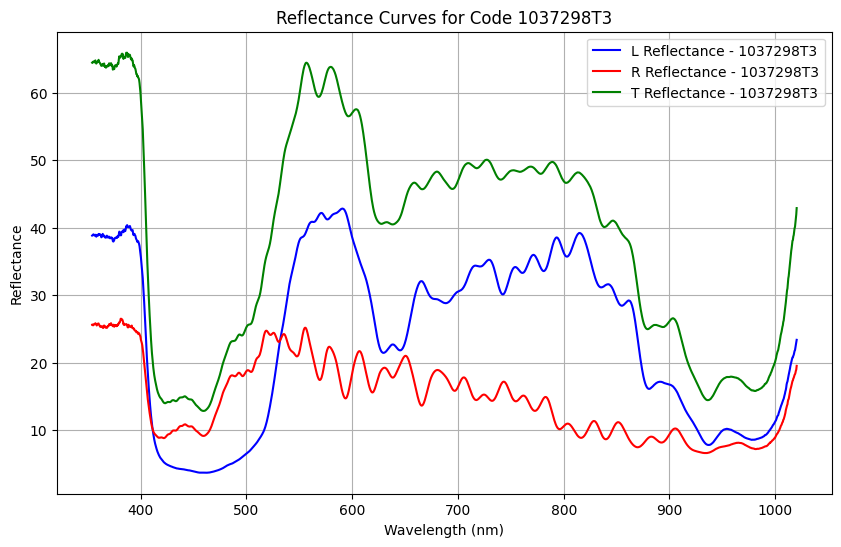

Saved T reflectance for code 1037298T3 to calculated_total_reflectance/1037298T3T.csv


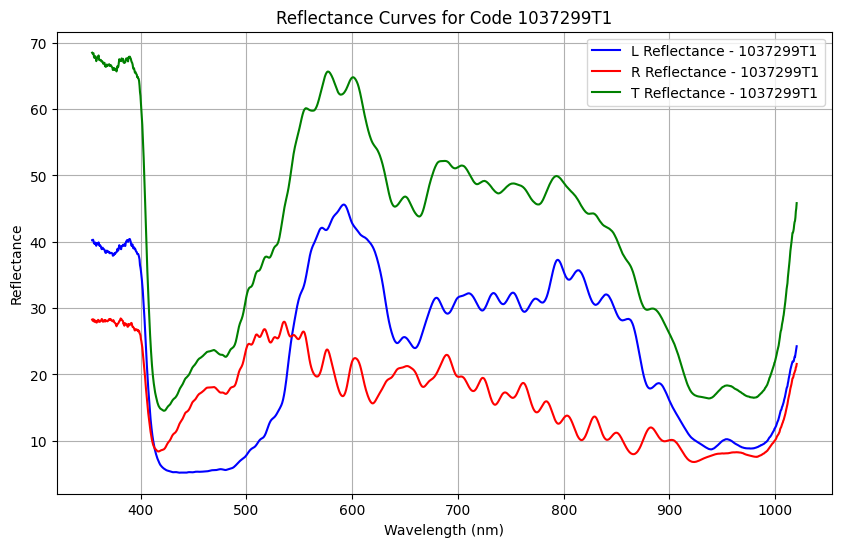

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


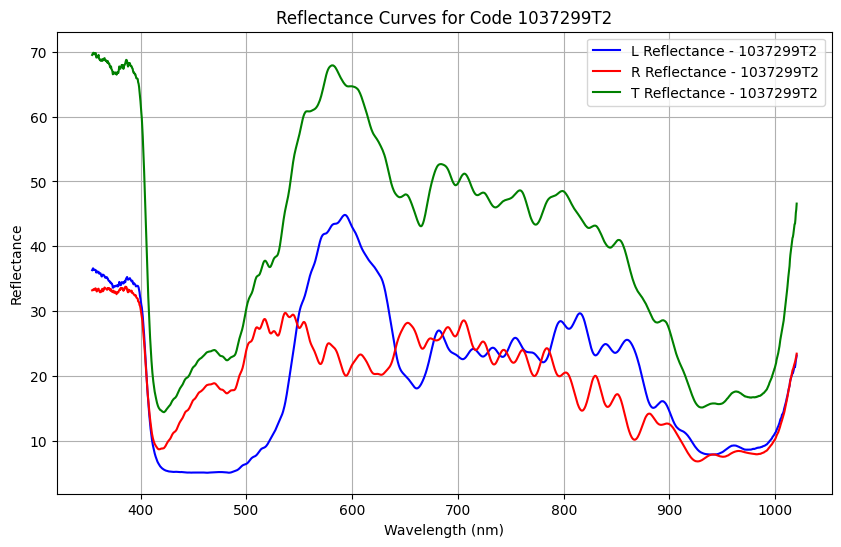

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


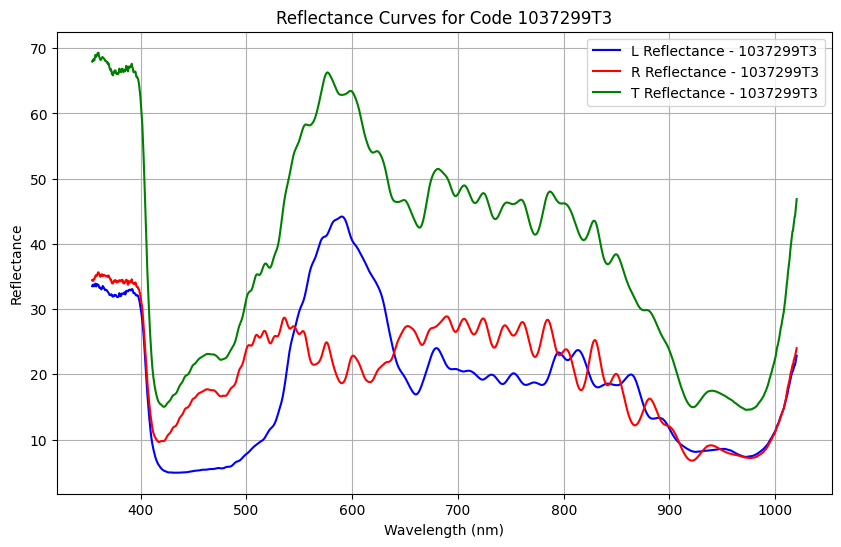

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


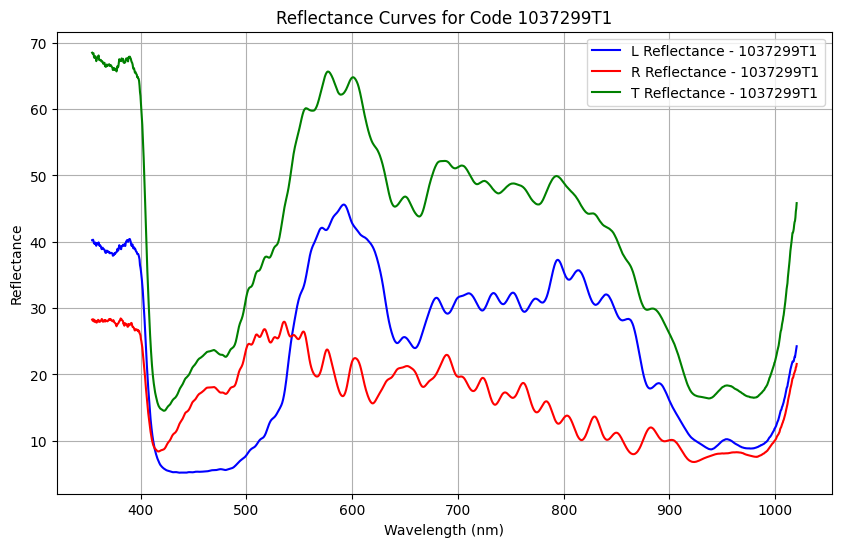

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


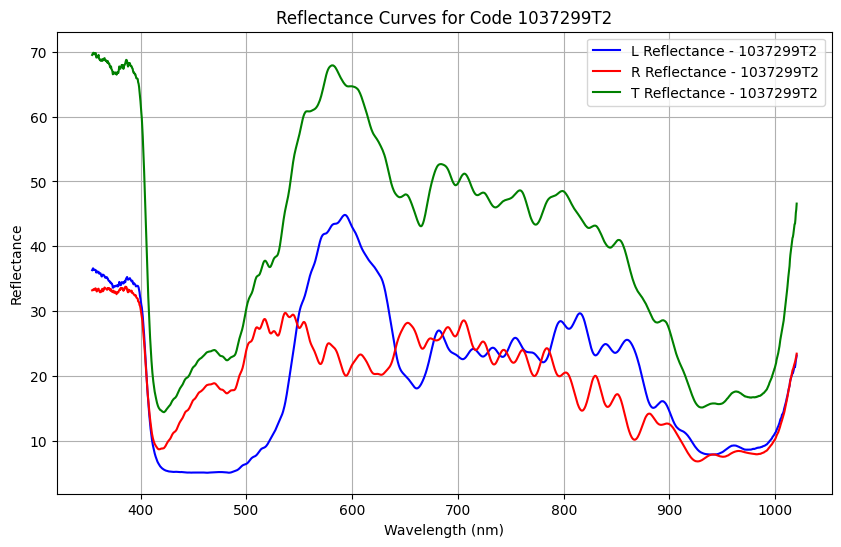

Saved T reflectance for code 1037299T2 to calculated_total_reflectance/1037299T2T.csv


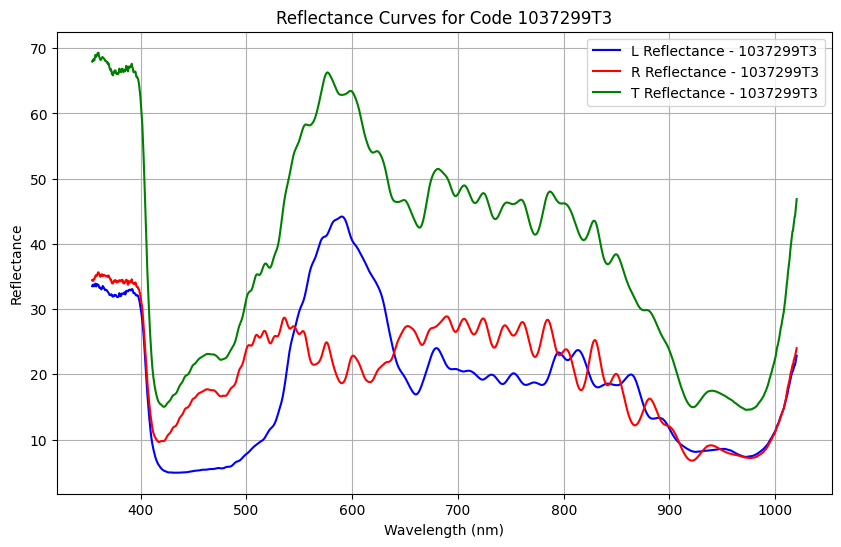

Saved T reflectance for code 1037299T3 to calculated_total_reflectance/1037299T3T.csv


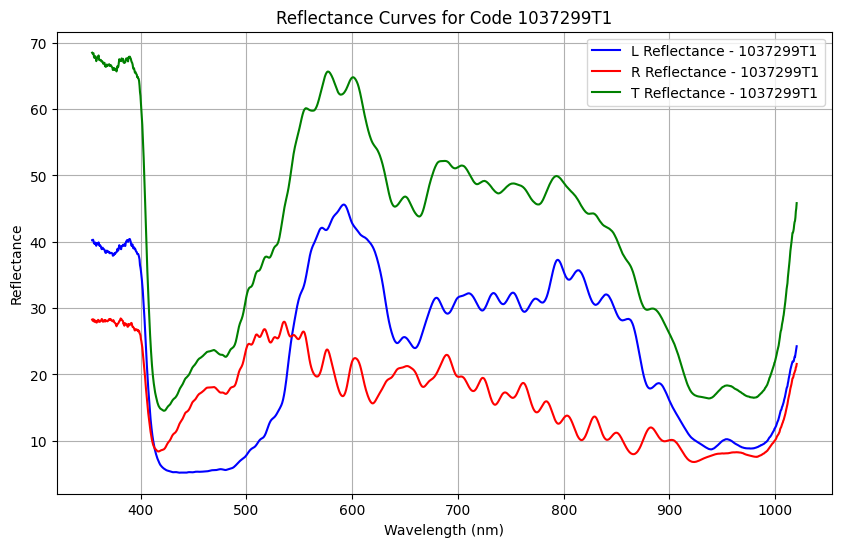

Saved T reflectance for code 1037299T1 to calculated_total_reflectance/1037299T1T.csv


In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import re
import re

def extract_number_after_letter(filename):
    """
    Extracts the first number that appears after the letter 'R' in the given filename.
    
    Args:
    filename (str): The filename from which the number will be extracted.
    
    Returns:
    int: The number that appears after the letter 'R'.
    """
    # Use regular expression to find the number following the letter 'R'
    match = re.search(r'R(\d+)', filename)
    
    if match:
        return int(match.group(1))  # Extract the number after 'R' and convert to integer
    else:
        return None  # Return None if no match is found
        
def process_reflectance_data(parent_directory, folder_name, filtro_L_file, filtro_R_file, mirror_total_reflectance, aluminum_reflectance):
    """
    Process reflectance data for a given folder, calculate the T reflectance, and save it as well as plot the results.
    
    Args:
    - parent_directory (Path): Path to the parent directory where data is stored.
    - folder_name (str): The last part of the folder path (e.g., "Ccupreomarginata").
    - filtro_L_file (str): Path to the filter L reflectance CSV file.
    - filtro_R_file (str): Path to the filter R reflectance CSV file.
    - mirror_total_reflectance (pd.DataFrame): DataFrame for mirror total reflectance.
    - aluminum_reflectance (pd.DataFrame): DataFrame for aluminum reflectance.
    
    Returns:
    - None
    """
    folder_path = parent_directory / folder_name

    # Paths to L and R folders
    L_folder = folder_path / "L" 
    R_folder = folder_path

    # List files in L and R folders
    L_files = get_csv_files(L_folder)
    R_files = get_csv_files(R_folder)

    # Convert paths to string and append folder path
    L_files = [str(L_folder / file) for file in L_files]
    R_files = [str(R_folder / file) for file in R_files]

    # Extract numbers from L_files and R_files into sets
    L_numbers = {extract_number_before_letter(Path(file).name) for file in L_files}
    R_numbers = {extract_number_before_letter(Path(file).name) for file in R_files}

    # Find common numbers and filter files based on those common numbers
    codes = [
        extract_number_before_letter(Path(file).name)
        for file in L_files + R_files
    ]

    codes = [code for code in codes if (code in L_numbers) and (code in R_numbers)]

    samples = []

    # For each code, calculate reflectance data
    for code in codes: 
        for n in ["1", "2", "3"]:
            measured_L_reflectance_file = [file for file in L_files if code in file and "L" +n in file ][0]
            measured_L_reflectance = get_csv_data(measured_L_reflectance_file, x_column="wavelength", y_column="reflectance")
    
            measured_R_reflectance_file = [file for file in R_files if code in file  and "R" +n in file][0]
            measured_R_reflectance = get_csv_data(measured_R_reflectance_file, x_column="wavelength", y_column="reflectance")
    
            filtro_L_reflectancia = get_csv_data(filtro_L_file, x_column="wavelength", y_column="reflectance")
            filtro_R_reflectancia = get_csv_data(filtro_R_file, x_column="wavelength", y_column="reflectance")
    
            # Calculate T reflectance
            measured_T_reflectance = pd.DataFrame([])
            measured_T_reflectance["wavelength"] = measured_L_reflectance["wavelength"]
            measured_T_reflectance["reflectance"] = (measured_R_reflectance["reflectance"] / 100 * filtro_R_reflectancia["reflectance"] + 
                                                     measured_L_reflectance["reflectance"] / 100 * filtro_L_reflectancia["reflectance"]) * \
                                                    mirror_total_reflectance["reflectance"] / (filtro_R_reflectancia["reflectance"] + filtro_L_reflectancia["reflectance"])
            
            # Correct T reflectance
            corrected_T_reflectance = pd.DataFrame([])
            corrected_T_reflectance = correct_reflectance(bad_reflectance=measured_T_reflectance, aluminum_reflectance=aluminum_reflectance)
    
            # Calculate scaled-down reflectances for L and R
            scaled_down_L_reflectance = pd.DataFrame([])
            scaled_down_L_reflectance["wavelength"] = measured_L_reflectance["wavelength"]
            scaled_down_L_reflectance["reflectance"] = measured_L_reflectance["reflectance"] * filtro_L_reflectancia["reflectance"] / 100
    
            scaled_down_R_reflectance = pd.DataFrame([])
            scaled_down_R_reflectance["wavelength"] = measured_R_reflectance["wavelength"]
            scaled_down_R_reflectance["reflectance"] = measured_R_reflectance["reflectance"] * filtro_R_reflectancia["reflectance"] / 100

            #scaled down T reflectance 
            scaled_down_T_reflectance = pd.DataFrame([])
            scaled_down_T_reflectance["wavelength"] = measured_L_reflectance["wavelength"]
            scaled_down_T_reflectance["reflectance"] = scaled_down_L_reflectance["reflectance"] + scaled_down_R_reflectance["reflectance"]

            #Normalized to 50%. normalized_R = (corrected_T_reflectance)* (scaled_down_R / scaled_down_T) 
            normalized_R_reflectance= pd.DataFrame([])
            normalized_R_reflectance["wavelength"] = measured_R_reflectance["wavelength"]
            normalized_R_reflectance["reflectance"] = corrected_T_reflectance["corrected_reflectance"] *(scaled_down_R_reflectance["reflectance"]/scaled_down_T_reflectance["reflectance"])
            
            normalized_L_reflectance= pd.DataFrame([])
            normalized_L_reflectance["wavelength"] = measured_L_reflectance["wavelength"]
            normalized_L_reflectance["reflectance"] = corrected_T_reflectance["corrected_reflectance"] *(scaled_down_L_reflectance["reflectance"]/scaled_down_T_reflectance["reflectance"])
            
            # Append the sample data
            code_dict = {"code": code+"T"+n, "L": normalized_L_reflectance, "R": normalized_R_reflectance, "T": corrected_T_reflectance}
            samples.append(code_dict)
    
        # Create the folder for saving the T reflectances if it doesn't exist
        output_folder = 'calculated_total_reflectance'
        os.makedirs(output_folder, exist_ok=True)
    
        # Iterate over each code in the samples list and plot the data
        for sample in samples:
            #print(sample)
            code = sample["code"]
            measured_L_reflectance = sample["L"]
            measured_R_reflectance = sample["R"]
            measured_T_reflectance = sample["T"]
    
            # Plot the R, L, and T reflectances for the current code
            plt.figure(figsize=(10, 6))
            plt.plot(measured_L_reflectance["wavelength"], measured_L_reflectance["reflectance"], label=f"L Reflectance - {code}", color='blue')
            plt.plot(measured_R_reflectance["wavelength"], measured_R_reflectance["reflectance"], label=f"R Reflectance - {code}", color='red')
            plt.plot(measured_T_reflectance["wavelength"], measured_T_reflectance["corrected_reflectance"], label=f"T Reflectance - {code}", color='green')
    
            # Adding labels and title
            plt.xlabel("Wavelength (nm)")
            plt.ylabel("Reflectance")
            plt.title(f"Reflectance Curves for Code {code}")
            plt.legend()
            plt.grid(True)
    
            # Show the plot
            plt.show()
    
            # Save the T reflectance for the current code in the specified folder
            t_filename = f"{output_folder}/{code}T.csv"
            measured_T_reflectance.to_csv(t_filename, index=False)
    
            print(f"Saved T reflectance for code {code} to {t_filename}")

# Example usage:
excluded =  ["Ccupreomarginata" , "Ccupreomarginata-Talamanca", "Comparacion-cupreo", "Macraspis", "Macraspischrysis", "Resplendens-total"]

for folder in excluded:
    parent_directory = Path(r"C:\Users\esteb\escarabajos\estudio espectral escarabajos data treatment\data\Estudio-espectral-escarabajos")
    folder_name = folder  # This can be any of the other folder names like "Ccupreomarginata-Talamanca", etc.
    process_reflectance_data(parent_directory, folder_name, filtro_L_file = filtro_L_file, filtro_R_file = filtro_R_file, mirror_total_reflectance = mirror_total_reflectance, aluminum_reflectance =aluminum_reflectance)
